# CISC 867: Project 1

## Part I: Data Preparation
* In this project, you will use the Leaf Classification dataset using a neural network architecture.
* You can use keras/tensorflow or write your own routines.

### 1) First, download the data file, load it, and
1. Describe the data
2. Clean the data
3. Check the data for missing values or duplicates and carry out proper correction methods
4. Visualize the data using proper visualization methods.
5. Draw some of the images
6. Carry out required correlation analysis
### 2) Encode the labels
### 3) Decide if you need to standardize the data, by computing the mean and standard deviation for each feature dimension using the training set only, then subtracting the mean and dividing by the stdev for each feature and each sample.
### 4) Divide the data into a training and test set using approximately 80% for training.

## Import the needed Libraries which we will use in our project 

In [1]:
pip install simple-colors

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import datetime #datetime in Python is the combination between dates and times.
import numpy as np #NumPy is the fundamental package for scientific computing in Python. 
import pandas as pd #pandas is a fast, powerful, flexible and easy to use open source data analysis and manipulation tool
import seaborn as sns #Seaborn is a Python data visualization library based on matplotlib.
import tensorflow as tf #TensorFlow is an open-source end-to-end framework for building Machine Learning apps.
from simple_colors import * # to print colored , bolded and underlined text
from tensorflow import keras#Keras is a high-level, deep learning API developed by Google for implementing neural networks.
import matplotlib.pyplot as plt #Is a comprehensive library for creating static, animated, and interactive visualizations.
from keras.regularizers import l2 
from keras.models import Sequential
# sklearn is an open source data analysis library, and the gold standard for Machine Learning (ML) in the Python ecosystem.
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from tensorflow.keras.layers import Input , Dense , Flatten ,Dropout
from tensorflow.keras.optimizers import  SGD, Adam, Adagrad, Adadelta, Adamax
sns.set()  #Set aesthetic parameters in one step.

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Upload the data to Leaf Classification folder in colab then load the train csv file 

In [4]:
df = pd.read_csv("/content/drive/MyDrive/Leaf-Classification/train.csv") #using the pandas to read cs file 
df

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1575,Magnolia_Salicifolia,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,1578,Acer_Pictum,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,1581,Alnus_Maximowiczii,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,1582,Quercus_Rubra,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


### Check the columns types, there names and the chech there in nulls or not

In [5]:
df.info() #This method prints information about a DataFrame including the index dtype and columns, non-null values and memory usage.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Columns: 194 entries, id to texture64
dtypes: float64(192), int64(1), object(1)
memory usage: 1.5+ MB


### But we can't show the information since train csv file has many number of columns.

In [6]:
# So we will pass the following parameters 
#verbose:Whether to print the full summary.
#memory_usagebool:Specifies whether total memory usage of the DataFrame elements (including the index) should be displayed.
#show_counts:Whether to show the non-null counts.
df.info(verbose=True,max_cols=34,memory_usage=True,show_counts=True) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Data columns (total 194 columns):
 #    Column     Non-Null Count  Dtype  
---   ------     --------------  -----  
 0    id         990 non-null    int64  
 1    species    990 non-null    object 
 2    margin1    990 non-null    float64
 3    margin2    990 non-null    float64
 4    margin3    990 non-null    float64
 5    margin4    990 non-null    float64
 6    margin5    990 non-null    float64
 7    margin6    990 non-null    float64
 8    margin7    990 non-null    float64
 9    margin8    990 non-null    float64
 10   margin9    990 non-null    float64
 11   margin10   990 non-null    float64
 12   margin11   990 non-null    float64
 13   margin12   990 non-null    float64
 14   margin13   990 non-null    float64
 15   margin14   990 non-null    float64
 16   margin15   990 non-null    float64
 17   margin16   990 non-null    float64
 18   margin17   990 non-null    float64
 19   margin18   990 non-null    

### Describe the data

In [7]:
df.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,452.477568,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,0.008933,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,415.250000,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.001953,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,802.500000,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,0.005859,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,1195.500000,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,0.007812,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,1584.000000,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,0.076172,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


### Check the data for missing values or duplicates and carry out proper correction methods

In [8]:
#Check if there is any null at any column in df using isnull 
print(df.isnull().sum().any())

False


In [9]:
df.duplicated().sum()

0

* So, there is no null values or duplicated values too.

### Visualize the data using proper visualization methods.

<ipython-input-10-5e129c4dae2a>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


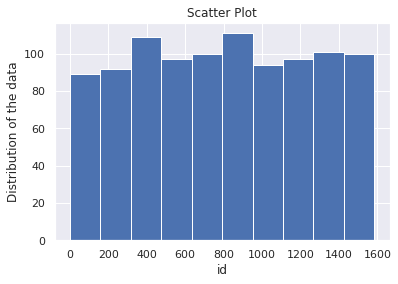

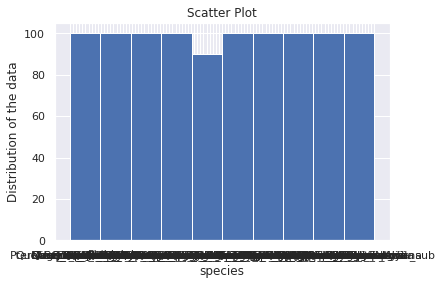

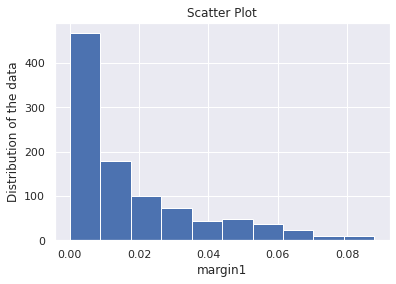

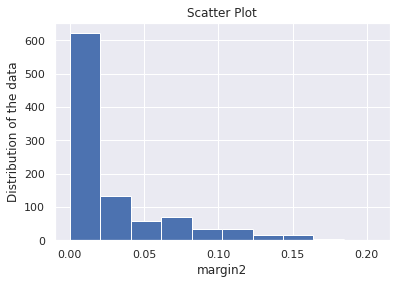

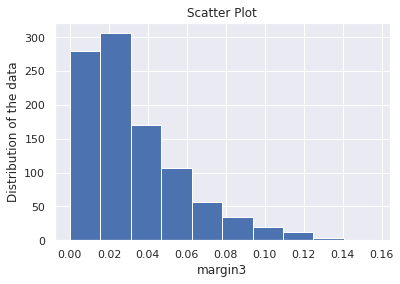

...

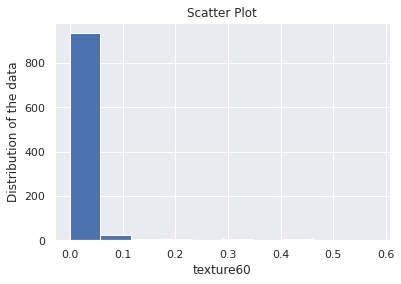

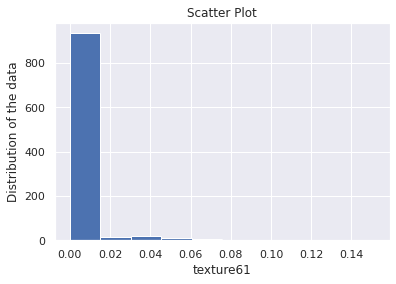

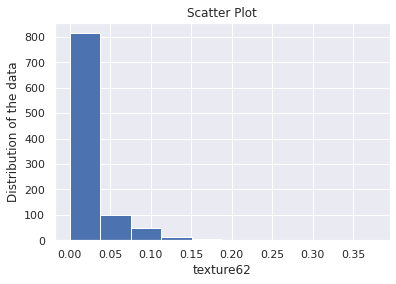

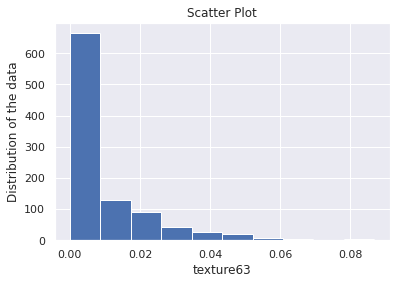

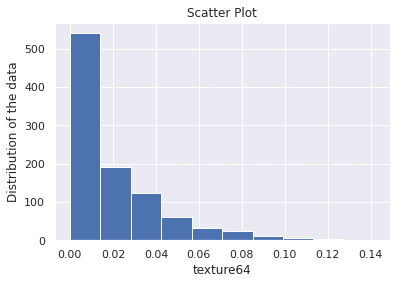

In [10]:
for i in df.columns: #Plot each column in the data 
    plt.figure()
# Adding Title to the Plot
    plt.title("Scatter Plot")
 
# Setting the X and Y labels
    plt.xlabel(i)
    plt.ylabel('Distribution of the data')
    plt.hist(df[i])

#df.hist(figsize=(25,25)) we can use this without using for loop 

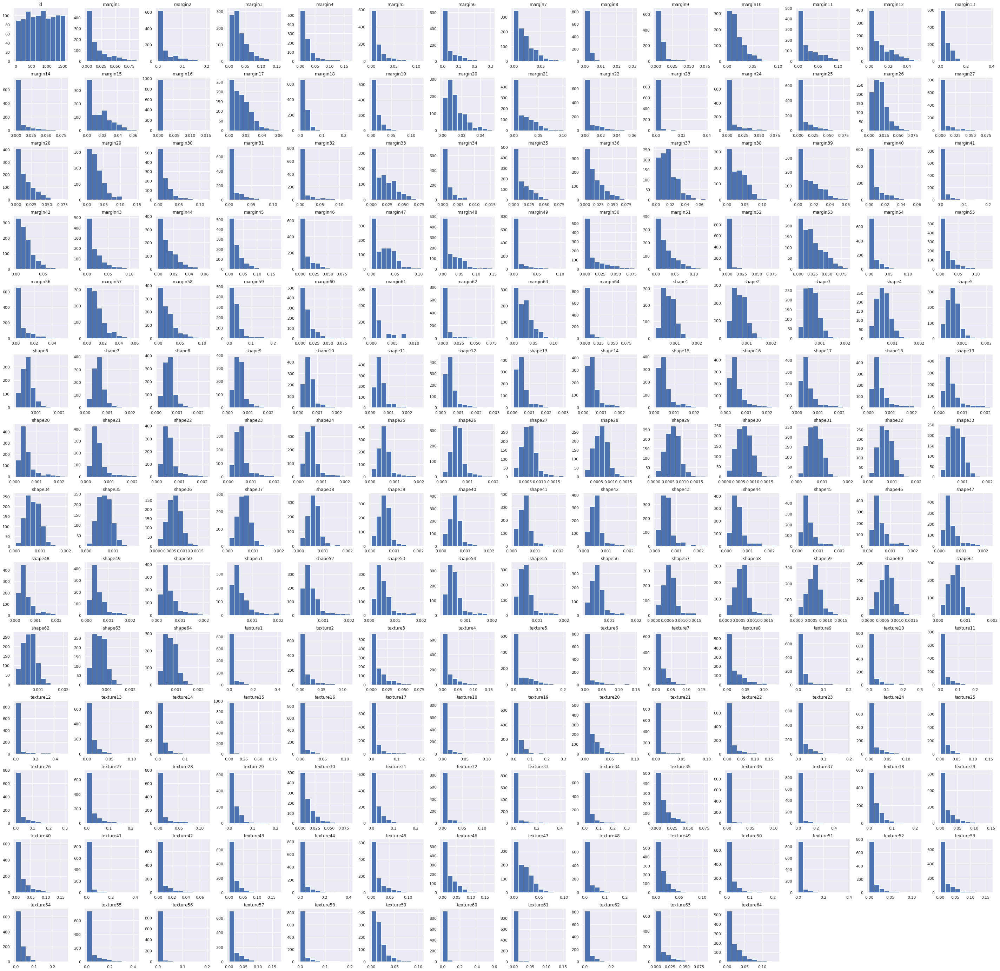

In [11]:
df.hist(figsize=(50,50));

<Axes: ylabel='Density'>

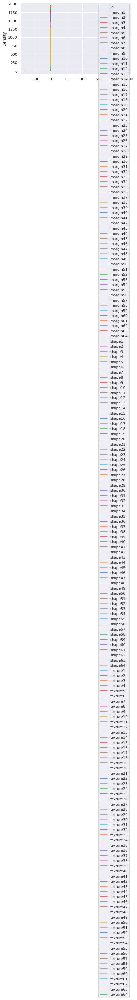

In [12]:
"""A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset,
analogous to a histogram.KDE represents the data using a continuous probability density curve in one or more dimensions."""
df.plot.kde()

* As we see from the plot, the min value of most of columns is almost 0 and the max value is almost 1,so we don't need to normalize our data
* Although its known that kde is continuous probability density curve, it looks like verticle line means that the data in the same range 

### Draw some of the images

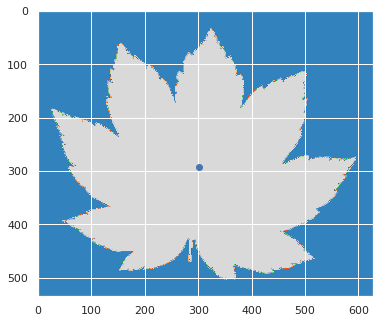

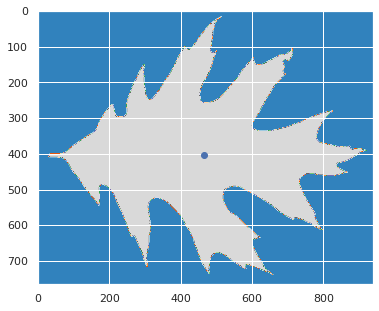

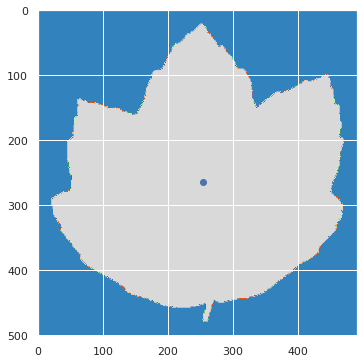

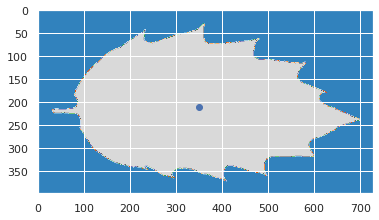

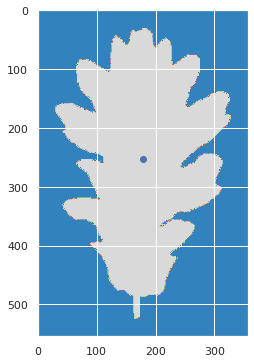

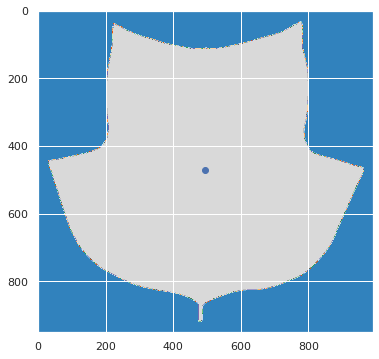

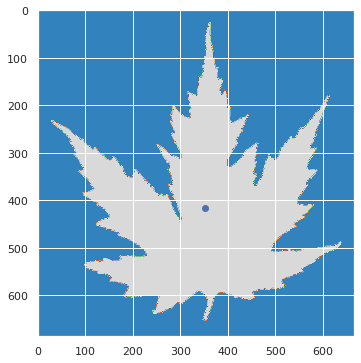

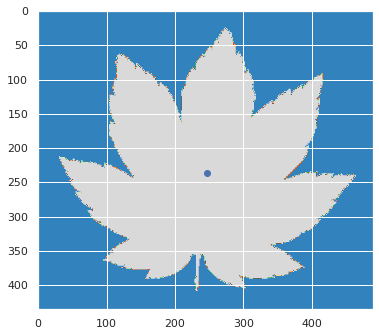

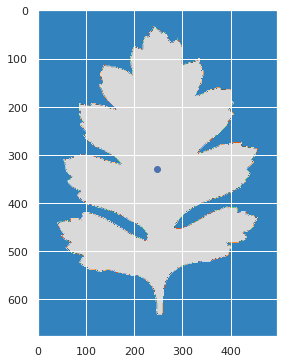

In [22]:
# imports
import matplotlib.image as mpimg       # reading images to numpy arrays
import matplotlib.patches as mpatches  # to draw a circle at the mean contour
from skimage import measure            # to find shape contour
import scipy.ndimage as ndi            # to determine shape centrality

# matplotlib setup
%matplotlib inline
from pylab import rcParams
rcParams['figure.figsize'] = (6, 6)      # setting default size of plots


# reading an image file using matplotlib into a numpy array
# choosed ones: 9,11, 19, 21, 29, 48, 167, 192, 218
list_images = ['9','11', '19', '21', '29', '48', '167', '192', '218']
for i in list_images:
    img = mpimg.imread('/content/drive/MyDrive/Leaf-Classification/Images/'+i+'.jpg')

    # using image processing module of scipy to find the center of the leaf
    cy, cx = ndi.center_of_mass(img)

    plt.imshow(img, cmap='tab20c')  # show me the leaf
    plt.scatter(cx, cy)           # show me its center
    plt.show()


# Carry out required correlation analysis

In [12]:
""" A correlation heatmap is a graphical representation of a correlation matrix 
representing the correlation between different variables.
The value of correlation can take any value from -1 to 1.
Correlation between two random variables or bivariate data does not necessarily imply a causal relationship.
So i will find correlation using heat map"""
Corr_Mat = df.corr()
Corr_Mat.style.background_gradient(cmap="BrBG")

## 2) Encode the labels (species column)

* The primary need for using one-hot encoding technique is to transform or convert the categorical features into numerical features such that machine learning libraries can use the values to train the model. Although, many machine learning library internally converts them, but it is recommended to convert these categorical features explicitly into numerical features (dummy features)

In [13]:
df.species.value_counts()

Acer_Opalus                    10
Crataegus_Monogyna             10
Acer_Mono                      10
Magnolia_Heptapeta             10
Acer_Capillipes                10
                               ..
Alnus_Rubra                    10
Rhododendron_x_Russellianum    10
Cytisus_Battandieri            10
Liriodendron_Tulipifera        10
Sorbus_Aria                    10
Name: species, Length: 99, dtype: int64

In [14]:
from sklearn.preprocessing import OneHotEncoder
# creating instance of one-hot-encoder
enc = OneHotEncoder(handle_unknown='ignore')
# passing species column (label encoded values of bridge_types)
Y = pd.DataFrame(enc.fit_transform(df[['species']]).toarray())

### 3) Decide if you need to standardize the data, by computing the mean and standard deviation for each feature dimension using the training set only, then subtracting the mean and dividing by the stdev for each feature and each sample.

* As we see from the plot, the min value of most of columns is almost 0 and the max value is almost 1,so we don't need to normalize our data
* Although its known that kde is continuous probability density curve, it looks like verticle line means that the data in the same range

### 4) Divide the data into a training and test set using approximately 80% for training.

In [15]:
X = df.iloc[:, :]
X.drop(['species', 'id'], axis = 1, inplace = True) # drop the columns of species
X.head()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,0.001953,0.033203,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,0.000000,0.007812,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.0,0.0,0.000977,0.039062,0.022461
2,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,0.000000,0.044922,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.0,0.0,0.000000,0.020508,0.002930
3,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,0.013672,0.017578,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.0,0.0,0.017578,0.000000,0.047852
4,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,0.000000,0.005859,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.031250


In [16]:
# Divide the data into train and test by 80% for training
xTrain, xTest, yTr, yTest = train_test_split(X, Y, test_size = 0.2, random_state = 42)

print(xTrain.shape)
print(xTest.shape)
print(yTr.shape)
print(yTest.shape)

(792, 192)
(198, 192)
(792, 99)
(198, 99)


In [17]:
# Divide the training set itself into train set and validation set which is used to tune hyperparameters 
xTrain, X_val, yTrain, y_val = train_test_split(xTrain, yTr, test_size=0.15, random_state=42)

print(xTrain.shape)
print(xTest.shape)
print(X_val.shape)
print(y_val.shape)

(673, 192)
(198, 192)
(119, 192)
(119, 99)


#### Part II
##### Training a neural network In this project, you need to implement a 3-layer MLP model (one input layer, one hidden layer with tanh activation and one output layer) which will be used to classify the data in Part I. You can use the built-in modules in keras to build your model.

* You also need to write the training function (training), and should explore the following hyperparameter settings:
    * Batch size: Number of examples per training iteration.
    * Hidden size: Try using different number of hidden nodes in your model and compare the performances.
    * Dropout is an effective strategy to defend against overfitting. Adding a dropout layer after the hidden layer, and try using different dropout rate to compare the performances.
    * Optimizer: Try using different optimizers such as SGD, Adam, RMSProp.
    * Regularization (weight decay): L2 regularization can be specified by setting the weight_decay parameter in optimizer. Try using different regularization factor and check the performance.
    * Learning rate, Learning rate scheduler: Learning rate is key hyperparameter in model training, and you can gradually decreasing the learning rate to further improve your model. Try using different learning rate and different learning rate scheduler to compare the performance.

* To get full credit, you should explore at least 4 different type of hyperparameters (from listed above), and choose at least 3 different values for each hyperparameters. For simplicity, you could analyze one hyperparameter at a time (i.e. fixing all others to some reasonable value), rather than perfoming grid search. If you use TensorBoard to monitor your training, you can directly attach the screenshots of the training curves (accuracy) in your report. To evaluate the performance of trained model, you also need to write a function (evaluation) which loads the trained model and evaluate its performance on train/test set.

### We will build our deep learning model using 3 function:
* 1- Deep learning architecture(3-layer MLP model (one input layer, one hidden layer with tanh activation and one output layer)
* 2- One function for virtualization of accuracy and val_accuracy
* 3- One function for virtualization of loss and val_loss

* 1- Deep learning architecture(3-layer MLP model (one input layer, one hidden layer with tanh activation and one output layer)
* This function has multiple hyperparameters which is Batch size,Hidden size,Optimizer:, Dropout rate, Regularization and Learning rate   
* For any function there are default values for the parameters which will be passed 

In [18]:
"""
1- Define Keras Model
Model in Keras always defines as a sequence of layers.
It means that we initialize the sequence model and add the layers one after the other 
which is executed as the sequence of the list.
2- Compile The Keras Model
It uses the backend numerical libraries such as TensorFlow or Theano.
Whatever backend you are using automatically chooses the best way to represent the network on your hardware as CPU, GPU, or TPU.
3- Start Training (Fit the Model)
We need to define a number of epochs and batch size over which training occurs.
Epoch – one single pass through all the rows in the training dataset
Batch size – number of samples considered by the model before updating the weights.
4- Evaluate the Model
After training the model let’s know the performance of a neural network. Model is always evaluated on a test set.
5- Making Predictions
predict the output of new data by simply using predict method.
"""
def MLP_Model(Optimizer= Adam , Batch_size = 32,  Hidden_size = 512, Dropout_rate = 0.5):
    
    model = Sequential()
  # In layer_1 our activation function is 'tanh' with default 512 neurons and kernel_initializer 'glorot_uniform'
    model.add(Dense(Hidden_size, activation='tanh', input_shape=(X.shape[1],), kernel_initializer = 'glorot_uniform', bias_initializer='zeros', name = 'Layer_1'))
  #dropout some nerouns to avoid overfitting
    model.add(Dropout(Dropout_rate))
  #output layer with softmax activation function and has 99 nodes for output shape
    model.add(Dense(99 , activation='softmax', name = 'Output'))
  #Apply one of the optimizer and choose the learning rate inside each one 
    if Optimizer == 'Adam':
        lr_schedule = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=1e-3, decay_steps=10000, decay_rate=0.9)
        Optimizer = Adam(learning_rate = lr_schedule)
    elif Optimizer == 'RMSprop':
        Optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.01,rho=0.9,momentum=0.0,epsilon=1e-07,centered=False, name="RMSprop")
    elif Optimizer == 'SGD':
        Optimizer = tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.9, nesterov=False, name="SGD")
    #compile the model with sparse_categorical_crossentropy loss function and accuracy metrics 
    model.compile(optimizer = Optimizer ,loss='CategoricalCrossentropy' , metrics=['accuracy'])

  #fit the model with 100 epoch
    history = model.fit(xTrain , yTrain , epochs=100 , batch_size=Batch_size , validation_data=(X_val, y_val))

  #return the training model and the history
    return model, history

def Virtualization_Acc(model_name, history):
    model_history = pd.DataFrame(history.history)
    model_history['epoch'] = history.epoch
    fig, ax = plt.subplots(figsize=(14,8))
    num_epochs = model_history.shape[0]
    ax.plot(np.arange(0, num_epochs), model_history["accuracy"], label="Training accuracy", lw=3, color='#f4b400')
    ax.plot(np.arange(0, num_epochs), model_history["val_accuracy"], label="Validation accuracy", lw=3, color='#0f9d58')
    ax.legend()
    plt.tight_layout()
    plt.show()
    
def Virtualization_Loss(model_name, history):
    model_history = pd.DataFrame(history.history)
    model_history['epoch'] = history.epoch
    fig, ax = plt.subplots(figsize=(14,8))
    num_epochs = model_history.shape[0]
    ax.plot(np.arange(0, num_epochs), model_history["loss"], label="Training loss", lw=3, color='#f4b400')
    ax.plot(np.arange(0, num_epochs), model_history["val_loss"], label="Validation loss", lw=3, color='#0f9d58')
    ax.legend()
    plt.tight_layout()
    plt.show()

The batch_size is: 16, The hidden_size is: 64, The dropout_rate is: 0.2, The optimizer_name is : SGD
Epoch 1/100
43/43 [==============================] - 1s 13ms/step - loss: 4.6175 - accuracy: 0.0045 - val_loss: 4.6355 - val_accuracy: 0.0084
Epoch 2/100
43/43 [==============================] - 0s 7ms/step - loss: 4.5929 - accuracy: 0.0163 - val_loss: 4.6044 - val_accuracy: 0.0336
Epoch 3/100
43/43 [==============================] - 0s 6ms/step - loss: 4.5434 - accuracy: 0.0267 - val_loss: 4.5956 - val_accuracy: 0.0084
Epoch 4/100
43/43 [==============================] - 0s 7ms/step - loss: 4.4749 - accuracy: 0.0357 - val_loss: 4.5065 - val_accuracy: 0.0756
Epoch 5/100
43/43 [==============================] - 0s 6ms/step - loss: 4.3631 - accuracy: 0.0639 - val_loss: 4.4262 - val_accuracy: 0.0672
Epoch 6/100
43/43 [==============================] - 0s 6ms/step - loss: 4.1963 - accuracy: 0.0773 - val_loss: 4.2188 - val_accuracy: 0.1008
Epoch 7/100
43/43 [==============================] -

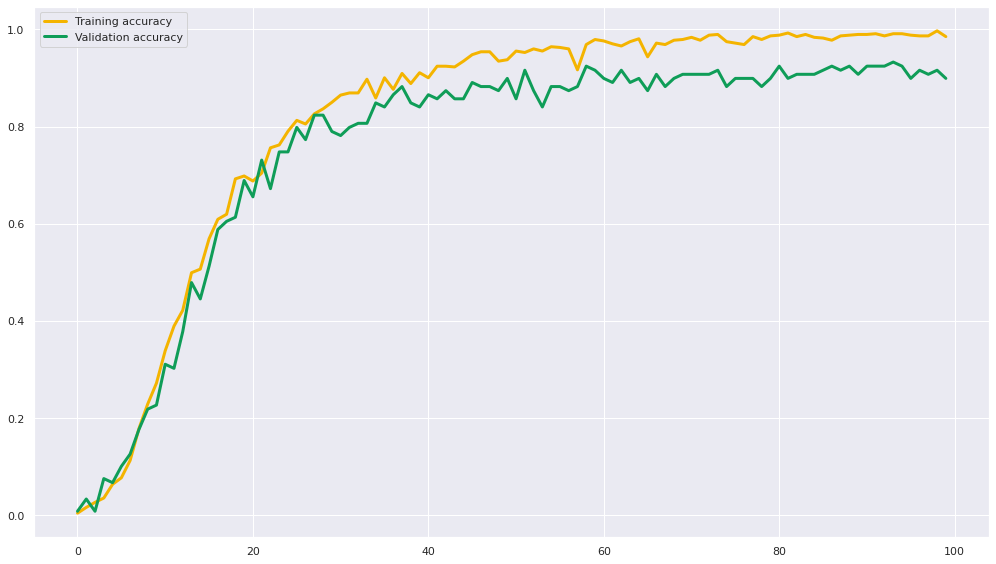

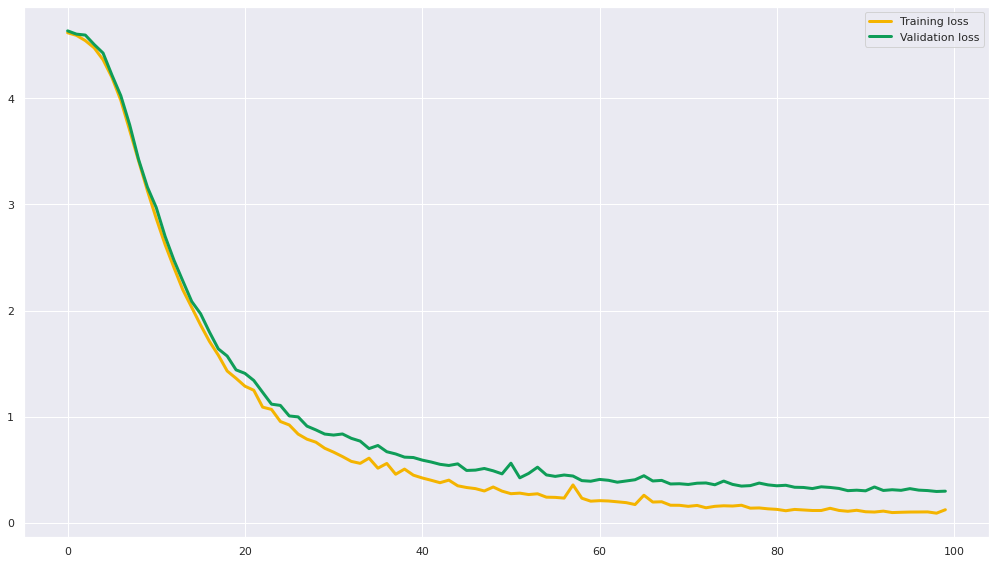

1
                                                                                                                            
The batch_size is: 16, The hidden_size is: 64, The dropout_rate is: 0.2, The optimizer_name is : Adam
Epoch 1/100
43/43 [==============================] - 1s 11ms/step - loss: 4.5890 - accuracy: 0.0253 - val_loss: 4.5652 - val_accuracy: 0.0756
Epoch 2/100
43/43 [==============================] - 0s 5ms/step - loss: 4.5510 - accuracy: 0.0832 - val_loss: 4.5377 - val_accuracy: 0.1176
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 4.5102 - accuracy: 0.1545 - val_loss: 4.4988 - val_accuracy: 0.2101
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 4.4549 - accuracy: 0.2273 - val_loss: 4.4442 - val_accuracy: 0.2605
Epoch 5/100
43/43 [==============================] - 0s 3ms/step - loss: 4.3789 - accuracy: 0.2972 - val_loss: 4.3687 - val_accuracy: 0.2521
Epoch 6/100
43/43 [==============================] - 0s 3ms/step 

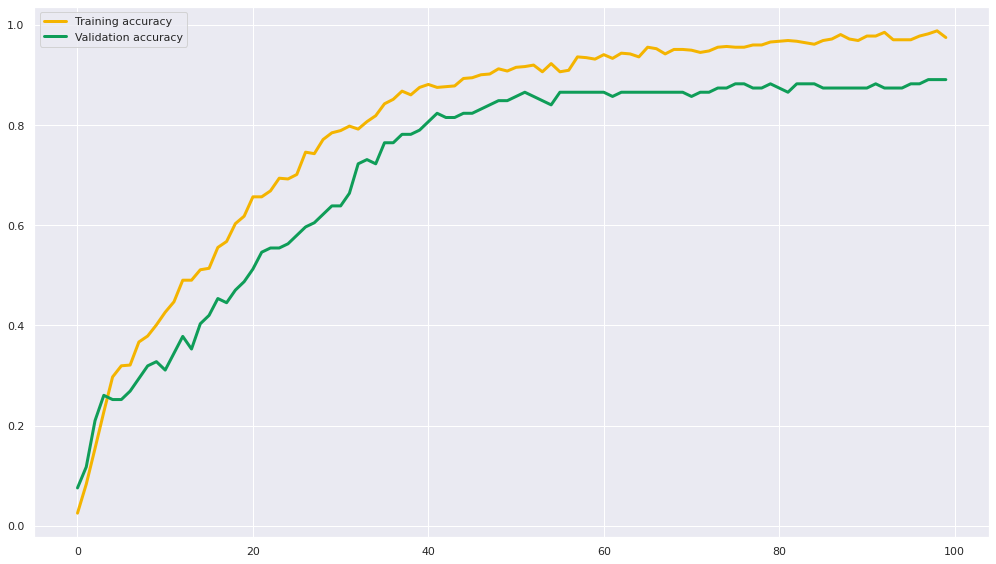

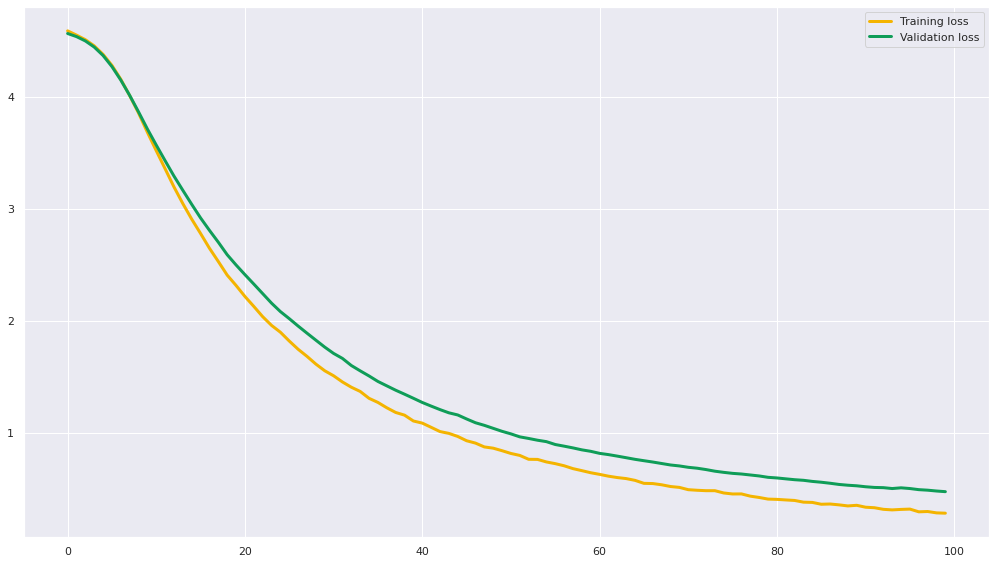

2
                                                                                                                            
The batch_size is: 16, The hidden_size is: 64, The dropout_rate is: 0.2, The optimizer_name is : RMSprop
Epoch 1/100
43/43 [==============================] - 3s 52ms/step - loss: 4.4466 - accuracy: 0.0817 - val_loss: 4.1370 - val_accuracy: 0.1765
Epoch 2/100
43/43 [==============================] - 0s 4ms/step - loss: 3.6608 - accuracy: 0.2571 - val_loss: 3.3627 - val_accuracy: 0.2521
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 2.8537 - accuracy: 0.3997 - val_loss: 2.7320 - val_accuracy: 0.3445
Epoch 4/100
43/43 [==============================] - 0s 3ms/step - loss: 2.2584 - accuracy: 0.5305 - val_loss: 2.2345 - val_accuracy: 0.5042
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 1.7969 - accuracy: 0.6315 - val_loss: 1.8016 - val_accuracy: 0.6218
Epoch 6/100
43/43 [==============================] - 0s 3ms/st

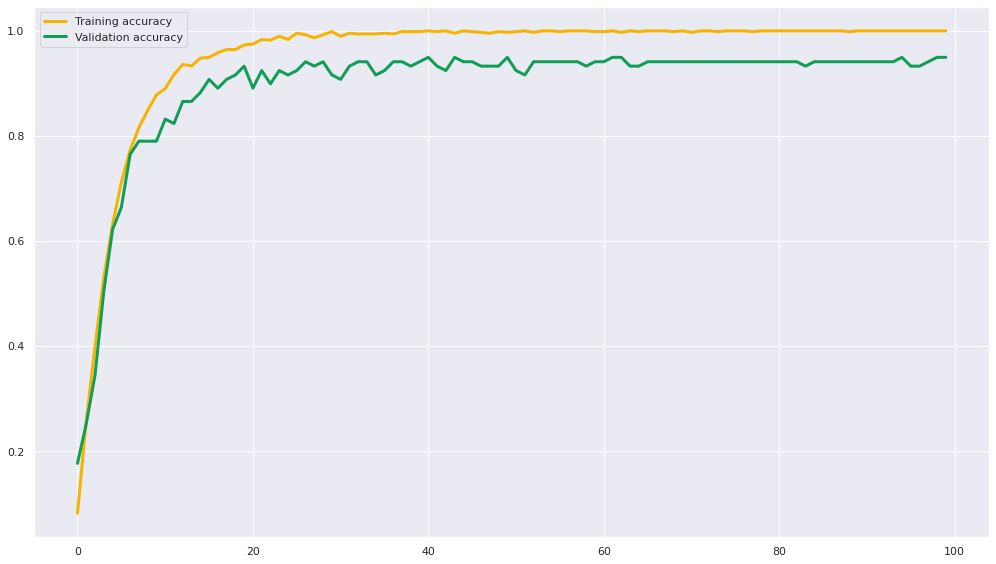

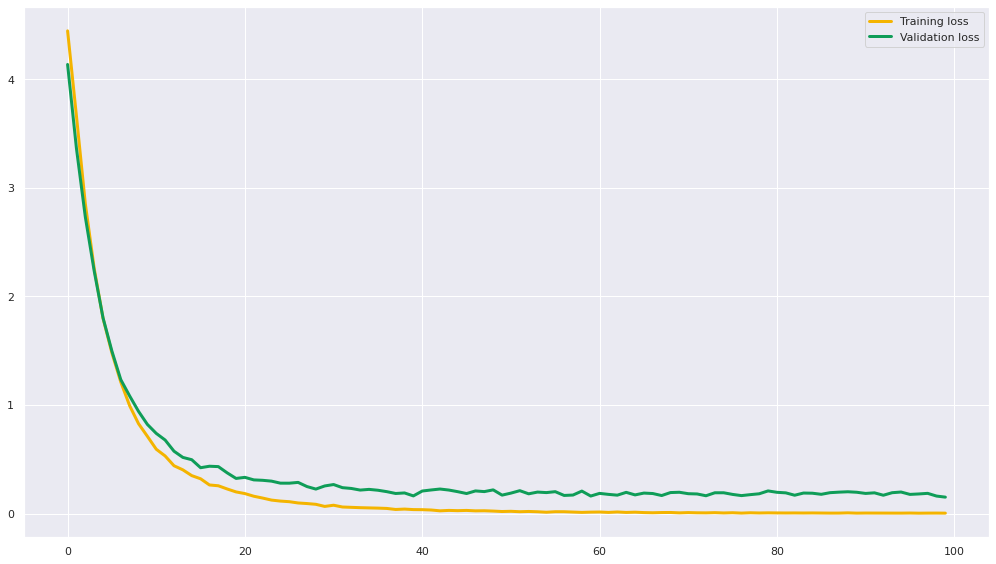

3
                                                                                                                            
The batch_size is: 16, The hidden_size is: 64, The dropout_rate is: 0.4, The optimizer_name is : SGD
Epoch 1/100
43/43 [==============================] - 1s 10ms/step - loss: 4.6139 - accuracy: 0.0119 - val_loss: 4.6117 - val_accuracy: 0.0000e+00
Epoch 2/100
43/43 [==============================] - 0s 3ms/step - loss: 4.6008 - accuracy: 0.0178 - val_loss: 4.5957 - val_accuracy: 0.0168
Epoch 3/100
43/43 [==============================] - 0s 7ms/step - loss: 4.5559 - accuracy: 0.0267 - val_loss: 4.5711 - val_accuracy: 0.0252
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 4.4722 - accuracy: 0.0401 - val_loss: 4.4864 - val_accuracy: 0.0588
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 4.3669 - accuracy: 0.0654 - val_loss: 4.3984 - val_accuracy: 0.1008
Epoch 6/100
43/43 [==============================] - 0s 5ms/st

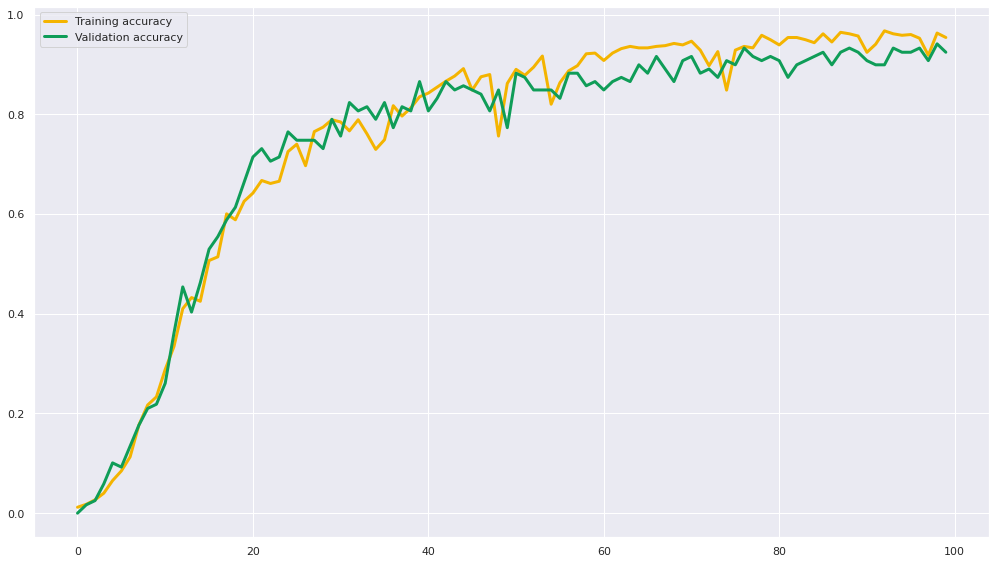

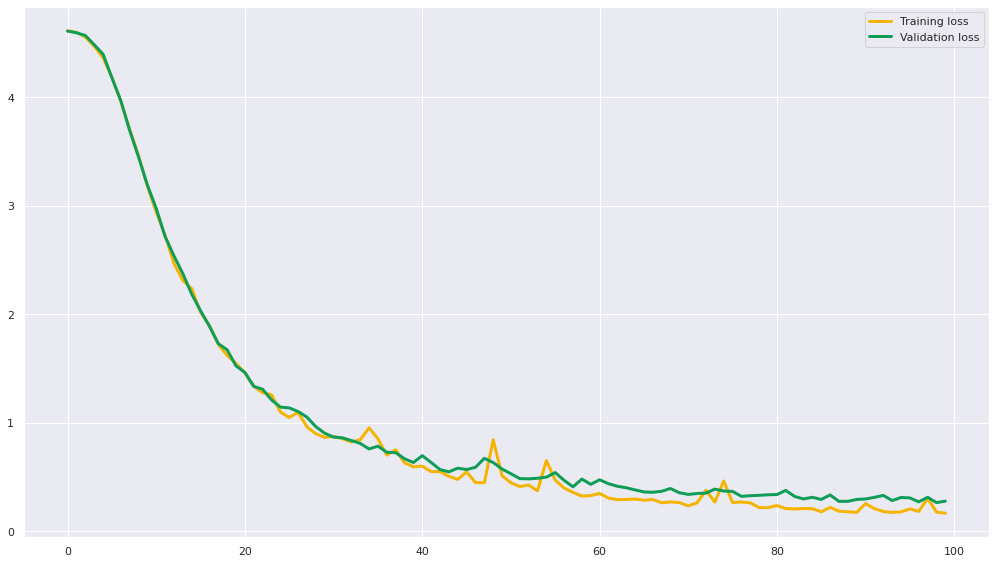

4
                                                                                                                            
The batch_size is: 16, The hidden_size is: 64, The dropout_rate is: 0.4, The optimizer_name is : Adam
Epoch 1/100
43/43 [==============================] - 1s 8ms/step - loss: 4.5899 - accuracy: 0.0267 - val_loss: 4.5786 - val_accuracy: 0.0840
Epoch 2/100
43/43 [==============================] - 0s 4ms/step - loss: 4.5570 - accuracy: 0.0758 - val_loss: 4.5550 - val_accuracy: 0.1008
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 4.5246 - accuracy: 0.1278 - val_loss: 4.5242 - val_accuracy: 0.1345
Epoch 4/100
43/43 [==============================] - 0s 4ms/step - loss: 4.4794 - accuracy: 0.1991 - val_loss: 4.4852 - val_accuracy: 0.1597
Epoch 5/100
43/43 [==============================] - 0s 3ms/step - loss: 4.4249 - accuracy: 0.2155 - val_loss: 4.4308 - val_accuracy: 0.1849
Epoch 6/100
43/43 [==============================] - 0s 4ms/step -

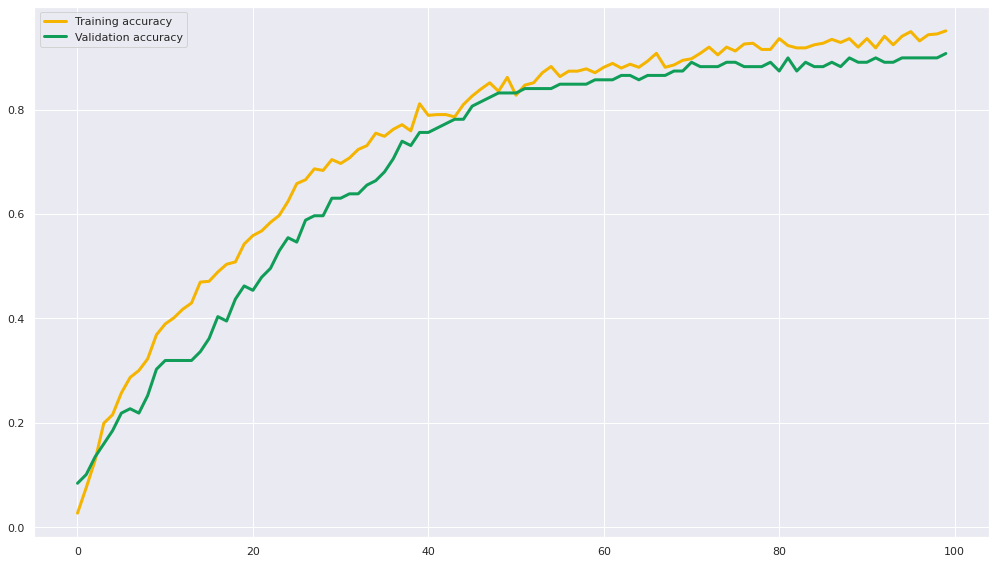

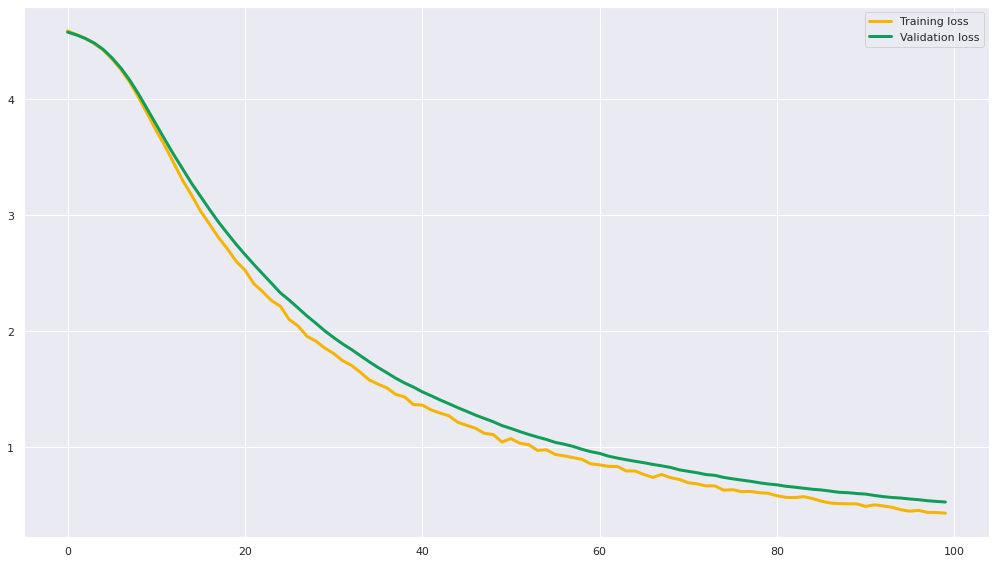

5
                                                                                                                            
The batch_size is: 16, The hidden_size is: 64, The dropout_rate is: 0.4, The optimizer_name is : RMSprop
Epoch 1/100
43/43 [==============================] - 1s 10ms/step - loss: 4.4955 - accuracy: 0.0713 - val_loss: 4.2812 - val_accuracy: 0.1681
Epoch 2/100
43/43 [==============================] - 0s 3ms/step - loss: 3.8874 - accuracy: 0.2214 - val_loss: 3.6502 - val_accuracy: 0.2437
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 3.2183 - accuracy: 0.3373 - val_loss: 3.1215 - val_accuracy: 0.3529
Epoch 4/100
43/43 [==============================] - 0s 3ms/step - loss: 2.7206 - accuracy: 0.4160 - val_loss: 2.6638 - val_accuracy: 0.4118
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 2.2945 - accuracy: 0.4844 - val_loss: 2.3214 - val_accuracy: 0.5042
Epoch 6/100
43/43 [==============================] - 0s 4ms/st

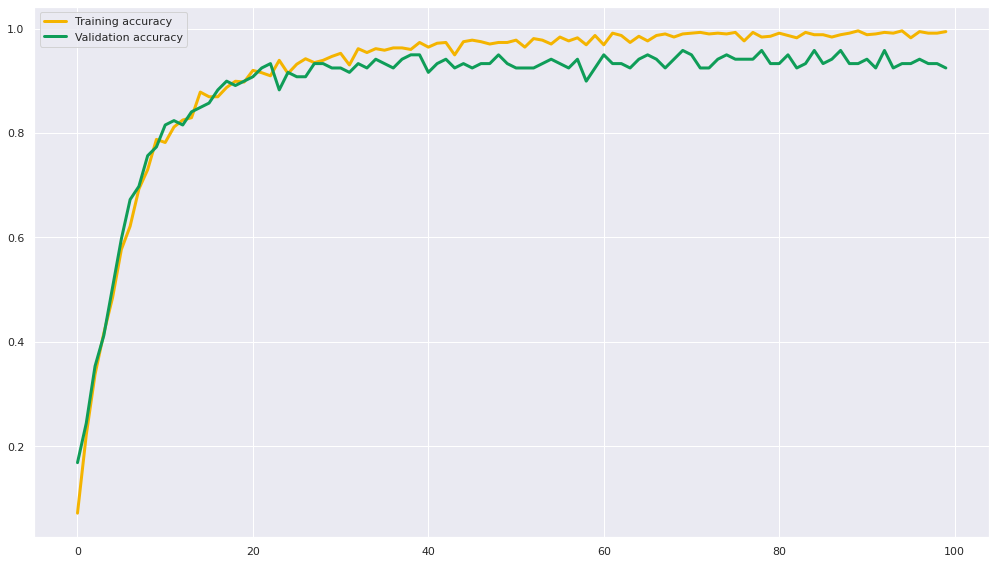

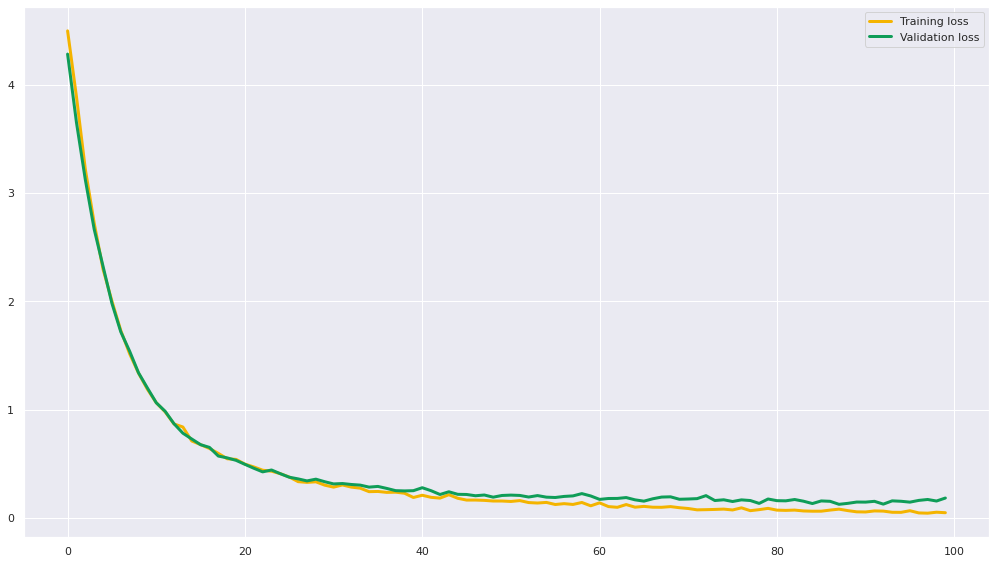

6
                                                                                                                            
The batch_size is: 16, The hidden_size is: 64, The dropout_rate is: 0.6, The optimizer_name is : SGD
Epoch 1/100
43/43 [==============================] - 1s 13ms/step - loss: 4.6180 - accuracy: 0.0163 - val_loss: 4.6265 - val_accuracy: 0.0084
Epoch 2/100
43/43 [==============================] - 0s 6ms/step - loss: 4.6143 - accuracy: 0.0104 - val_loss: 4.6073 - val_accuracy: 0.0336
Epoch 3/100
43/43 [==============================] - 0s 6ms/step - loss: 4.5769 - accuracy: 0.0253 - val_loss: 4.5746 - val_accuracy: 0.0168
Epoch 4/100
43/43 [==============================] - 0s 6ms/step - loss: 4.5213 - accuracy: 0.0416 - val_loss: 4.5586 - val_accuracy: 0.0252
Epoch 5/100
43/43 [==============================] - 0s 6ms/step - loss: 4.4194 - accuracy: 0.0327 - val_loss: 4.4032 - val_accuracy: 0.0672
Epoch 6/100
43/43 [==============================] - 0s 5ms/step -

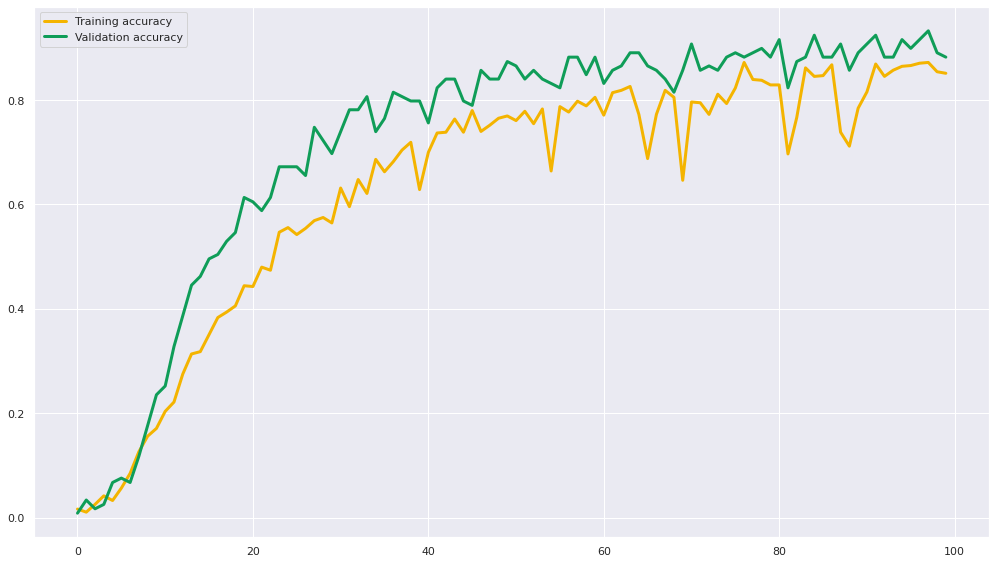

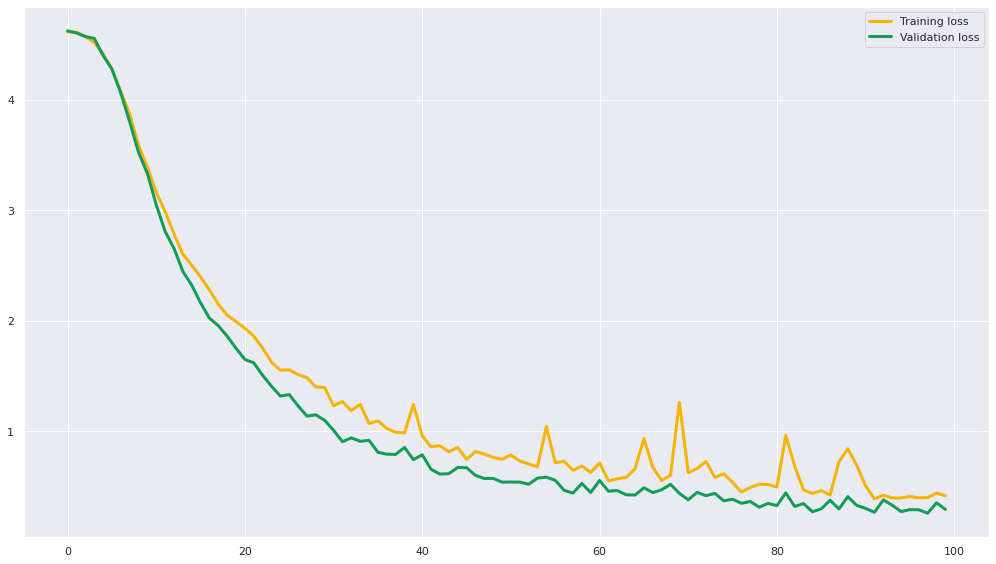

7
                                                                                                                            
The batch_size is: 16, The hidden_size is: 64, The dropout_rate is: 0.6, The optimizer_name is : Adam
Epoch 1/100
43/43 [==============================] - 1s 12ms/step - loss: 4.5922 - accuracy: 0.0149 - val_loss: 4.5847 - val_accuracy: 0.0420
Epoch 2/100
43/43 [==============================] - 0s 6ms/step - loss: 4.5664 - accuracy: 0.0342 - val_loss: 4.5653 - val_accuracy: 0.0588
Epoch 3/100
43/43 [==============================] - 0s 6ms/step - loss: 4.5390 - accuracy: 0.0684 - val_loss: 4.5420 - val_accuracy: 0.0840
Epoch 4/100
43/43 [==============================] - 0s 7ms/step - loss: 4.5057 - accuracy: 0.1070 - val_loss: 4.5190 - val_accuracy: 0.0924
Epoch 5/100
43/43 [==============================] - 0s 7ms/step - loss: 4.4612 - accuracy: 0.1486 - val_loss: 4.4845 - val_accuracy: 0.1008
Epoch 6/100
43/43 [==============================] - 0s 5ms/step 

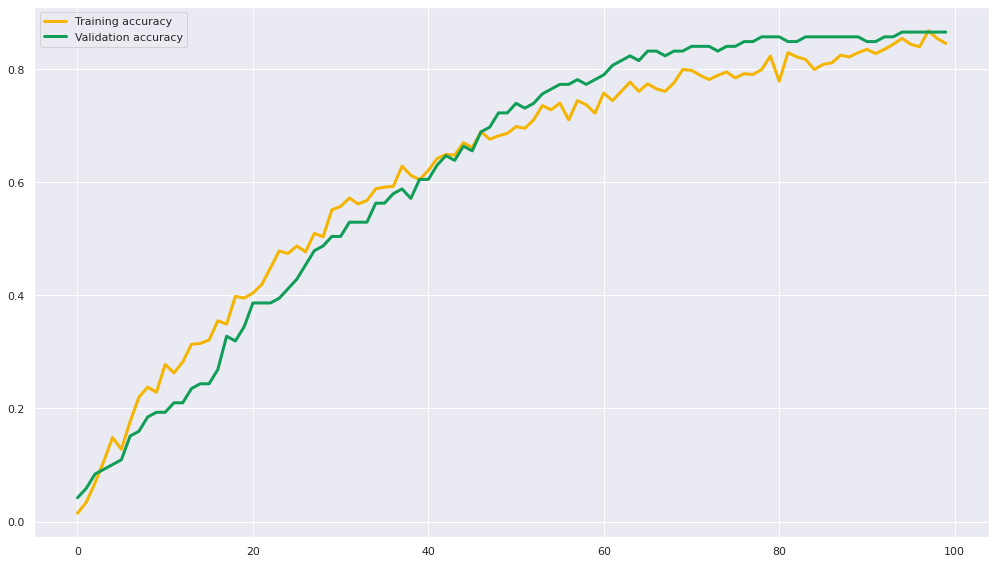

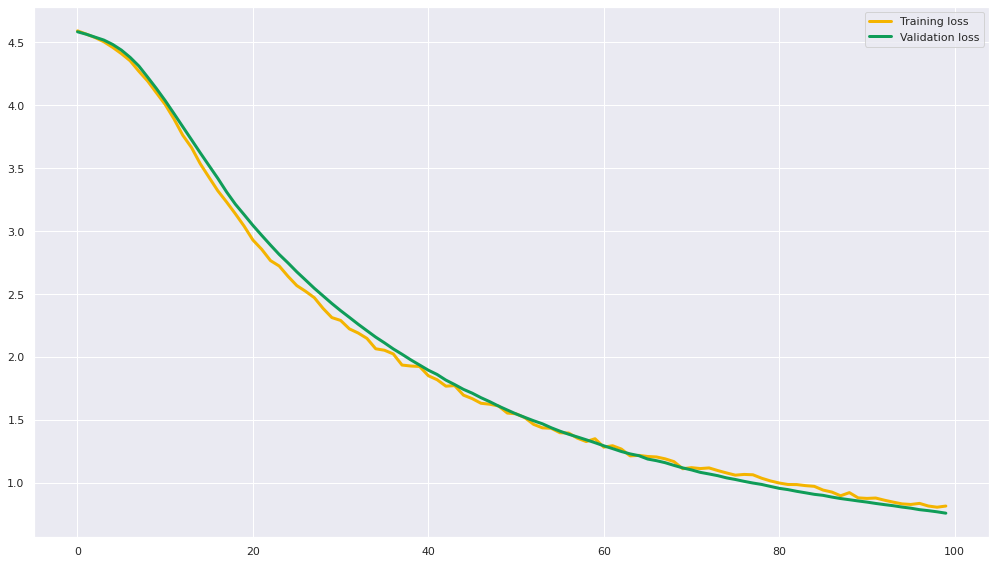

8
                                                                                                                            
The batch_size is: 16, The hidden_size is: 64, The dropout_rate is: 0.6, The optimizer_name is : RMSprop
Epoch 1/100
43/43 [==============================] - 1s 11ms/step - loss: 4.5412 - accuracy: 0.0386 - val_loss: 4.3936 - val_accuracy: 0.1597
Epoch 2/100
43/43 [==============================] - 0s 6ms/step - loss: 4.1413 - accuracy: 0.1352 - val_loss: 3.9651 - val_accuracy: 0.1513
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 3.6507 - accuracy: 0.2051 - val_loss: 3.5676 - val_accuracy: 0.2605
Epoch 4/100
43/43 [==============================] - 0s 4ms/step - loss: 3.2762 - accuracy: 0.2927 - val_loss: 3.1743 - val_accuracy: 0.3445
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 2.9498 - accuracy: 0.3536 - val_loss: 2.9138 - val_accuracy: 0.4118
Epoch 6/100
43/43 [==============================] - 0s 4ms/st

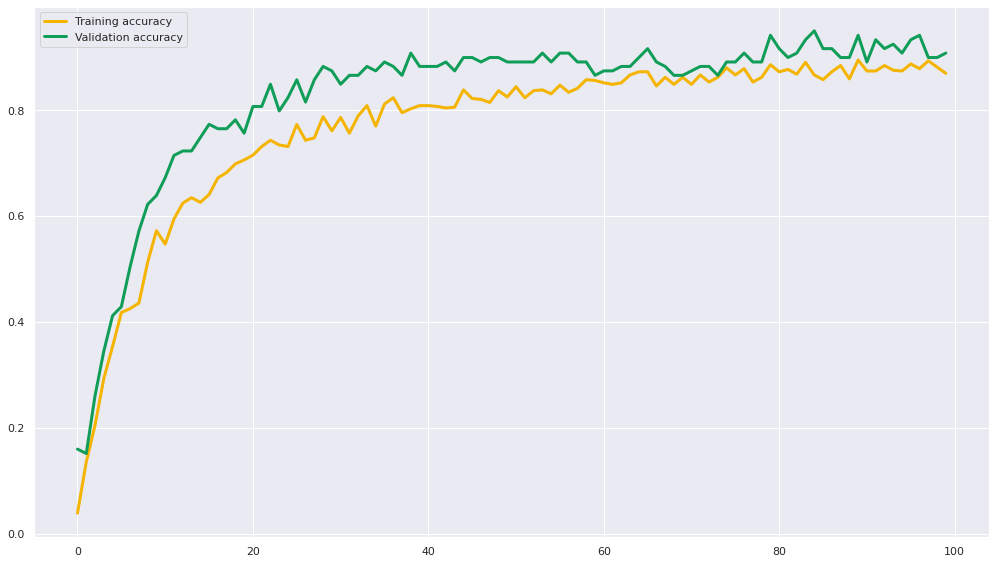

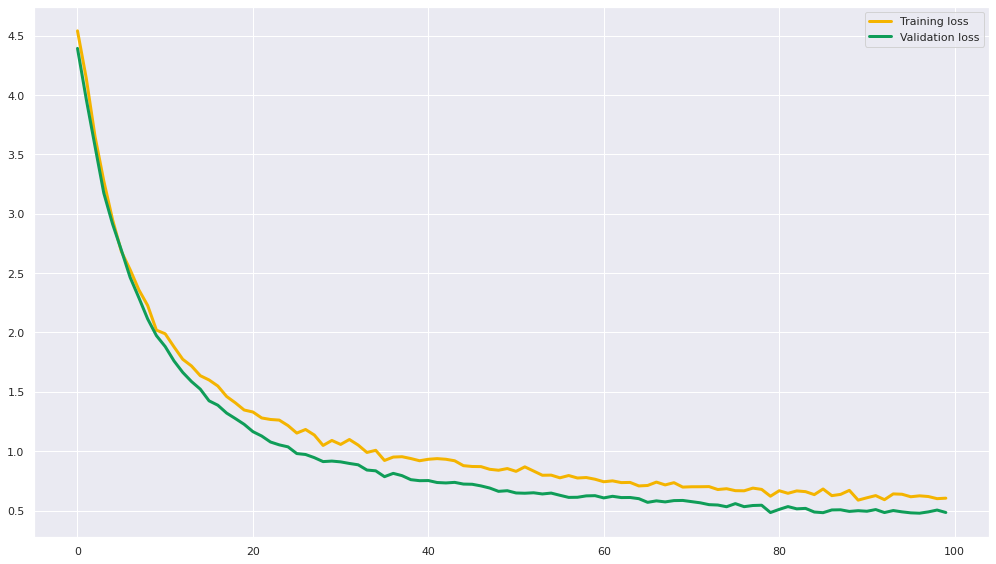

9
                                                                                                                            
The batch_size is: 16, The hidden_size is: 128, The dropout_rate is: 0.2, The optimizer_name is : SGD
Epoch 1/100
43/43 [==============================] - 1s 23ms/step - loss: 4.6214 - accuracy: 0.0104 - val_loss: 4.6112 - val_accuracy: 0.0000e+00
Epoch 2/100
43/43 [==============================] - 0s 6ms/step - loss: 4.5788 - accuracy: 0.0238 - val_loss: 4.5662 - val_accuracy: 0.0000e+00
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 4.5023 - accuracy: 0.0238 - val_loss: 4.5212 - val_accuracy: 0.0588
Epoch 4/100
43/43 [==============================] - 0s 4ms/step - loss: 4.3944 - accuracy: 0.0431 - val_loss: 4.3878 - val_accuracy: 0.1008
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 4.2092 - accuracy: 0.1025 - val_loss: 4.1808 - val_accuracy: 0.1513
Epoch 6/100
43/43 [==============================] - 0s 4

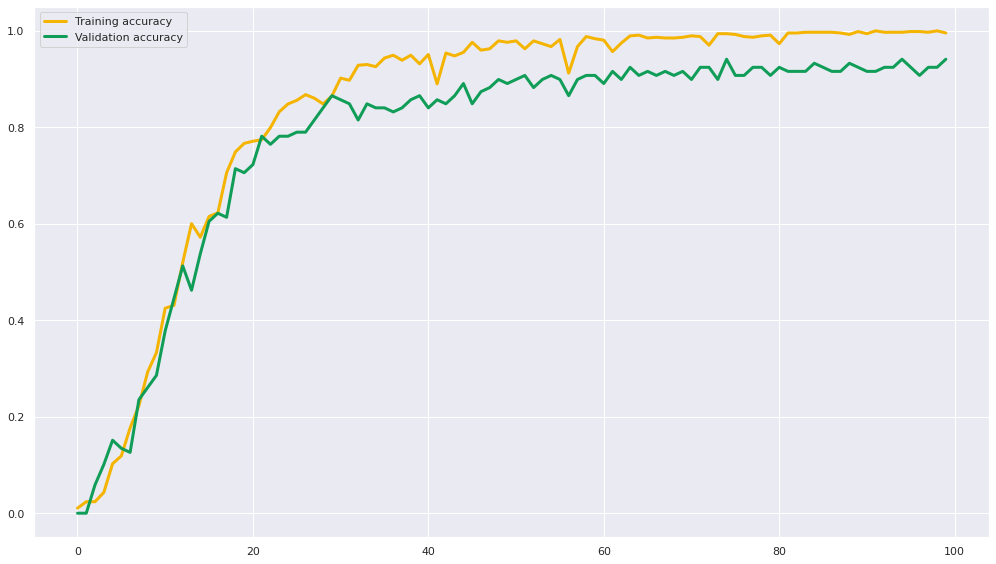

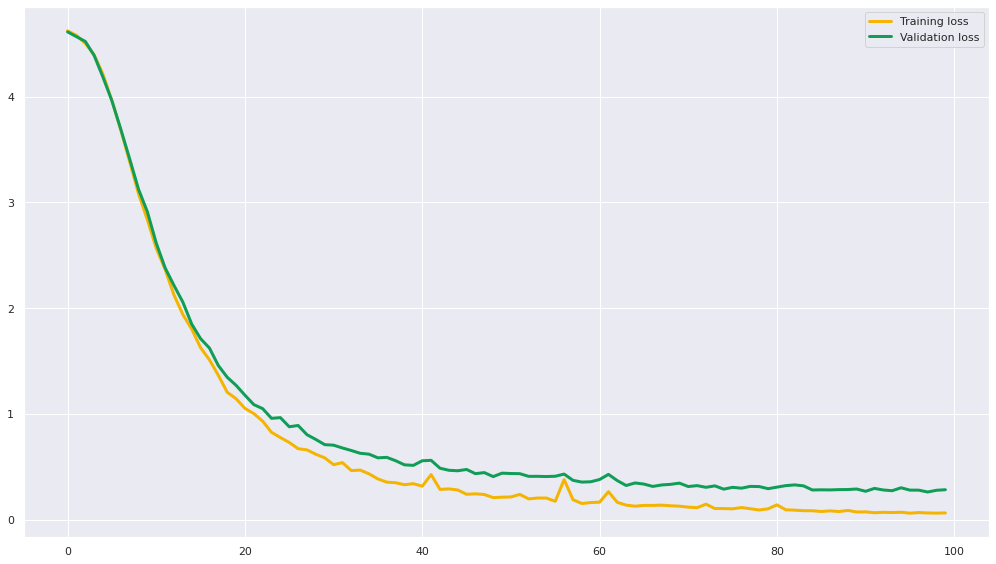

10
                                                                                                                            
The batch_size is: 16, The hidden_size is: 128, The dropout_rate is: 0.2, The optimizer_name is : Adam
Epoch 1/100
43/43 [==============================] - 1s 10ms/step - loss: 4.5812 - accuracy: 0.0297 - val_loss: 4.5596 - val_accuracy: 0.1176
Epoch 2/100
43/43 [==============================] - 0s 4ms/step - loss: 4.5164 - accuracy: 0.1828 - val_loss: 4.5078 - val_accuracy: 0.1597
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 4.4384 - accuracy: 0.2333 - val_loss: 4.4308 - val_accuracy: 0.1765
Epoch 4/100
43/43 [==============================] - 0s 6ms/step - loss: 4.3258 - accuracy: 0.3016 - val_loss: 4.3227 - val_accuracy: 0.2269
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 4.1734 - accuracy: 0.3195 - val_loss: 4.1712 - val_accuracy: 0.2437
Epoch 6/100
43/43 [==============================] - 0s 4ms/ste

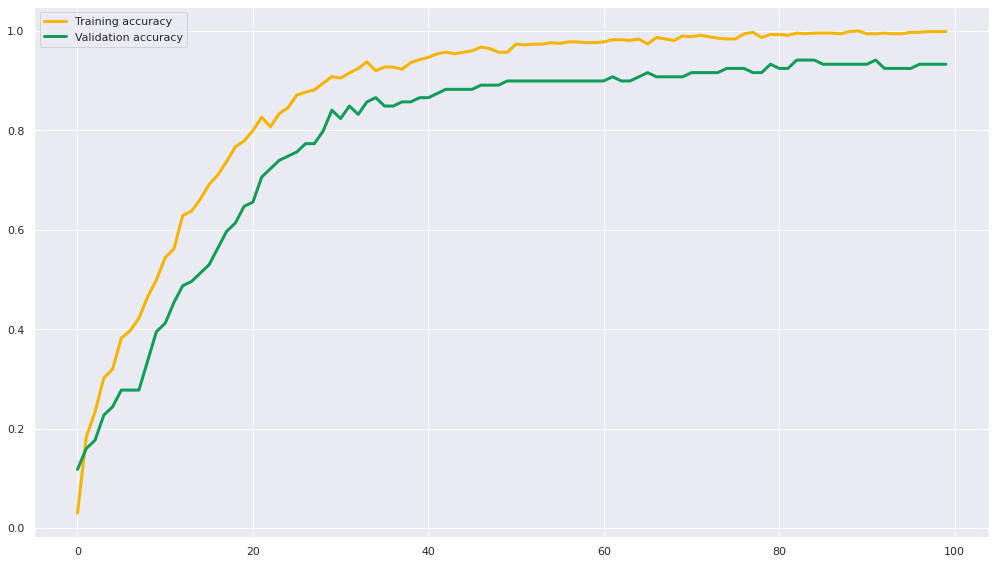

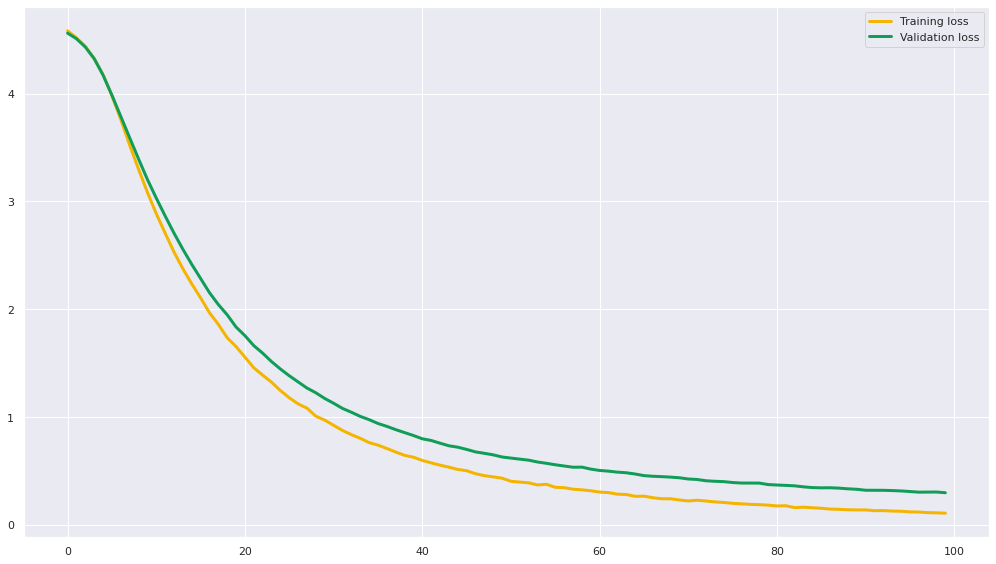

11
                                                                                                                            
The batch_size is: 16, The hidden_size is: 128, The dropout_rate is: 0.2, The optimizer_name is : RMSprop
Epoch 1/100
43/43 [==============================] - 1s 16ms/step - loss: 4.3310 - accuracy: 0.1129 - val_loss: 3.8394 - val_accuracy: 0.1513
Epoch 2/100
43/43 [==============================] - 0s 8ms/step - loss: 3.2245 - accuracy: 0.2972 - val_loss: 2.7975 - val_accuracy: 0.4622
Epoch 3/100
43/43 [==============================] - 0s 6ms/step - loss: 2.2957 - accuracy: 0.5305 - val_loss: 2.0693 - val_accuracy: 0.4958
Epoch 4/100
43/43 [==============================] - 0s 6ms/step - loss: 1.6426 - accuracy: 0.6374 - val_loss: 1.6495 - val_accuracy: 0.5714
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 1.1902 - accuracy: 0.7652 - val_loss: 1.1714 - val_accuracy: 0.7647
Epoch 6/100
43/43 [==============================] - 0s 4ms/

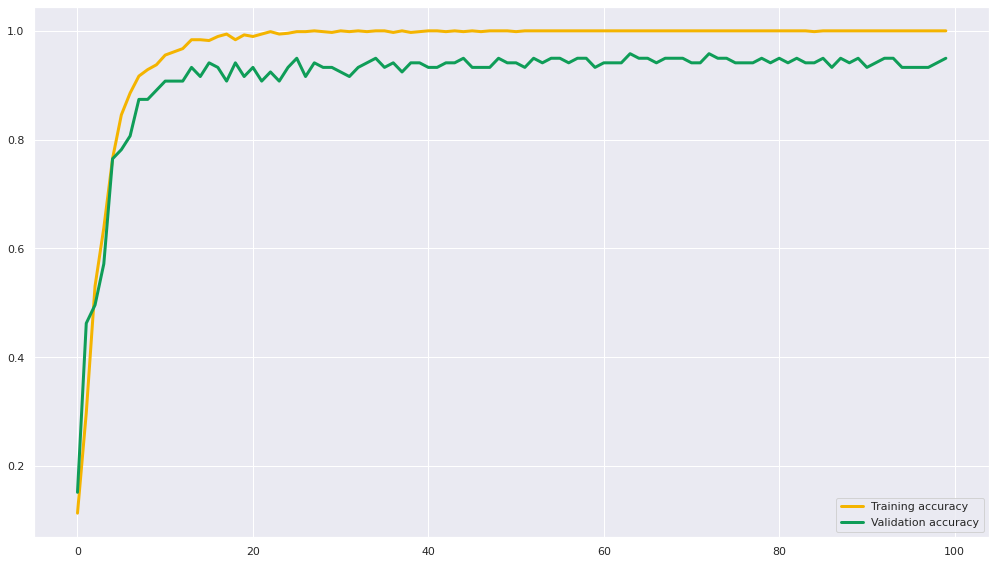

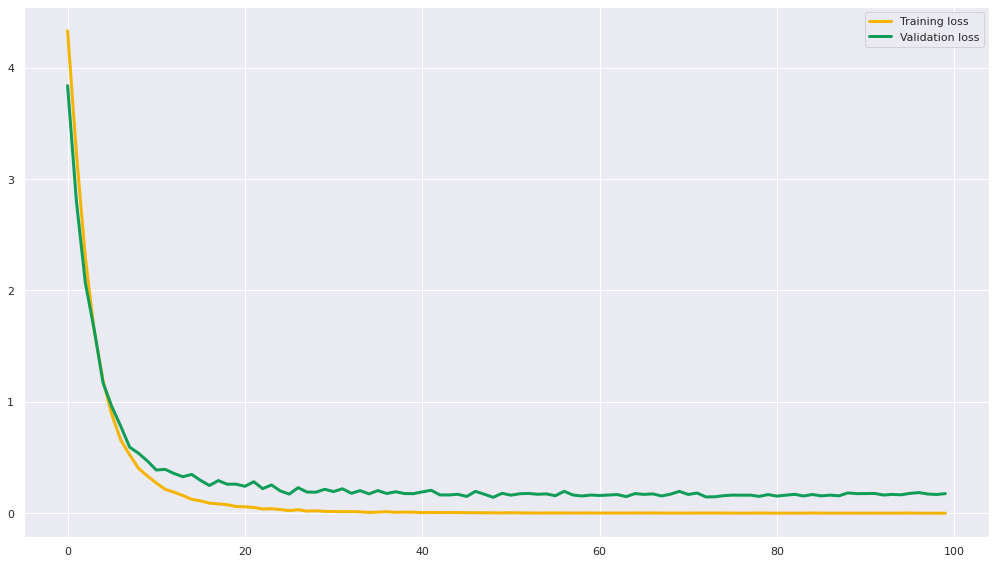

12
                                                                                                                            
The batch_size is: 16, The hidden_size is: 128, The dropout_rate is: 0.4, The optimizer_name is : SGD
Epoch 1/100
43/43 [==============================] - 1s 16ms/step - loss: 4.6226 - accuracy: 0.0134 - val_loss: 4.6217 - val_accuracy: 0.0168
Epoch 2/100
43/43 [==============================] - 0s 5ms/step - loss: 4.5905 - accuracy: 0.0193 - val_loss: 4.5785 - val_accuracy: 0.0252
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 4.5154 - accuracy: 0.0312 - val_loss: 4.5186 - val_accuracy: 0.0336
Epoch 4/100
43/43 [==============================] - 0s 4ms/step - loss: 4.4152 - accuracy: 0.0505 - val_loss: 4.3977 - val_accuracy: 0.1008
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 4.2482 - accuracy: 0.0624 - val_loss: 4.2330 - val_accuracy: 0.0924
Epoch 6/100
43/43 [==============================] - 0s 7ms/step

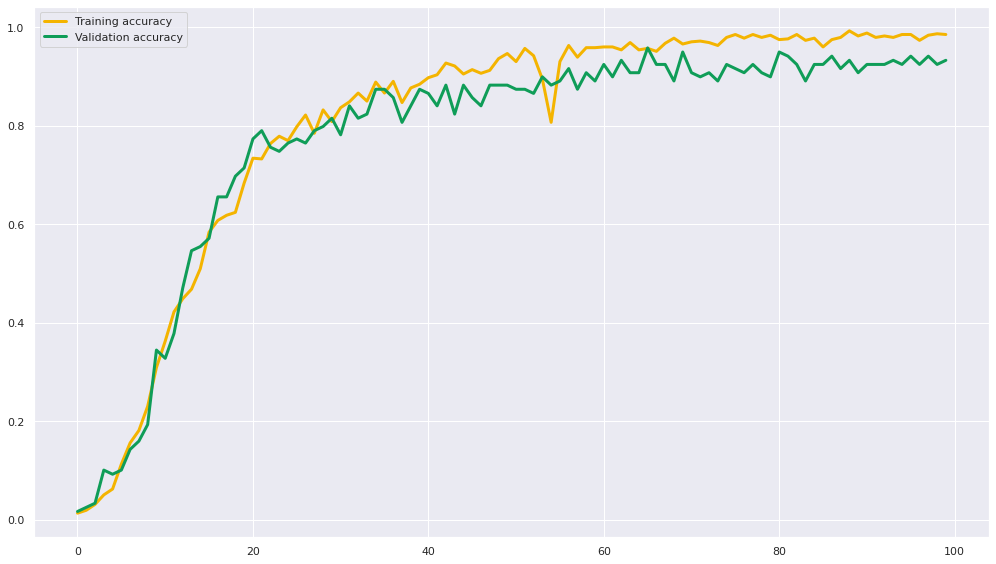

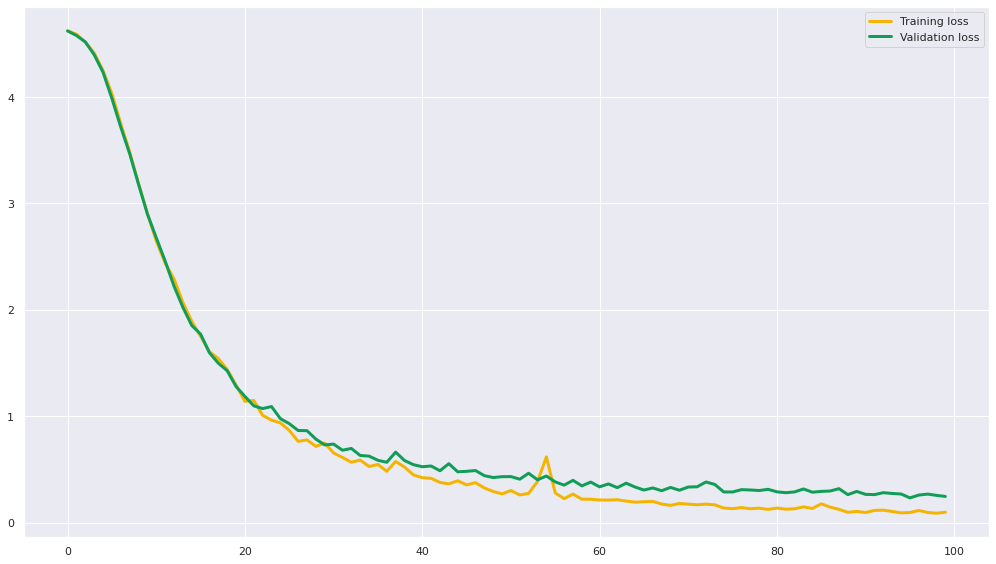

13
                                                                                                                            
The batch_size is: 16, The hidden_size is: 128, The dropout_rate is: 0.4, The optimizer_name is : Adam
Epoch 1/100
43/43 [==============================] - 1s 9ms/step - loss: 4.5792 - accuracy: 0.0253 - val_loss: 4.5600 - val_accuracy: 0.1092
Epoch 2/100
43/43 [==============================] - 0s 4ms/step - loss: 4.5259 - accuracy: 0.1263 - val_loss: 4.5185 - val_accuracy: 0.1681
Epoch 3/100
43/43 [==============================] - 0s 6ms/step - loss: 4.4589 - accuracy: 0.2229 - val_loss: 4.4633 - val_accuracy: 0.2353
Epoch 4/100
43/43 [==============================] - 0s 7ms/step - loss: 4.3729 - accuracy: 0.3031 - val_loss: 4.3836 - val_accuracy: 0.2017
Epoch 5/100
43/43 [==============================] - 0s 6ms/step - loss: 4.2634 - accuracy: 0.2853 - val_loss: 4.2760 - val_accuracy: 0.2353
Epoch 6/100
43/43 [==============================] - 0s 6ms/step

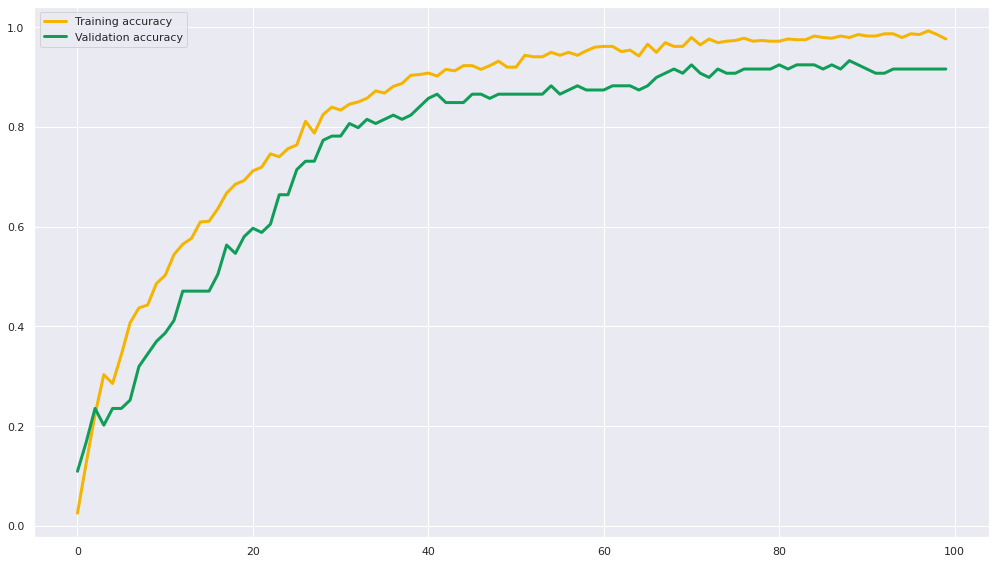

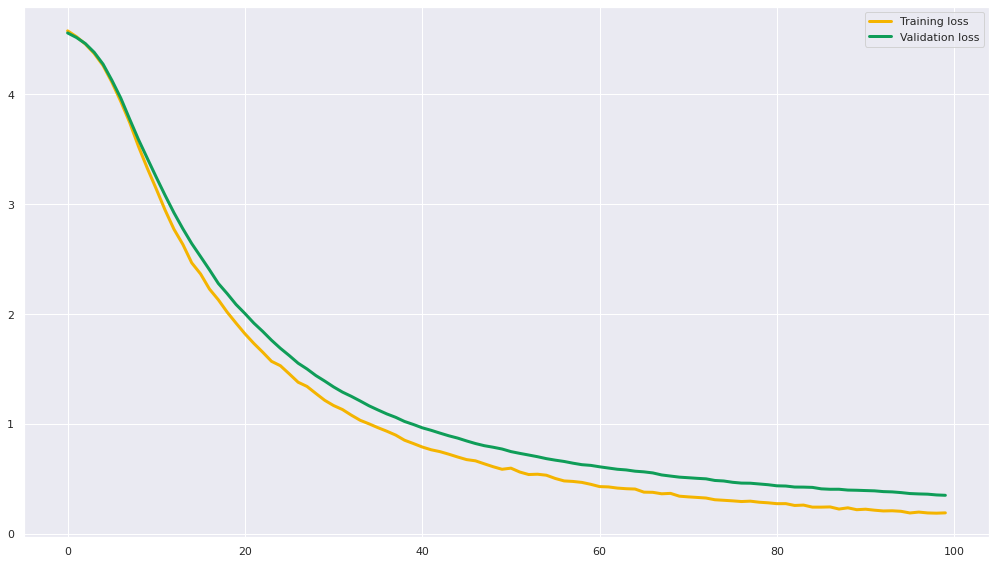

14
                                                                                                                            
The batch_size is: 16, The hidden_size is: 128, The dropout_rate is: 0.4, The optimizer_name is : RMSprop
Epoch 1/100
43/43 [==============================] - 1s 11ms/step - loss: 4.4083 - accuracy: 0.0728 - val_loss: 4.0618 - val_accuracy: 0.1765
Epoch 2/100
43/43 [==============================] - 0s 6ms/step - loss: 3.5182 - accuracy: 0.2467 - val_loss: 3.2300 - val_accuracy: 0.3109
Epoch 3/100
43/43 [==============================] - 0s 6ms/step - loss: 2.7210 - accuracy: 0.4116 - val_loss: 2.5623 - val_accuracy: 0.4202
Epoch 4/100
43/43 [==============================] - 0s 6ms/step - loss: 2.1068 - accuracy: 0.5587 - val_loss: 1.9994 - val_accuracy: 0.5546
Epoch 5/100
43/43 [==============================] - 0s 6ms/step - loss: 1.6389 - accuracy: 0.6582 - val_loss: 1.6469 - val_accuracy: 0.6303
Epoch 6/100
43/43 [==============================] - 0s 6ms/

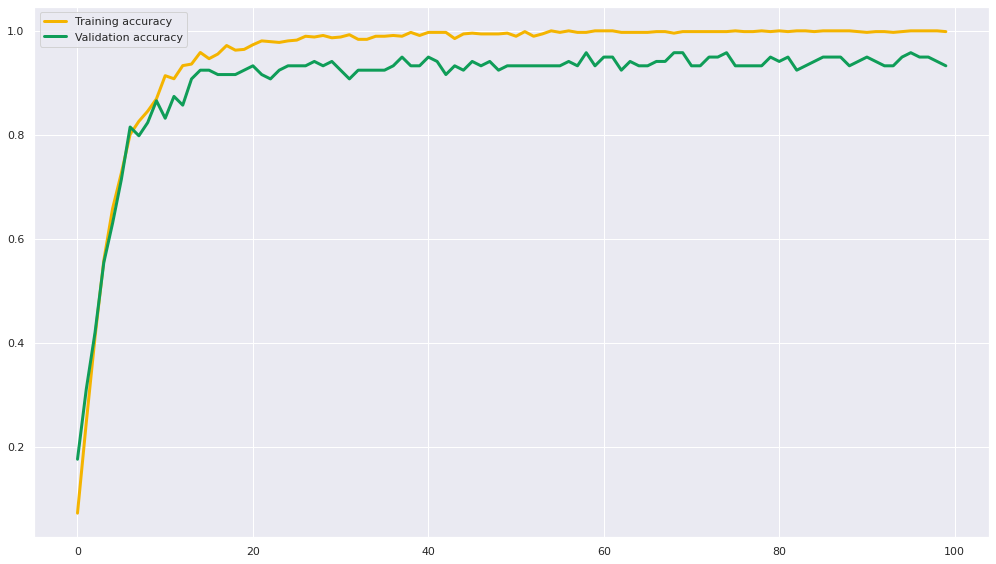

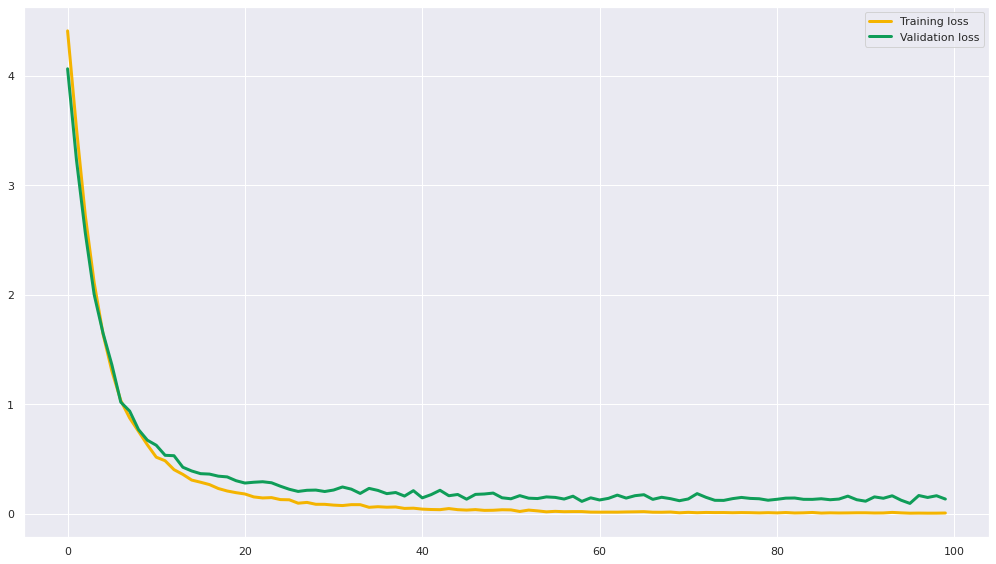

15
                                                                                                                            
The batch_size is: 16, The hidden_size is: 128, The dropout_rate is: 0.6, The optimizer_name is : SGD
Epoch 1/100
43/43 [==============================] - 1s 12ms/step - loss: 4.6219 - accuracy: 0.0059 - val_loss: 4.6202 - val_accuracy: 0.0252
Epoch 2/100
43/43 [==============================] - 0s 5ms/step - loss: 4.6269 - accuracy: 0.0134 - val_loss: 4.5939 - val_accuracy: 0.0252
Epoch 3/100
43/43 [==============================] - 0s 7ms/step - loss: 4.5763 - accuracy: 0.0163 - val_loss: 4.5390 - val_accuracy: 0.0420
Epoch 4/100
43/43 [==============================] - 0s 8ms/step - loss: 4.4824 - accuracy: 0.0282 - val_loss: 4.4355 - val_accuracy: 0.0504
Epoch 5/100
43/43 [==============================] - 0s 8ms/step - loss: 4.3146 - accuracy: 0.0579 - val_loss: 4.2584 - val_accuracy: 0.0756
Epoch 6/100
43/43 [==============================] - 0s 8ms/step

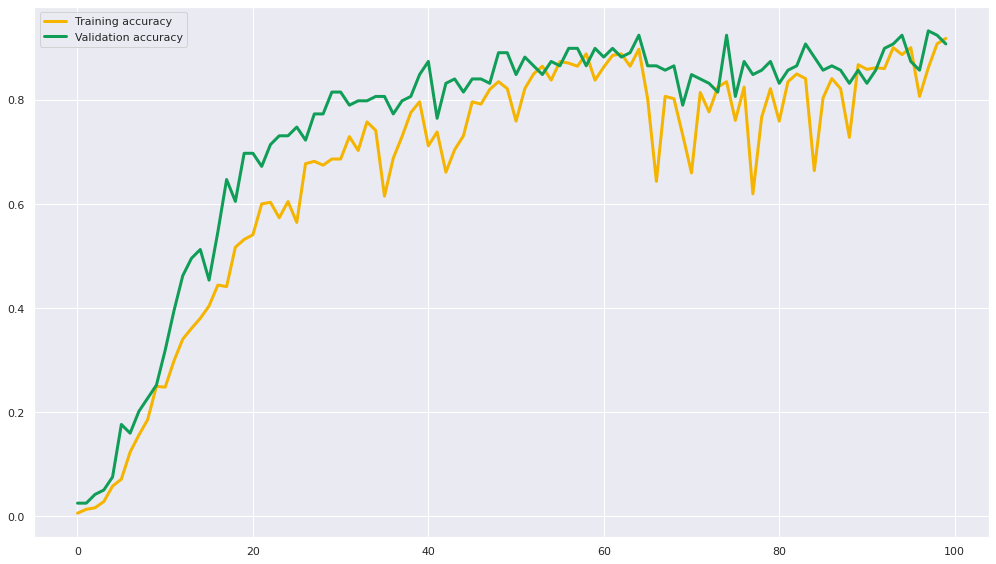

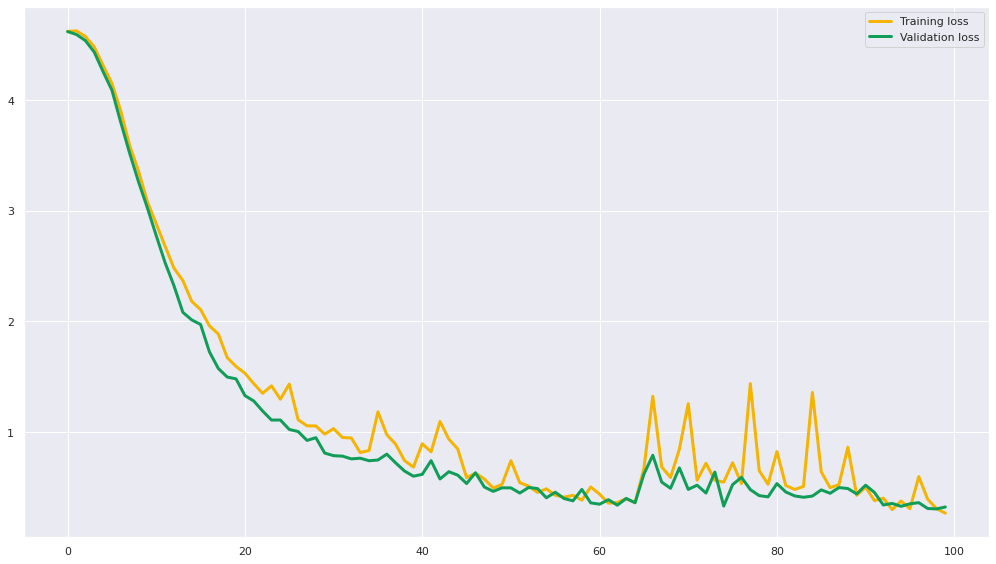

16
                                                                                                                            
The batch_size is: 16, The hidden_size is: 128, The dropout_rate is: 0.6, The optimizer_name is : Adam
Epoch 1/100
43/43 [==============================] - 1s 12ms/step - loss: 4.5908 - accuracy: 0.0163 - val_loss: 4.5723 - val_accuracy: 0.0336
Epoch 2/100
43/43 [==============================] - 0s 5ms/step - loss: 4.5452 - accuracy: 0.0728 - val_loss: 4.5399 - val_accuracy: 0.1176
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 4.4989 - accuracy: 0.1248 - val_loss: 4.4981 - val_accuracy: 0.2353
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 4.4423 - accuracy: 0.2080 - val_loss: 4.4460 - val_accuracy: 0.2437
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 4.3654 - accuracy: 0.2214 - val_loss: 4.3778 - val_accuracy: 0.2185
Epoch 6/100
43/43 [==============================] - 0s 5ms/ste

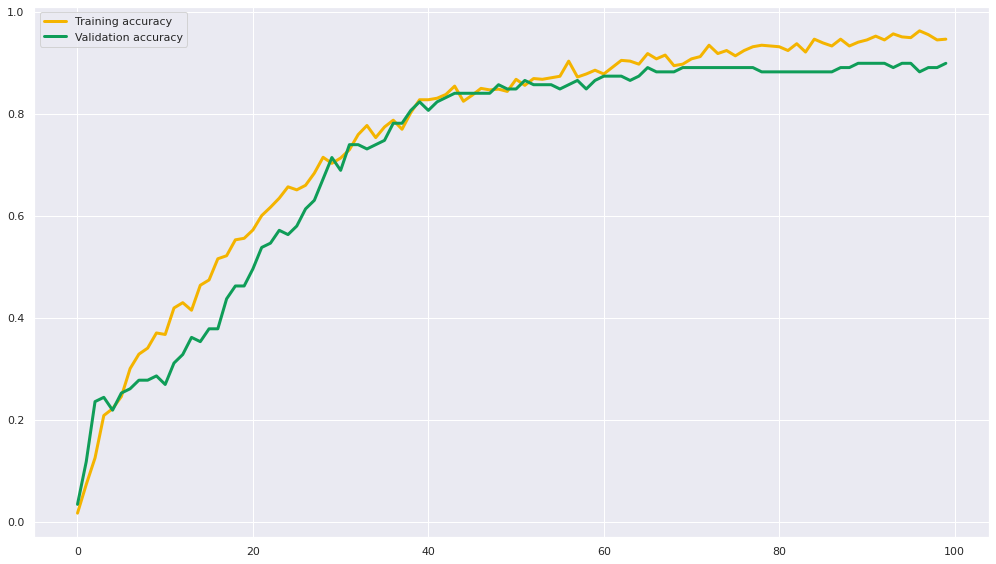

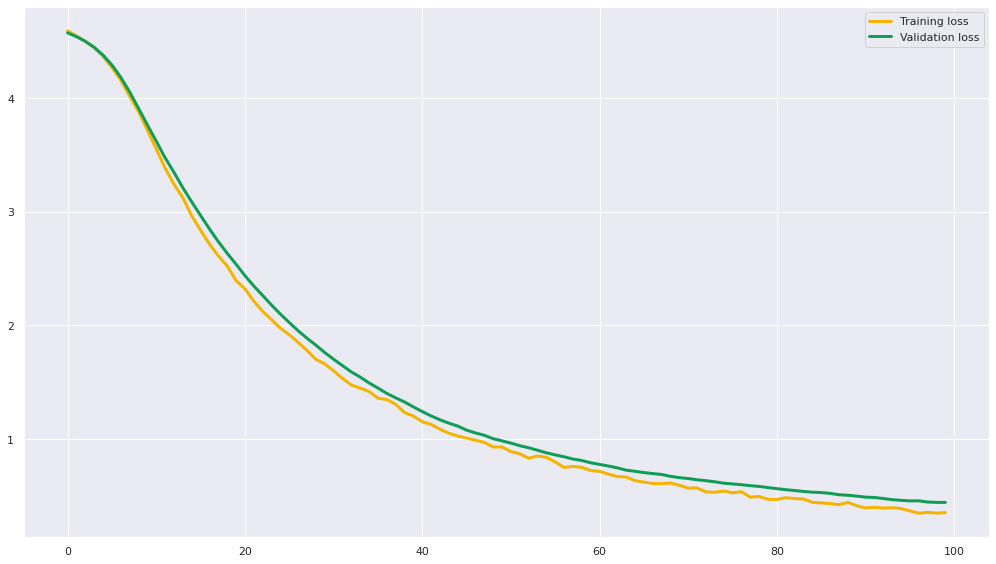

17
                                                                                                                            
The batch_size is: 16, The hidden_size is: 128, The dropout_rate is: 0.6, The optimizer_name is : RMSprop
Epoch 1/100
43/43 [==============================] - 1s 9ms/step - loss: 4.4864 - accuracy: 0.0535 - val_loss: 4.2229 - val_accuracy: 0.0924
Epoch 2/100
43/43 [==============================] - 0s 5ms/step - loss: 3.8523 - accuracy: 0.1872 - val_loss: 3.6161 - val_accuracy: 0.2185
Epoch 3/100
43/43 [==============================] - 0s 7ms/step - loss: 3.2080 - accuracy: 0.2972 - val_loss: 3.0613 - val_accuracy: 0.3782
Epoch 4/100
43/43 [==============================] - 0s 7ms/step - loss: 2.7275 - accuracy: 0.3923 - val_loss: 2.5966 - val_accuracy: 0.4706
Epoch 5/100
43/43 [==============================] - 0s 8ms/step - loss: 2.3492 - accuracy: 0.5201 - val_loss: 2.2518 - val_accuracy: 0.5966
Epoch 6/100
43/43 [==============================] - 0s 6ms/s

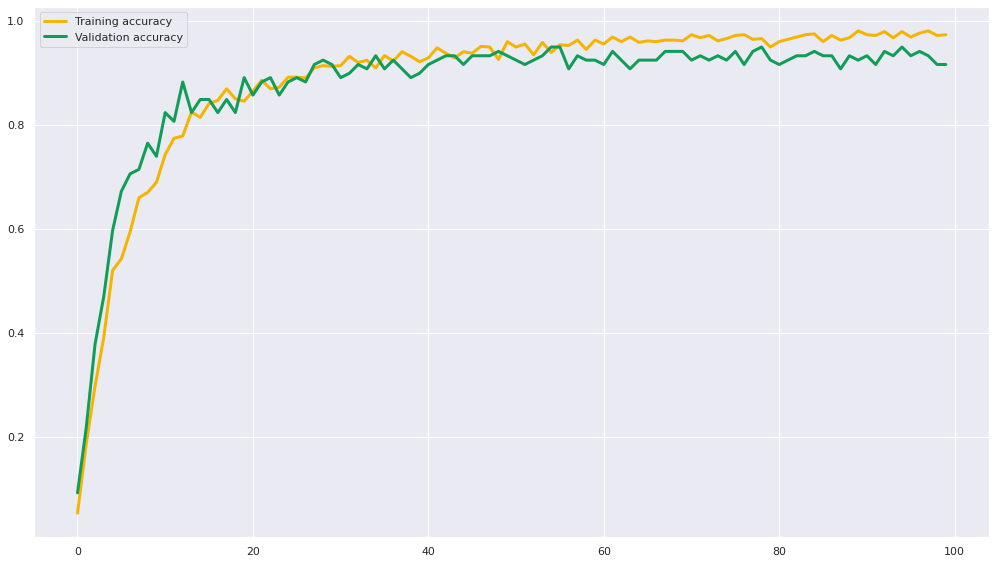

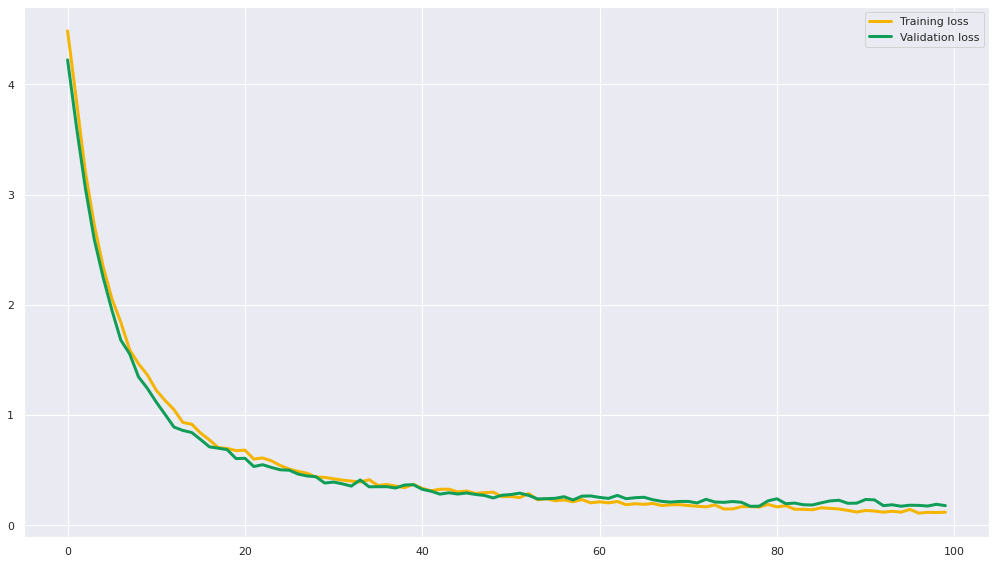

18
                                                                                                                            
The batch_size is: 16, The hidden_size is: 256, The dropout_rate is: 0.2, The optimizer_name is : SGD
Epoch 1/100
43/43 [==============================] - 1s 9ms/step - loss: 4.6231 - accuracy: 0.0119 - val_loss: 4.6093 - val_accuracy: 0.0168
Epoch 2/100
43/43 [==============================] - 0s 5ms/step - loss: 4.5521 - accuracy: 0.0208 - val_loss: 4.5602 - val_accuracy: 0.0420
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 4.4713 - accuracy: 0.0312 - val_loss: 4.4718 - val_accuracy: 0.0504
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 4.3193 - accuracy: 0.0550 - val_loss: 4.3208 - val_accuracy: 0.1261
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 4.1129 - accuracy: 0.0966 - val_loss: 4.0851 - val_accuracy: 0.1261
Epoch 6/100
43/43 [==============================] - 0s 5ms/step 

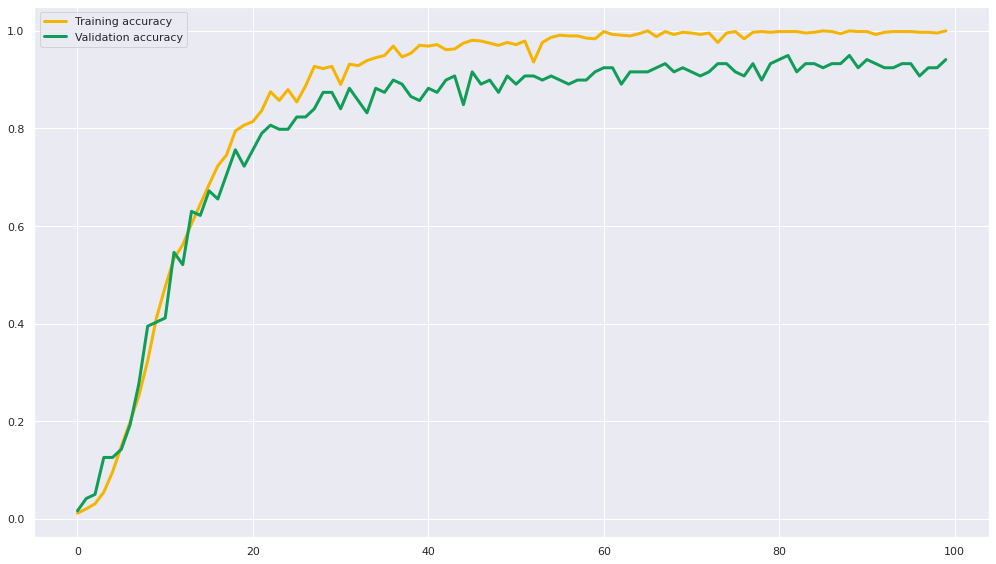

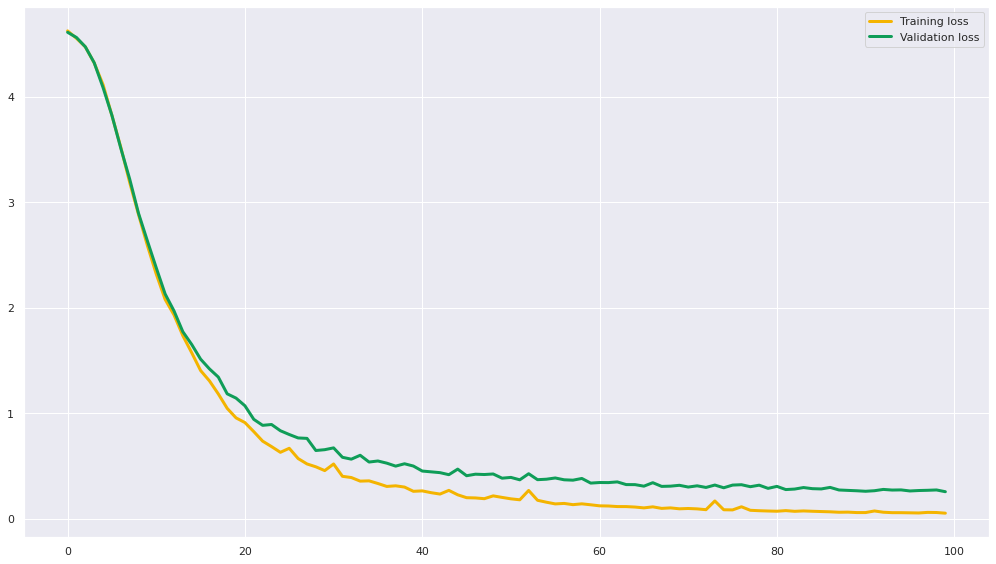

19
                                                                                                                            
The batch_size is: 16, The hidden_size is: 256, The dropout_rate is: 0.2, The optimizer_name is : Adam
Epoch 1/100
43/43 [==============================] - 1s 12ms/step - loss: 4.5701 - accuracy: 0.0698 - val_loss: 4.5321 - val_accuracy: 0.1429
Epoch 2/100
43/43 [==============================] - 0s 7ms/step - loss: 4.4630 - accuracy: 0.2719 - val_loss: 4.4404 - val_accuracy: 0.2437
Epoch 3/100
43/43 [==============================] - 0s 7ms/step - loss: 4.3228 - accuracy: 0.3522 - val_loss: 4.2966 - val_accuracy: 0.2941
Epoch 4/100
43/43 [==============================] - 0s 6ms/step - loss: 4.1111 - accuracy: 0.4368 - val_loss: 4.0777 - val_accuracy: 0.3109
Epoch 5/100
43/43 [==============================] - 0s 6ms/step - loss: 3.8296 - accuracy: 0.4175 - val_loss: 3.8114 - val_accuracy: 0.3277
Epoch 6/100
43/43 [==============================] - 0s 5ms/ste

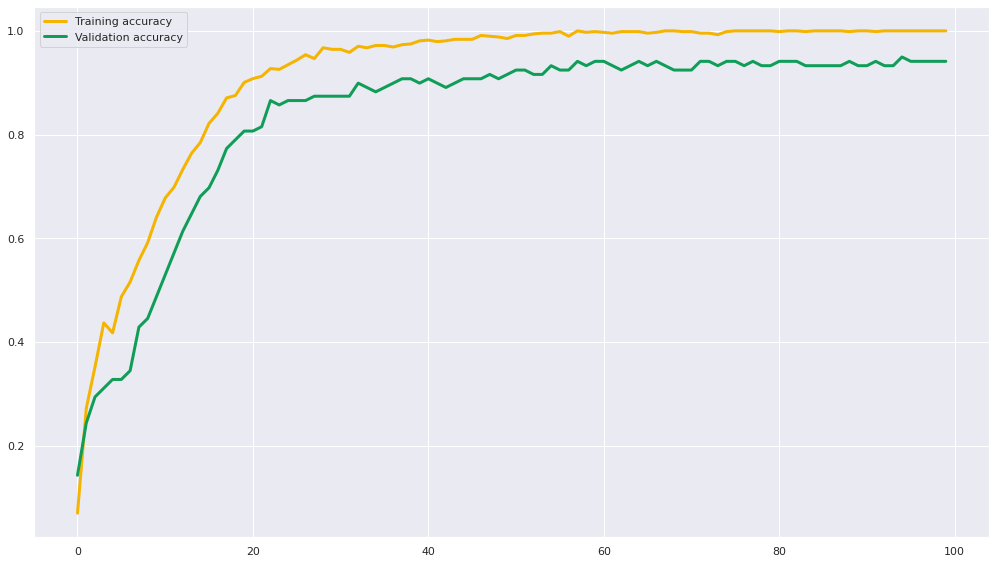

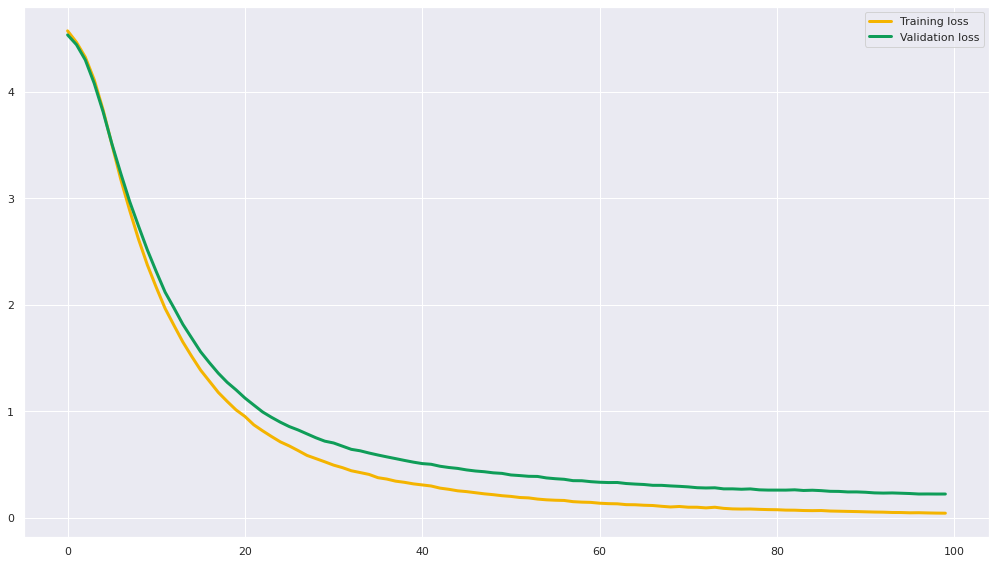

20
                                                                                                                            
The batch_size is: 16, The hidden_size is: 256, The dropout_rate is: 0.2, The optimizer_name is : RMSprop
Epoch 1/100
43/43 [==============================] - 2s 19ms/step - loss: 4.1631 - accuracy: 0.1055 - val_loss: 3.4657 - val_accuracy: 0.1597
Epoch 2/100
43/43 [==============================] - 0s 9ms/step - loss: 2.7391 - accuracy: 0.3923 - val_loss: 2.2924 - val_accuracy: 0.4538
Epoch 3/100
43/43 [==============================] - 0s 10ms/step - loss: 1.7408 - accuracy: 0.6107 - val_loss: 1.5040 - val_accuracy: 0.6303
Epoch 4/100
43/43 [==============================] - 0s 11ms/step - loss: 1.1148 - accuracy: 0.7623 - val_loss: 1.1651 - val_accuracy: 0.6807
Epoch 5/100
43/43 [==============================] - 0s 9ms/step - loss: 0.7546 - accuracy: 0.8529 - val_loss: 0.7956 - val_accuracy: 0.7983
Epoch 6/100
43/43 [==============================] - 0s 10

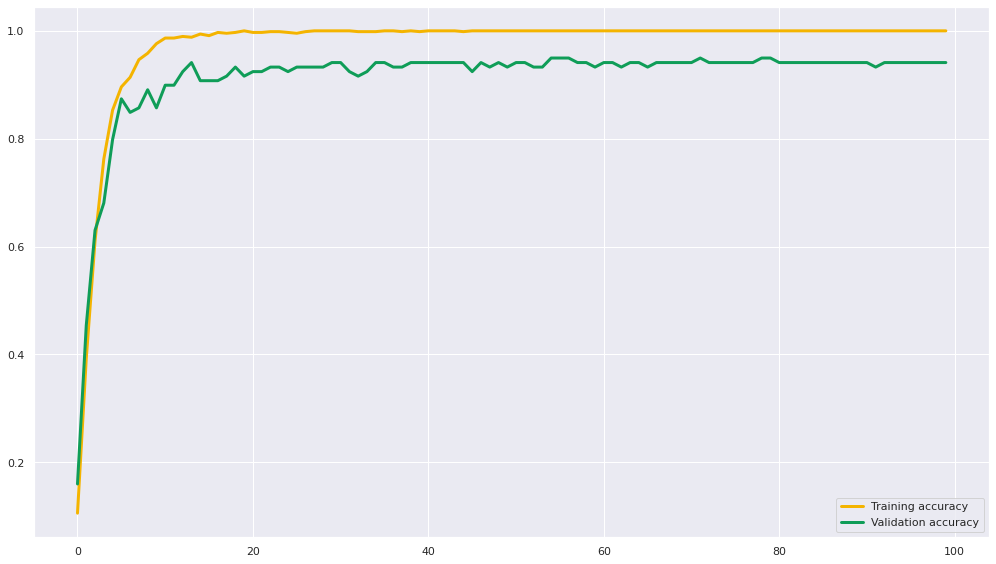

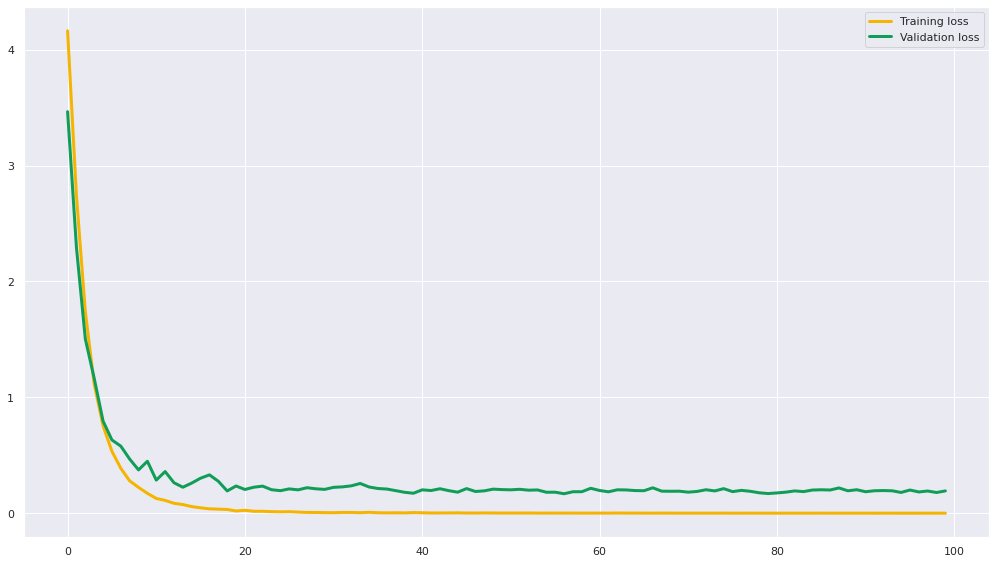

21
                                                                                                                            
The batch_size is: 16, The hidden_size is: 256, The dropout_rate is: 0.4, The optimizer_name is : SGD
Epoch 1/100
43/43 [==============================] - 1s 11ms/step - loss: 4.6167 - accuracy: 0.0119 - val_loss: 4.6446 - val_accuracy: 0.0168
Epoch 2/100
43/43 [==============================] - 0s 9ms/step - loss: 4.5774 - accuracy: 0.0193 - val_loss: 4.5324 - val_accuracy: 0.0420
Epoch 3/100
43/43 [==============================] - 0s 9ms/step - loss: 4.4958 - accuracy: 0.0312 - val_loss: 4.4653 - val_accuracy: 0.0924
Epoch 4/100
43/43 [==============================] - 0s 6ms/step - loss: 4.3405 - accuracy: 0.0758 - val_loss: 4.3344 - val_accuracy: 0.0924
Epoch 5/100
43/43 [==============================] - 0s 6ms/step - loss: 4.1095 - accuracy: 0.0877 - val_loss: 4.0763 - val_accuracy: 0.1176
Epoch 6/100
43/43 [==============================] - 0s 5ms/step

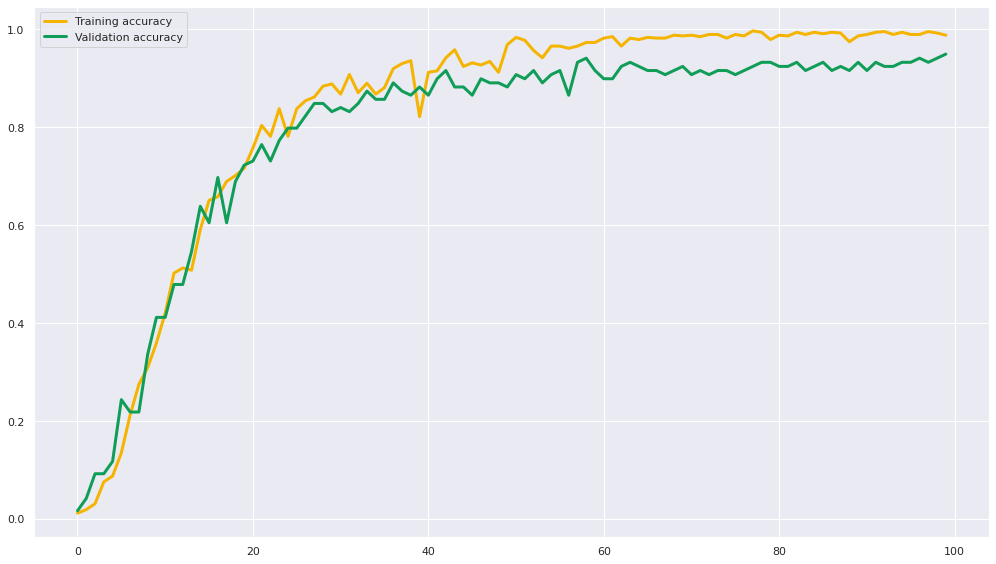

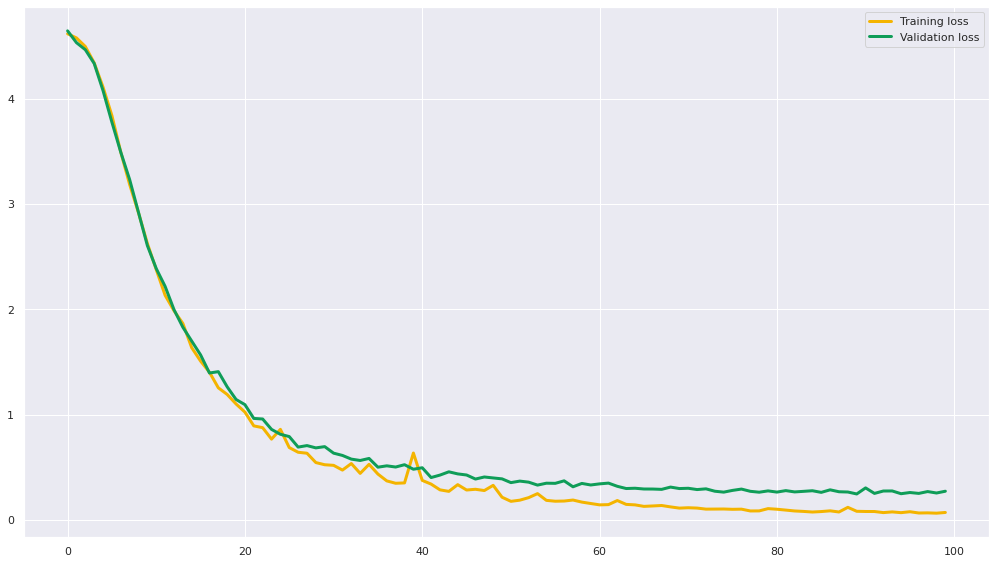

22
                                                                                                                            
The batch_size is: 16, The hidden_size is: 256, The dropout_rate is: 0.4, The optimizer_name is : Adam
Epoch 1/100
43/43 [==============================] - 1s 12ms/step - loss: 4.5728 - accuracy: 0.0490 - val_loss: 4.5398 - val_accuracy: 0.0840
Epoch 2/100
43/43 [==============================] - 0s 7ms/step - loss: 4.4781 - accuracy: 0.2140 - val_loss: 4.4601 - val_accuracy: 0.2101
Epoch 3/100
43/43 [==============================] - 0s 7ms/step - loss: 4.3623 - accuracy: 0.2883 - val_loss: 4.3439 - val_accuracy: 0.2101
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 4.1951 - accuracy: 0.3031 - val_loss: 4.1819 - val_accuracy: 0.2185
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 3.9814 - accuracy: 0.3730 - val_loss: 3.9637 - val_accuracy: 0.3025
Epoch 6/100
43/43 [==============================] - 0s 5ms/ste

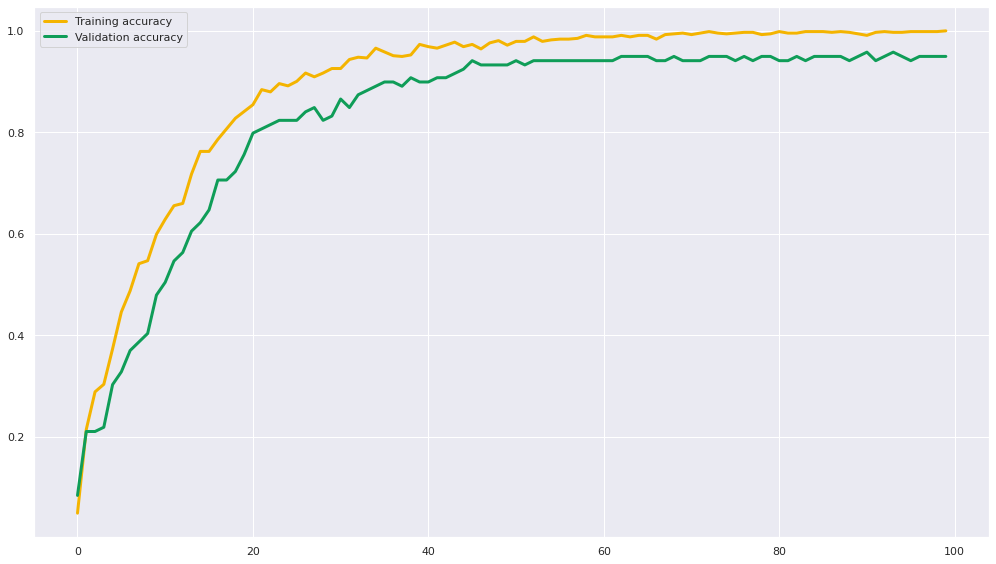

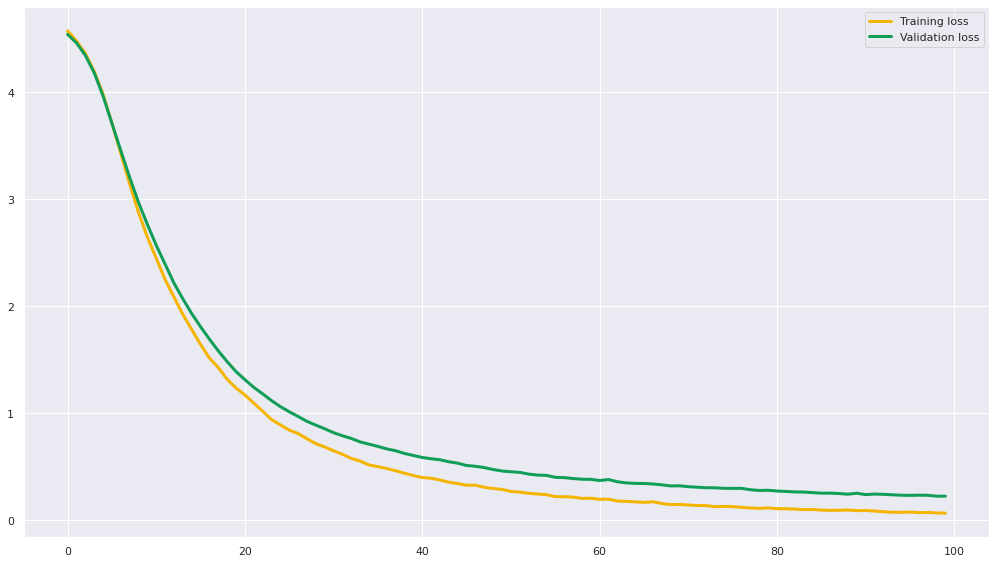

23
                                                                                                                            
The batch_size is: 16, The hidden_size is: 256, The dropout_rate is: 0.4, The optimizer_name is : RMSprop
Epoch 1/100
43/43 [==============================] - 1s 14ms/step - loss: 4.2741 - accuracy: 0.0921 - val_loss: 3.6865 - val_accuracy: 0.1681
Epoch 2/100
43/43 [==============================] - 0s 8ms/step - loss: 3.0518 - accuracy: 0.3299 - val_loss: 2.6673 - val_accuracy: 0.4034
Epoch 3/100
43/43 [==============================] - 0s 7ms/step - loss: 2.1039 - accuracy: 0.5468 - val_loss: 1.8708 - val_accuracy: 0.5798
Epoch 4/100
43/43 [==============================] - 0s 6ms/step - loss: 1.4856 - accuracy: 0.6850 - val_loss: 1.4011 - val_accuracy: 0.7059
Epoch 5/100
43/43 [==============================] - 0s 6ms/step - loss: 1.0400 - accuracy: 0.7860 - val_loss: 1.0731 - val_accuracy: 0.7143
Epoch 6/100
43/43 [==============================] - 0s 6ms/

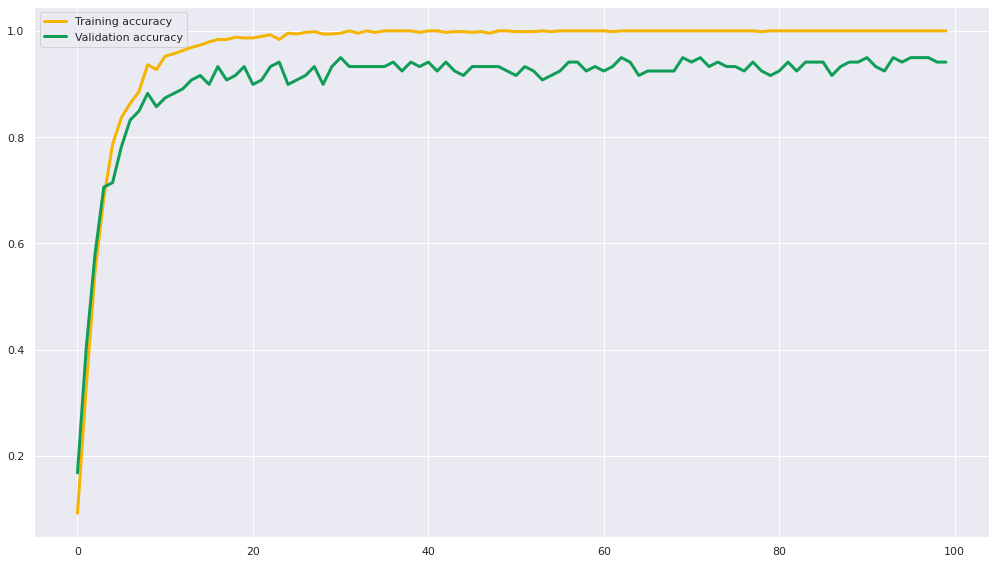

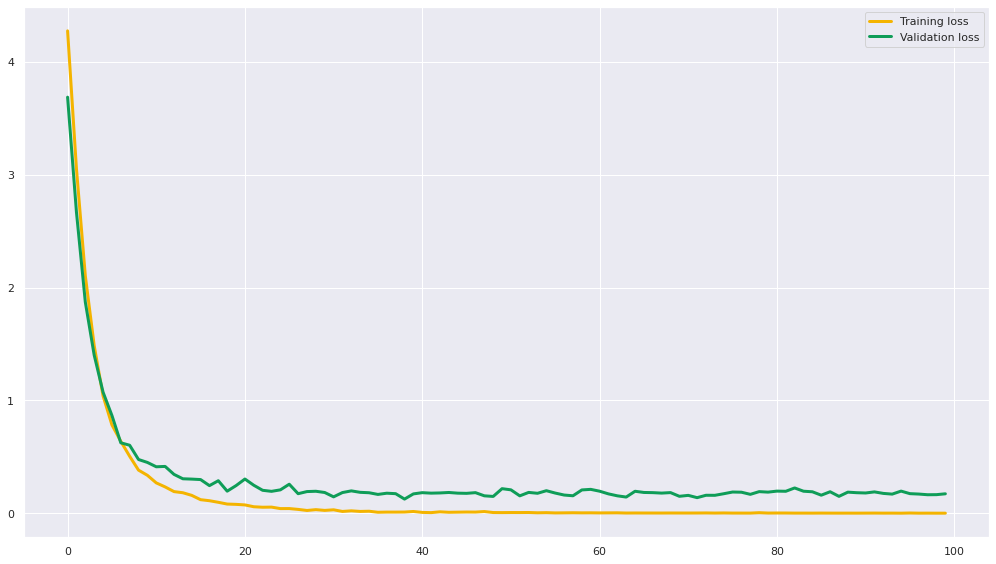

24
                                                                                                                            
The batch_size is: 16, The hidden_size is: 256, The dropout_rate is: 0.6, The optimizer_name is : SGD
Epoch 1/100
43/43 [==============================] - 1s 15ms/step - loss: 4.6387 - accuracy: 0.0074 - val_loss: 4.6496 - val_accuracy: 0.0084
Epoch 2/100
43/43 [==============================] - 0s 10ms/step - loss: 4.6057 - accuracy: 0.0149 - val_loss: 4.6037 - val_accuracy: 0.0168
Epoch 3/100
43/43 [==============================] - 0s 8ms/step - loss: 4.5265 - accuracy: 0.0312 - val_loss: 4.4850 - val_accuracy: 0.0756
Epoch 4/100
43/43 [==============================] - 0s 6ms/step - loss: 4.4310 - accuracy: 0.0431 - val_loss: 4.3446 - val_accuracy: 0.0840
Epoch 5/100
43/43 [==============================] - 0s 6ms/step - loss: 4.2348 - accuracy: 0.0713 - val_loss: 4.1180 - val_accuracy: 0.0672
Epoch 6/100
43/43 [==============================] - 0s 7ms/ste

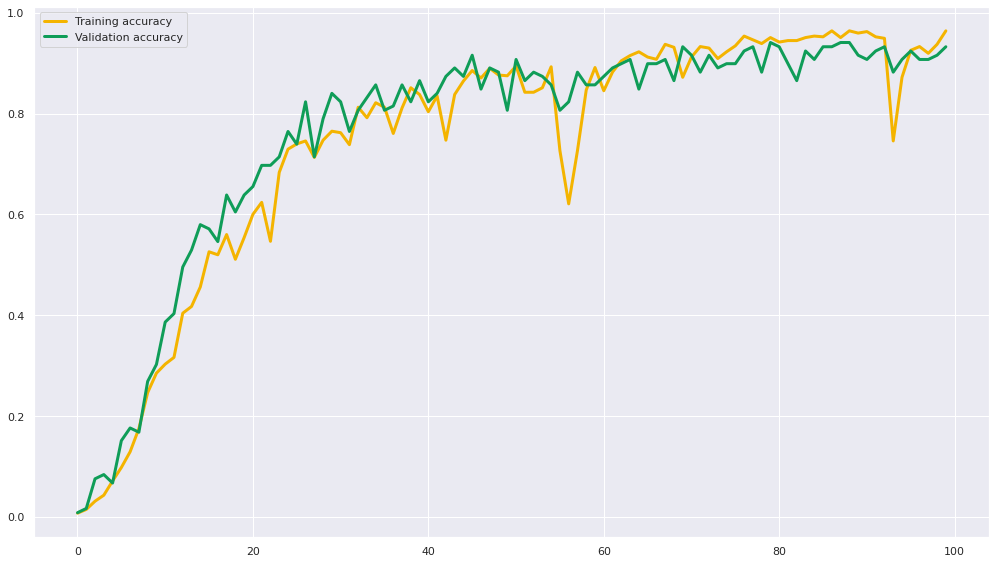

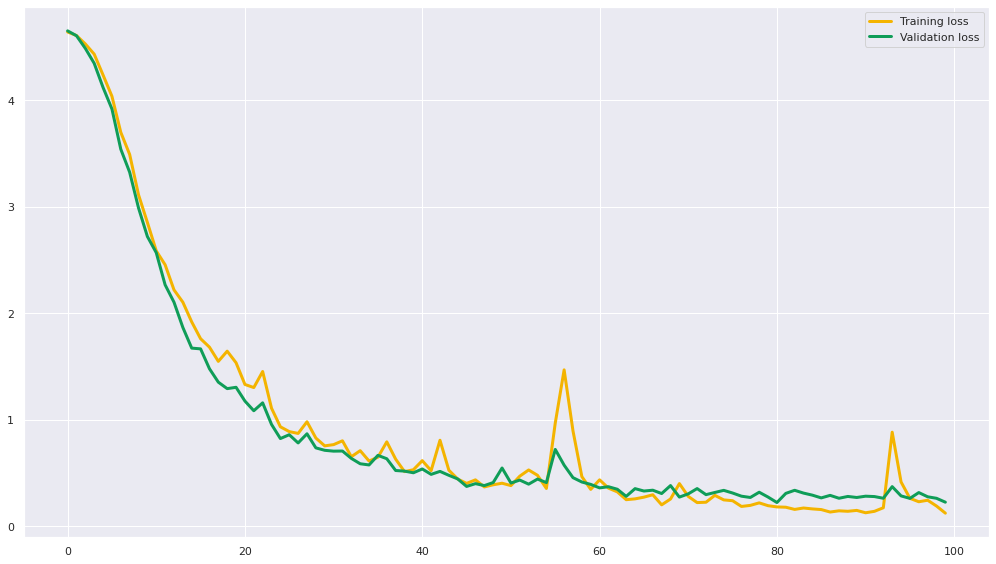

25
                                                                                                                            
The batch_size is: 16, The hidden_size is: 256, The dropout_rate is: 0.6, The optimizer_name is : Adam
Epoch 1/100
43/43 [==============================] - 1s 12ms/step - loss: 4.5743 - accuracy: 0.0371 - val_loss: 4.5469 - val_accuracy: 0.1176
Epoch 2/100
43/43 [==============================] - 0s 8ms/step - loss: 4.4989 - accuracy: 0.1337 - val_loss: 4.4907 - val_accuracy: 0.1933
Epoch 3/100
43/43 [==============================] - 0s 8ms/step - loss: 4.4135 - accuracy: 0.2303 - val_loss: 4.4078 - val_accuracy: 0.2437
Epoch 4/100
43/43 [==============================] - 0s 8ms/step - loss: 4.3003 - accuracy: 0.2779 - val_loss: 4.2992 - val_accuracy: 0.2773
Epoch 5/100
43/43 [==============================] - 0s 8ms/step - loss: 4.1422 - accuracy: 0.2897 - val_loss: 4.1536 - val_accuracy: 0.2689
Epoch 6/100
43/43 [==============================] - 0s 6ms/ste

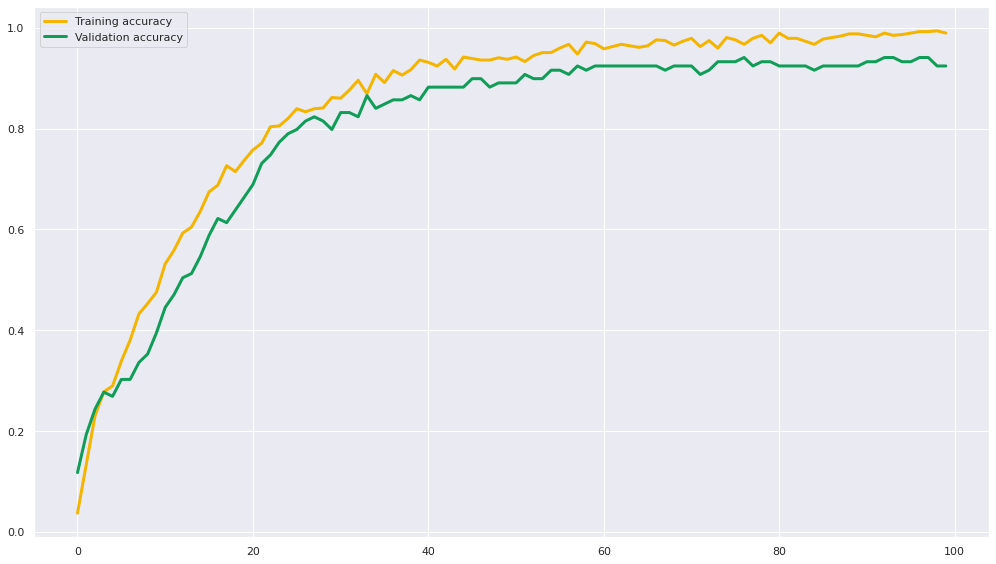

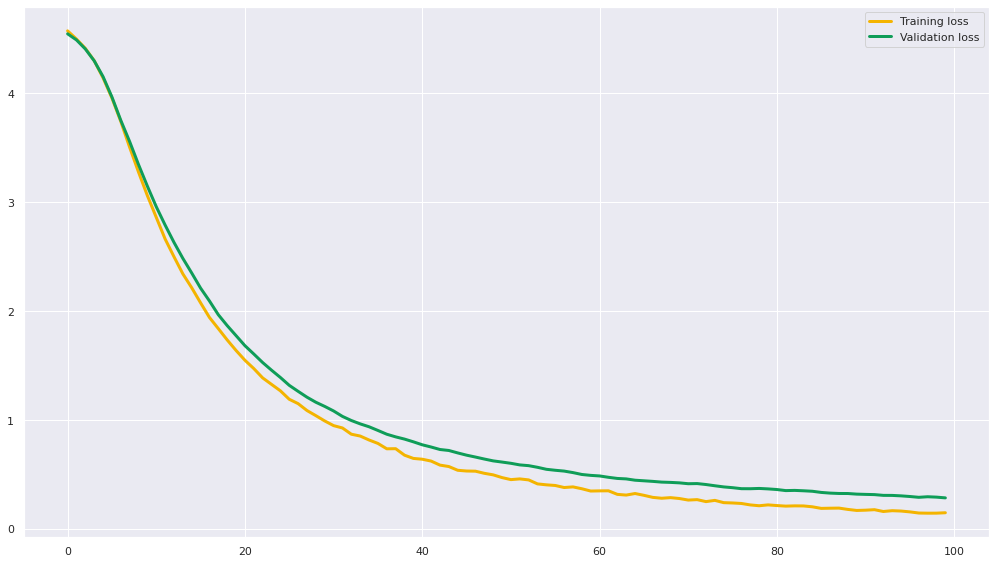

26
                                                                                                                            
The batch_size is: 16, The hidden_size is: 256, The dropout_rate is: 0.6, The optimizer_name is : RMSprop
Epoch 1/100
43/43 [==============================] - 1s 15ms/step - loss: 4.4258 - accuracy: 0.0624 - val_loss: 4.0278 - val_accuracy: 0.1176
Epoch 2/100
43/43 [==============================] - 0s 8ms/step - loss: 3.5432 - accuracy: 0.2422 - val_loss: 3.1202 - val_accuracy: 0.3445
Epoch 3/100
43/43 [==============================] - 0s 7ms/step - loss: 2.7322 - accuracy: 0.4056 - val_loss: 2.5065 - val_accuracy: 0.4118
Epoch 4/100
43/43 [==============================] - 0s 6ms/step - loss: 2.1742 - accuracy: 0.5215 - val_loss: 2.0541 - val_accuracy: 0.5294
Epoch 5/100
43/43 [==============================] - 0s 7ms/step - loss: 1.8003 - accuracy: 0.5973 - val_loss: 1.6371 - val_accuracy: 0.7059
Epoch 6/100
43/43 [==============================] - 0s 8ms/

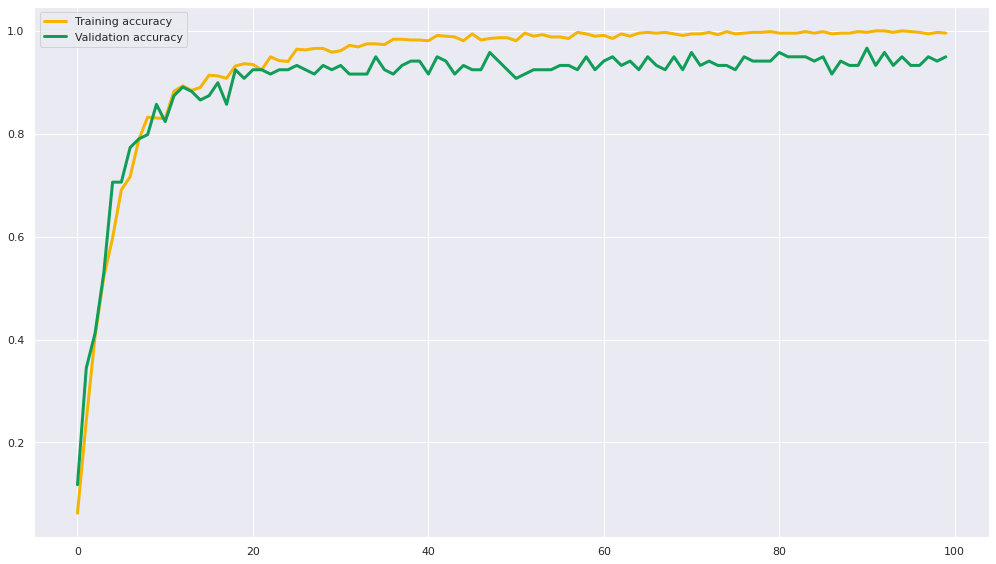

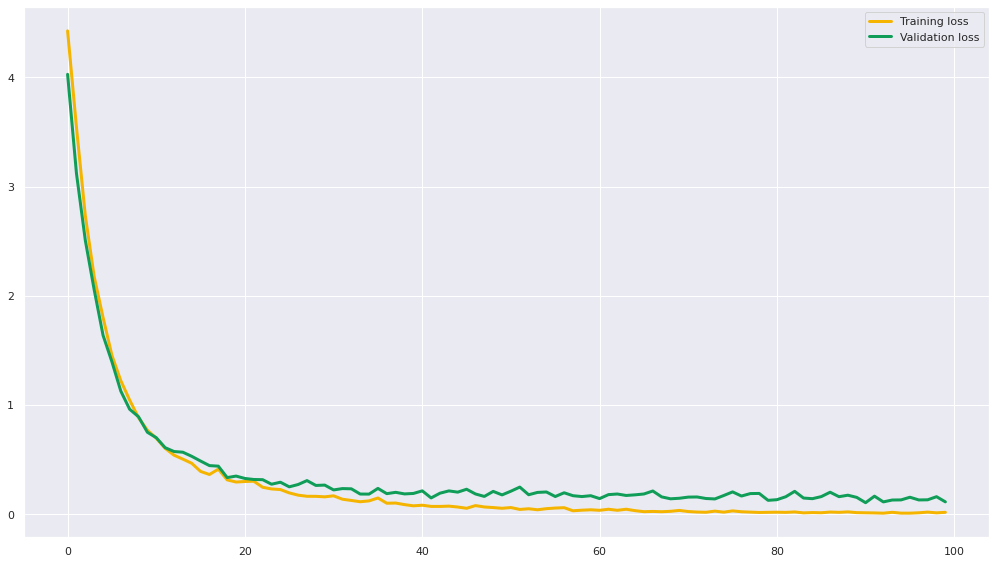

27
                                                                                                                            
The batch_size is: 32, The hidden_size is: 64, The dropout_rate is: 0.2, The optimizer_name is : SGD
Epoch 1/100
22/22 [==============================] - 1s 28ms/step - loss: 4.6009 - accuracy: 0.0119 - val_loss: 4.6076 - val_accuracy: 0.0000e+00
Epoch 2/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5940 - accuracy: 0.0074 - val_loss: 4.6156 - val_accuracy: 0.0168
Epoch 3/100
22/22 [==============================] - 0s 10ms/step - loss: 4.5848 - accuracy: 0.0119 - val_loss: 4.6065 - val_accuracy: 0.0252
Epoch 4/100
22/22 [==============================] - 0s 13ms/step - loss: 4.5546 - accuracy: 0.0059 - val_loss: 4.6065 - val_accuracy: 0.0168
Epoch 5/100
22/22 [==============================] - 0s 11ms/step - loss: 4.5410 - accuracy: 0.0119 - val_loss: 4.6025 - val_accuracy: 0.0084
Epoch 6/100
22/22 [==============================] - 0s 11

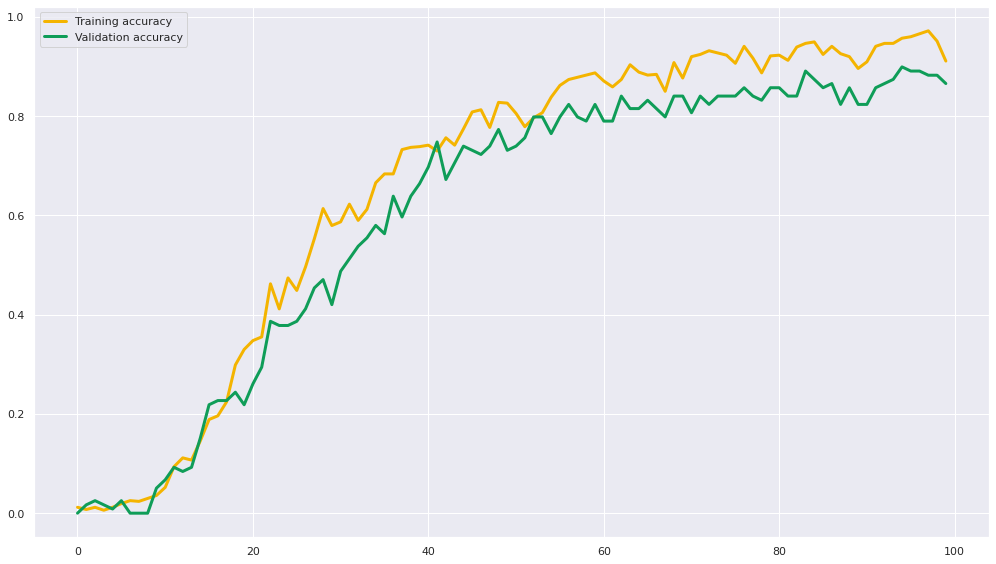

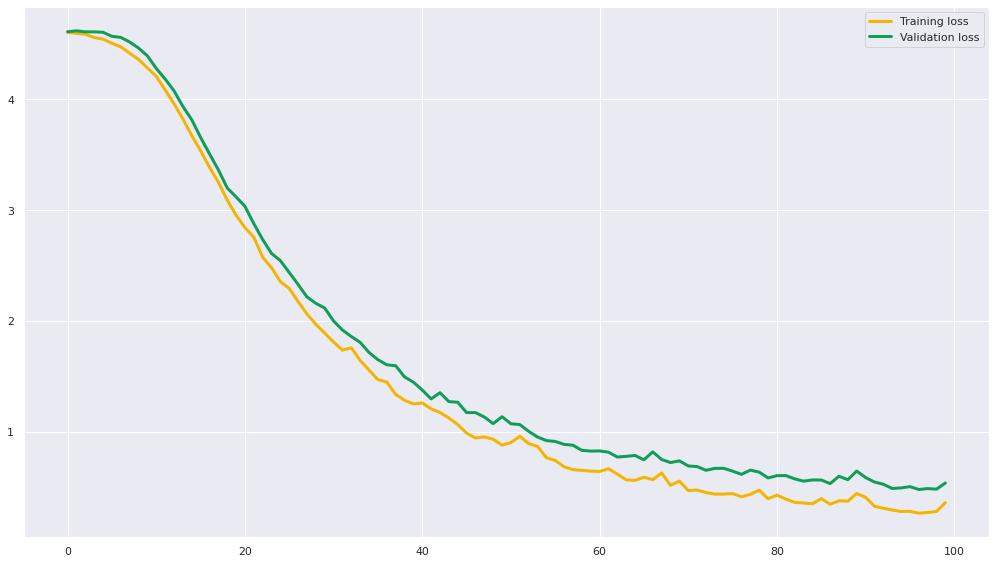

28
                                                                                                                            
The batch_size is: 32, The hidden_size is: 64, The dropout_rate is: 0.2, The optimizer_name is : Adam
Epoch 1/100
22/22 [==============================] - 1s 20ms/step - loss: 4.5897 - accuracy: 0.0178 - val_loss: 4.5876 - val_accuracy: 0.0168
Epoch 2/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5653 - accuracy: 0.0550 - val_loss: 4.5729 - val_accuracy: 0.0252
Epoch 3/100
22/22 [==============================] - 0s 6ms/step - loss: 4.5419 - accuracy: 0.0951 - val_loss: 4.5542 - val_accuracy: 0.0420
Epoch 4/100
22/22 [==============================] - 0s 6ms/step - loss: 4.5147 - accuracy: 0.1263 - val_loss: 4.5326 - val_accuracy: 0.0588
Epoch 5/100
22/22 [==============================] - 0s 6ms/step - loss: 4.4813 - accuracy: 0.1590 - val_loss: 4.5097 - val_accuracy: 0.0420
Epoch 6/100
22/22 [==============================] - 0s 6ms/step

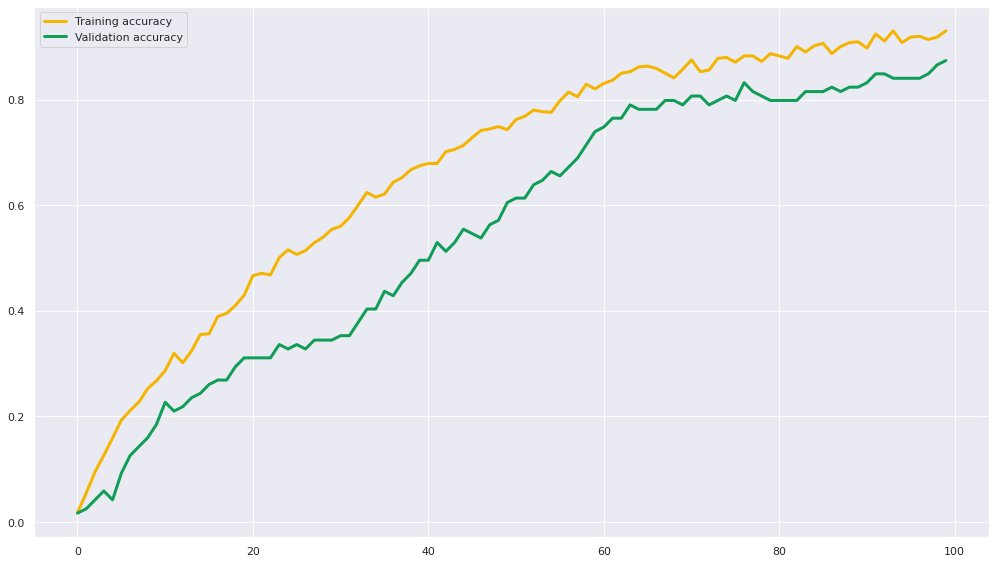

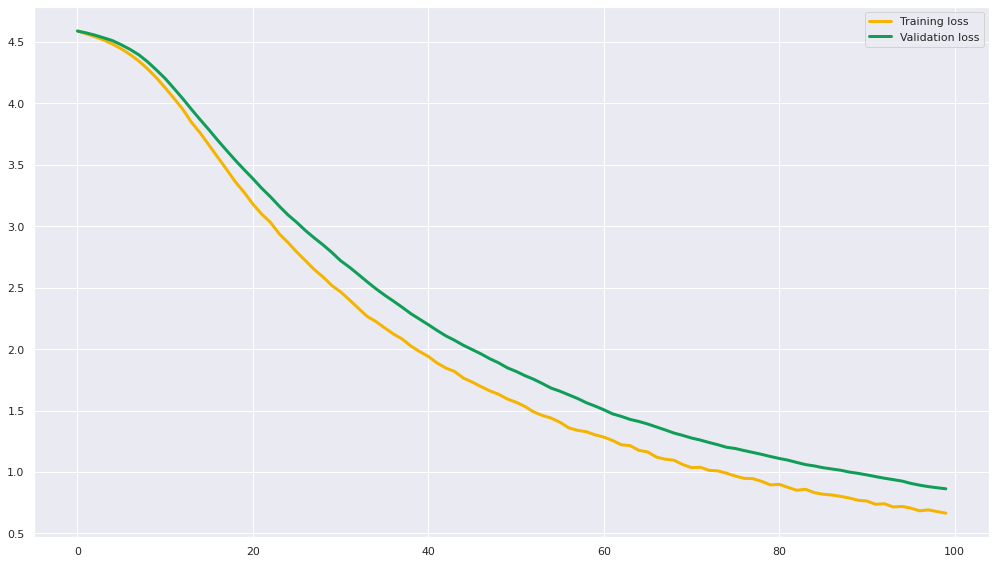

29
                                                                                                                            
The batch_size is: 32, The hidden_size is: 64, The dropout_rate is: 0.2, The optimizer_name is : RMSprop
Epoch 1/100
22/22 [==============================] - 1s 25ms/step - loss: 4.5012 - accuracy: 0.0654 - val_loss: 4.2946 - val_accuracy: 0.0672
Epoch 2/100
22/22 [==============================] - 0s 10ms/step - loss: 3.9738 - accuracy: 0.2065 - val_loss: 3.7011 - val_accuracy: 0.1933
Epoch 3/100
22/22 [==============================] - 0s 8ms/step - loss: 3.3056 - accuracy: 0.3373 - val_loss: 3.1272 - val_accuracy: 0.3950
Epoch 4/100
22/22 [==============================] - 0s 8ms/step - loss: 2.7448 - accuracy: 0.4562 - val_loss: 2.6702 - val_accuracy: 0.4454
Epoch 5/100
22/22 [==============================] - 0s 8ms/step - loss: 2.2721 - accuracy: 0.5617 - val_loss: 2.2010 - val_accuracy: 0.5546
Epoch 6/100
22/22 [==============================] - 0s 8ms/

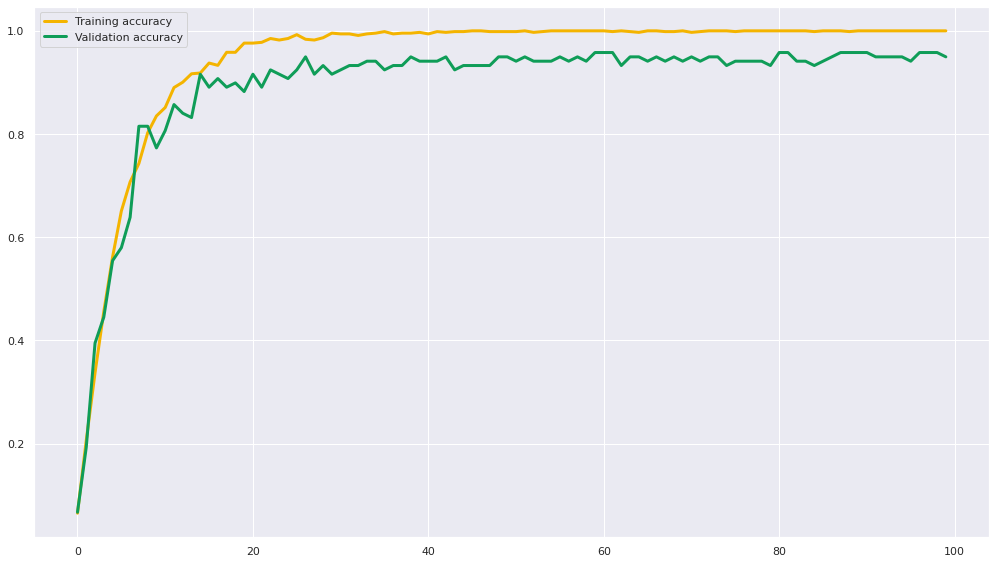

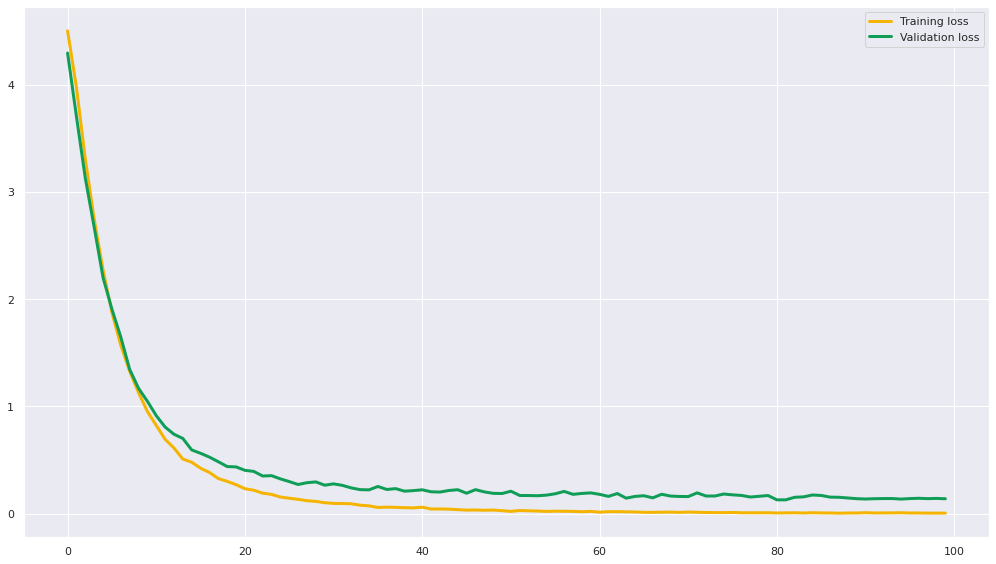

30
                                                                                                                            
The batch_size is: 32, The hidden_size is: 64, The dropout_rate is: 0.4, The optimizer_name is : SGD
Epoch 1/100
22/22 [==============================] - 2s 32ms/step - loss: 4.6010 - accuracy: 0.0015 - val_loss: 4.5987 - val_accuracy: 0.0252
Epoch 2/100
22/22 [==============================] - 0s 8ms/step - loss: 4.5981 - accuracy: 0.0134 - val_loss: 4.6084 - val_accuracy: 0.0252
Epoch 3/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5862 - accuracy: 0.0149 - val_loss: 4.6223 - val_accuracy: 0.0084
Epoch 4/100
22/22 [==============================] - 0s 8ms/step - loss: 4.5624 - accuracy: 0.0089 - val_loss: 4.6223 - val_accuracy: 0.0084
Epoch 5/100
22/22 [==============================] - 0s 11ms/step - loss: 4.5288 - accuracy: 0.0119 - val_loss: 4.6158 - val_accuracy: 0.0000e+00
Epoch 6/100
22/22 [==============================] - 0s 11ms

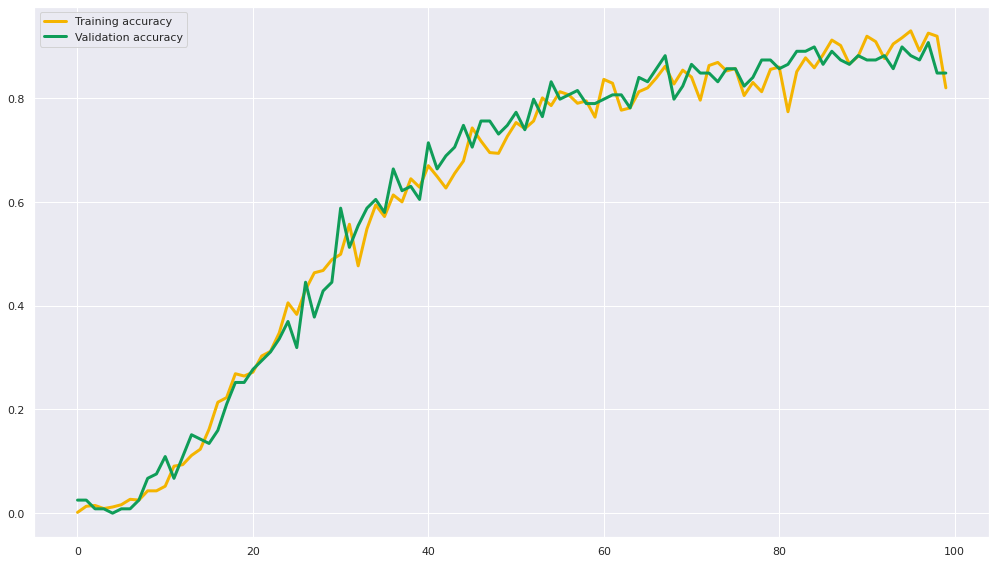

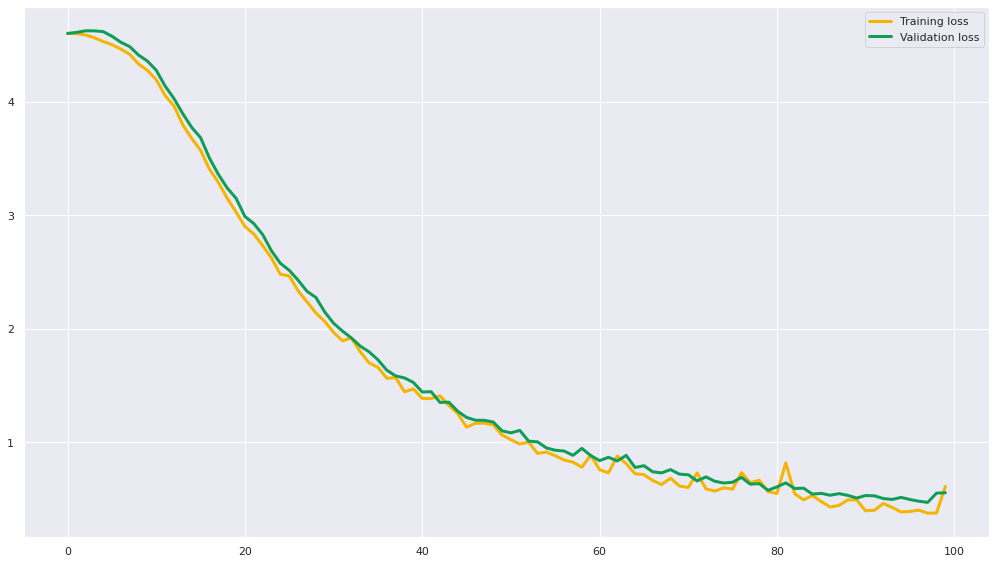

31
                                                                                                                            
The batch_size is: 32, The hidden_size is: 64, The dropout_rate is: 0.4, The optimizer_name is : Adam
Epoch 1/100
22/22 [==============================] - 1s 19ms/step - loss: 4.5924 - accuracy: 0.0134 - val_loss: 4.5834 - val_accuracy: 0.0084
Epoch 2/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5683 - accuracy: 0.0431 - val_loss: 4.5708 - val_accuracy: 0.0420
Epoch 3/100
22/22 [==============================] - 0s 6ms/step - loss: 4.5495 - accuracy: 0.0847 - val_loss: 4.5558 - val_accuracy: 0.1008
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5253 - accuracy: 0.1308 - val_loss: 4.5377 - val_accuracy: 0.1345
Epoch 5/100
22/22 [==============================] - 0s 6ms/step - loss: 4.5004 - accuracy: 0.1813 - val_loss: 4.5143 - val_accuracy: 0.2017
Epoch 6/100
22/22 [==============================] - 0s 6ms/step

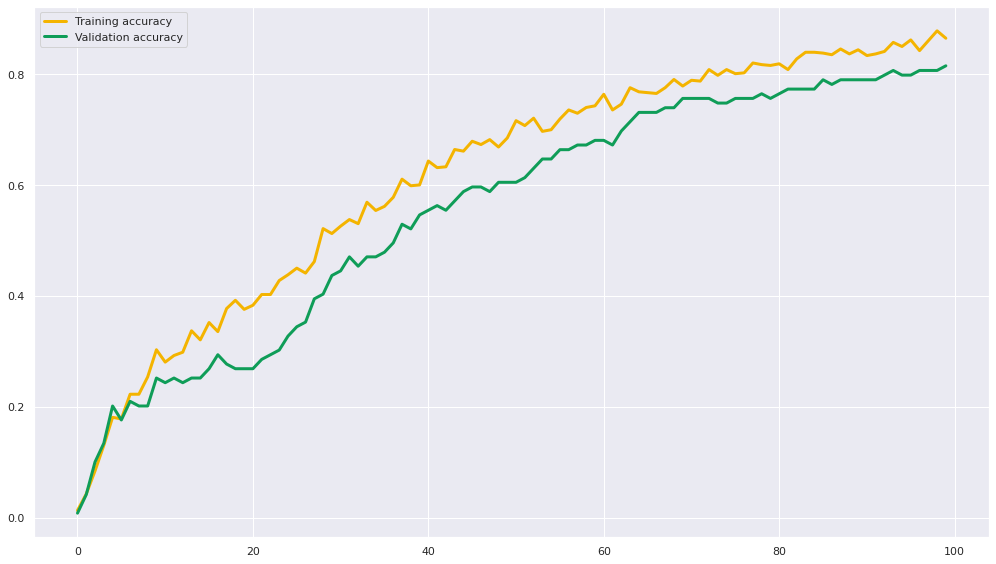

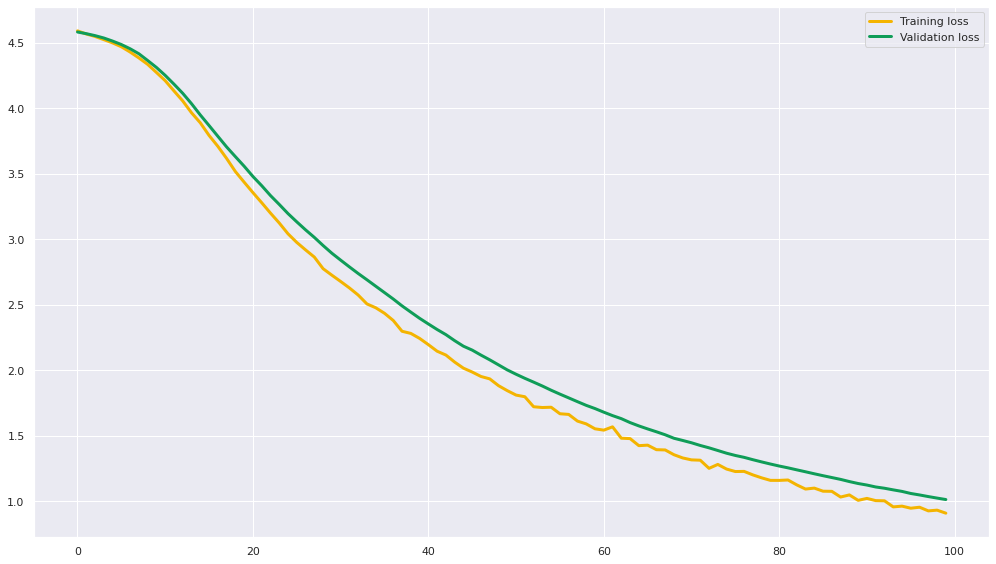

32
                                                                                                                            
The batch_size is: 32, The hidden_size is: 64, The dropout_rate is: 0.4, The optimizer_name is : RMSprop
Epoch 1/100
22/22 [==============================] - 1s 20ms/step - loss: 4.5235 - accuracy: 0.0490 - val_loss: 4.3575 - val_accuracy: 0.1345
Epoch 2/100
22/22 [==============================] - 0s 7ms/step - loss: 4.0975 - accuracy: 0.1917 - val_loss: 3.9028 - val_accuracy: 0.1429
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 3.5328 - accuracy: 0.2868 - val_loss: 3.4115 - val_accuracy: 0.3025
Epoch 4/100
22/22 [==============================] - 0s 9ms/step - loss: 3.0172 - accuracy: 0.3507 - val_loss: 2.9948 - val_accuracy: 0.3361
Epoch 5/100
22/22 [==============================] - 0s 9ms/step - loss: 2.6513 - accuracy: 0.4339 - val_loss: 2.6236 - val_accuracy: 0.4454
Epoch 6/100
22/22 [==============================] - 0s 8ms/s

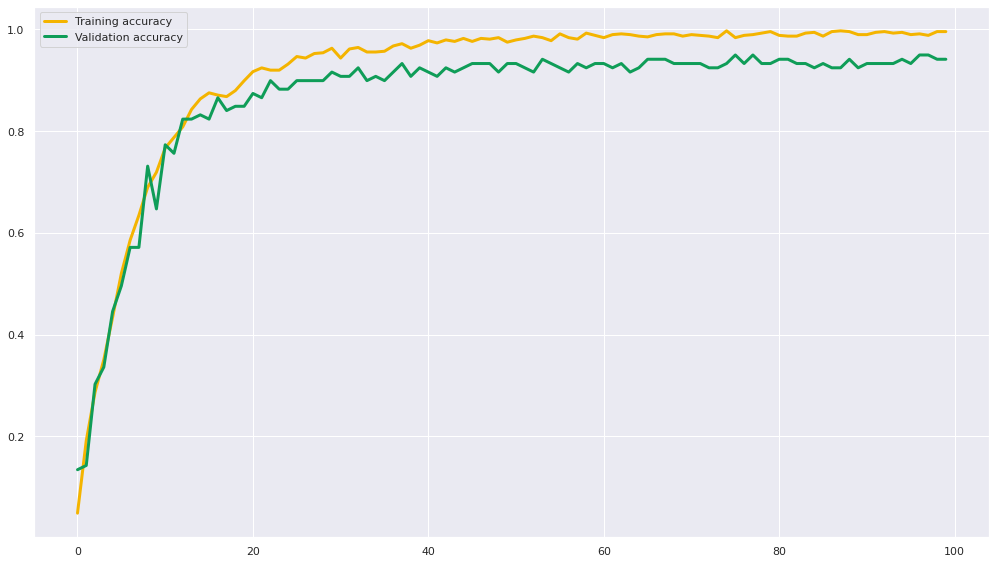

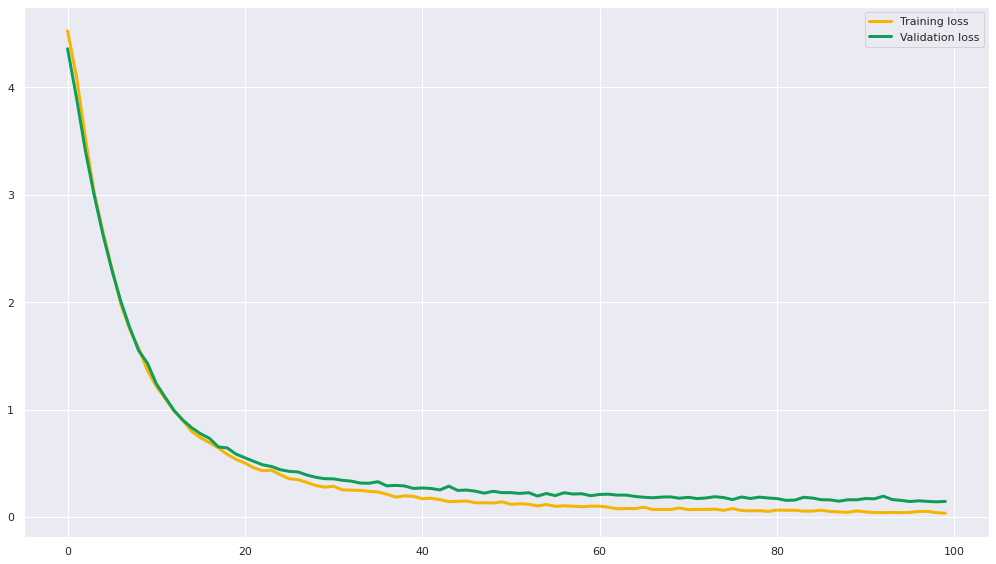

33
                                                                                                                            
The batch_size is: 32, The hidden_size is: 64, The dropout_rate is: 0.6, The optimizer_name is : SGD
Epoch 1/100
22/22 [==============================] - 2s 32ms/step - loss: 4.6050 - accuracy: 0.0119 - val_loss: 4.6082 - val_accuracy: 0.0168
Epoch 2/100
22/22 [==============================] - 0s 13ms/step - loss: 4.6073 - accuracy: 0.0104 - val_loss: 4.6266 - val_accuracy: 0.0168
Epoch 3/100
22/22 [==============================] - 0s 8ms/step - loss: 4.6081 - accuracy: 0.0134 - val_loss: 4.6136 - val_accuracy: 0.0168
Epoch 4/100
22/22 [==============================] - 0s 8ms/step - loss: 4.5787 - accuracy: 0.0149 - val_loss: 4.5859 - val_accuracy: 0.0252
Epoch 5/100
22/22 [==============================] - 0s 8ms/step - loss: 4.5648 - accuracy: 0.0208 - val_loss: 4.5960 - val_accuracy: 0.0168
Epoch 6/100
22/22 [==============================] - 0s 9ms/step

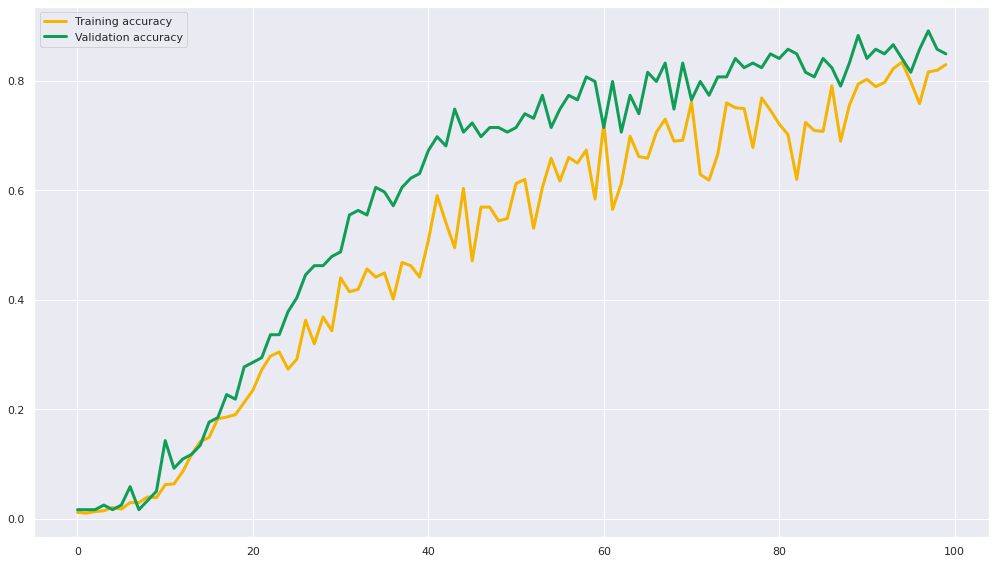

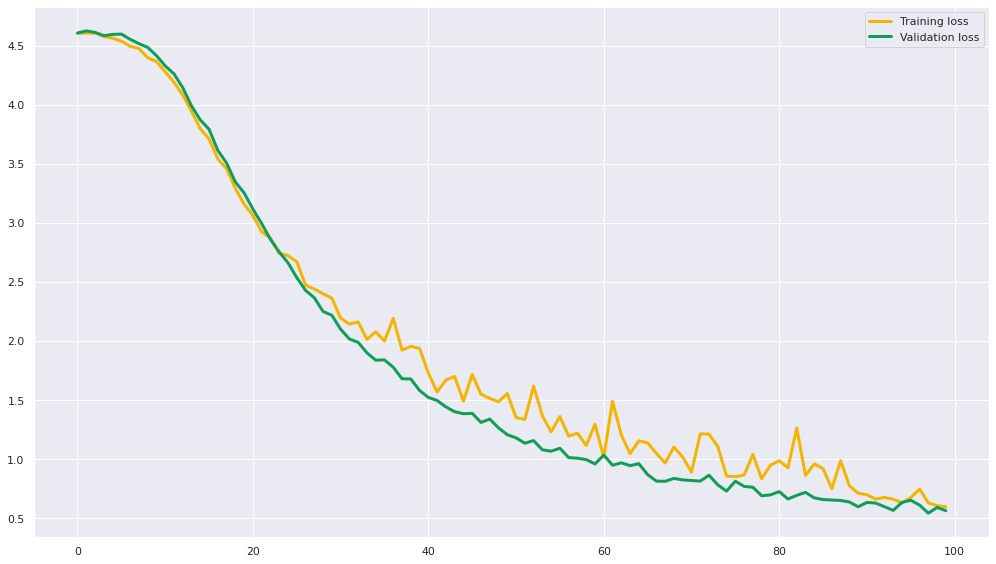

34
                                                                                                                            
The batch_size is: 32, The hidden_size is: 64, The dropout_rate is: 0.6, The optimizer_name is : Adam
Epoch 1/100
22/22 [==============================] - 1s 23ms/step - loss: 4.5912 - accuracy: 0.0149 - val_loss: 4.5876 - val_accuracy: 0.0168
Epoch 2/100
22/22 [==============================] - 0s 6ms/step - loss: 4.5720 - accuracy: 0.0357 - val_loss: 4.5767 - val_accuracy: 0.0000e+00
Epoch 3/100
22/22 [==============================] - 0s 6ms/step - loss: 4.5582 - accuracy: 0.0579 - val_loss: 4.5644 - val_accuracy: 0.0336
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5371 - accuracy: 0.0936 - val_loss: 4.5513 - val_accuracy: 0.0756
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 4.5185 - accuracy: 0.1174 - val_loss: 4.5345 - val_accuracy: 0.1176
Epoch 6/100
22/22 [==============================] - 0s 5ms/

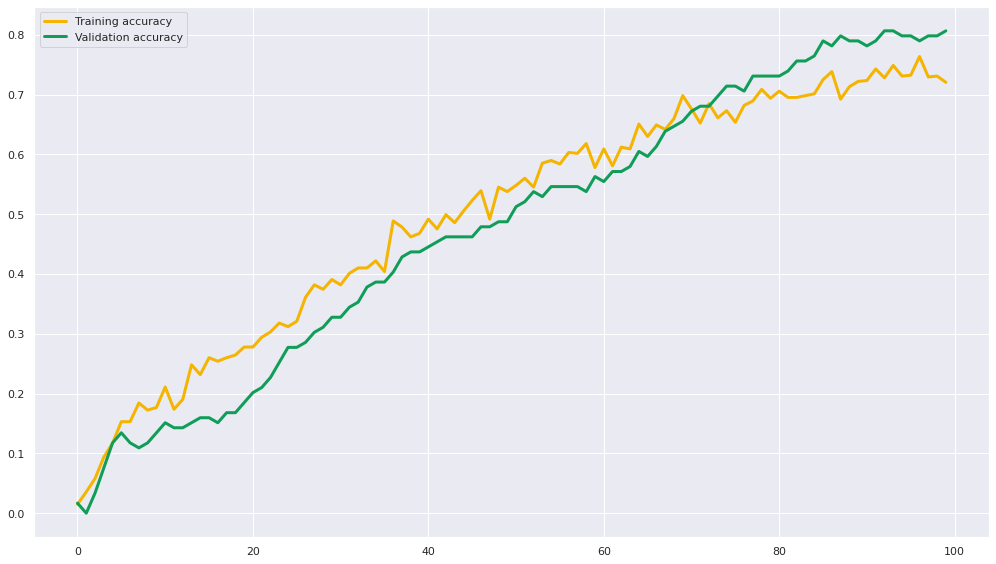

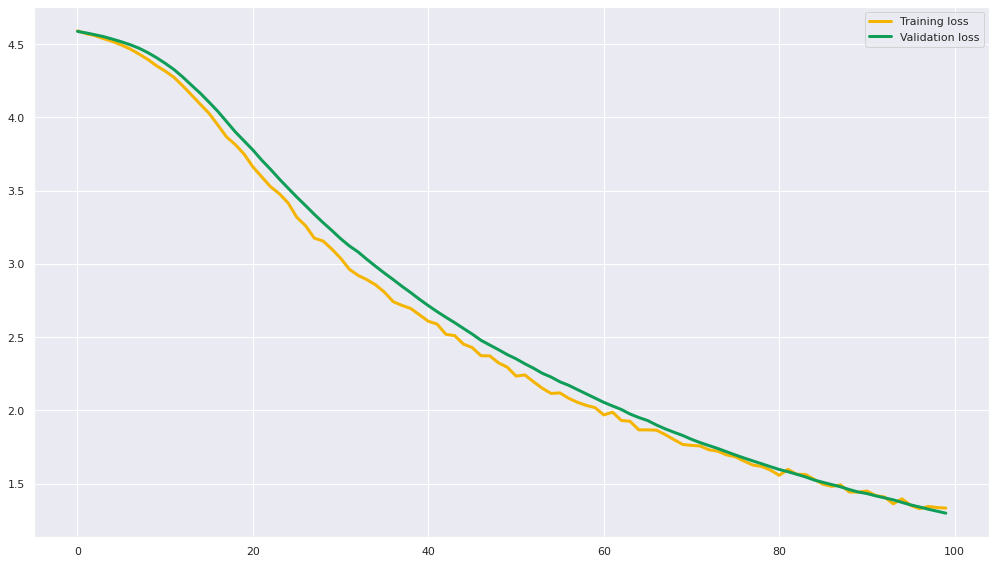

35
                                                                                                                            
The batch_size is: 32, The hidden_size is: 64, The dropout_rate is: 0.6, The optimizer_name is : RMSprop
Epoch 1/100
22/22 [==============================] - 3s 96ms/step - loss: 4.5577 - accuracy: 0.0327 - val_loss: 4.4704 - val_accuracy: 0.0840
Epoch 2/100
22/22 [==============================] - 0s 10ms/step - loss: 4.2979 - accuracy: 0.1204 - val_loss: 4.1809 - val_accuracy: 0.1513
Epoch 3/100
22/22 [==============================] - 0s 8ms/step - loss: 3.9081 - accuracy: 0.1947 - val_loss: 3.8011 - val_accuracy: 0.2185
Epoch 4/100
22/22 [==============================] - 0s 11ms/step - loss: 3.4809 - accuracy: 0.2823 - val_loss: 3.4495 - val_accuracy: 0.2605
Epoch 5/100
22/22 [==============================] - 0s 10ms/step - loss: 3.1399 - accuracy: 0.3016 - val_loss: 3.0892 - val_accuracy: 0.3445
Epoch 6/100
22/22 [==============================] - 0s 8m

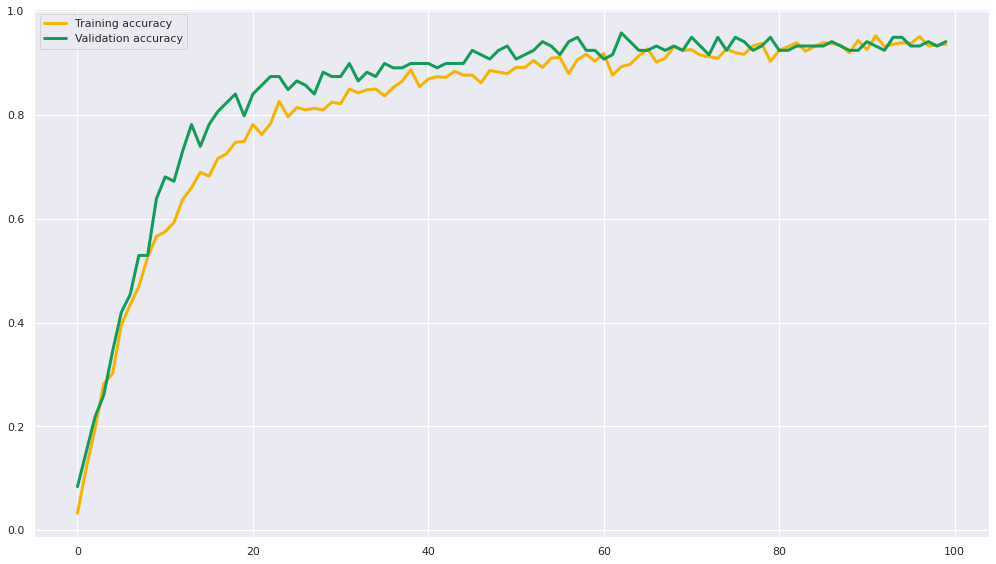

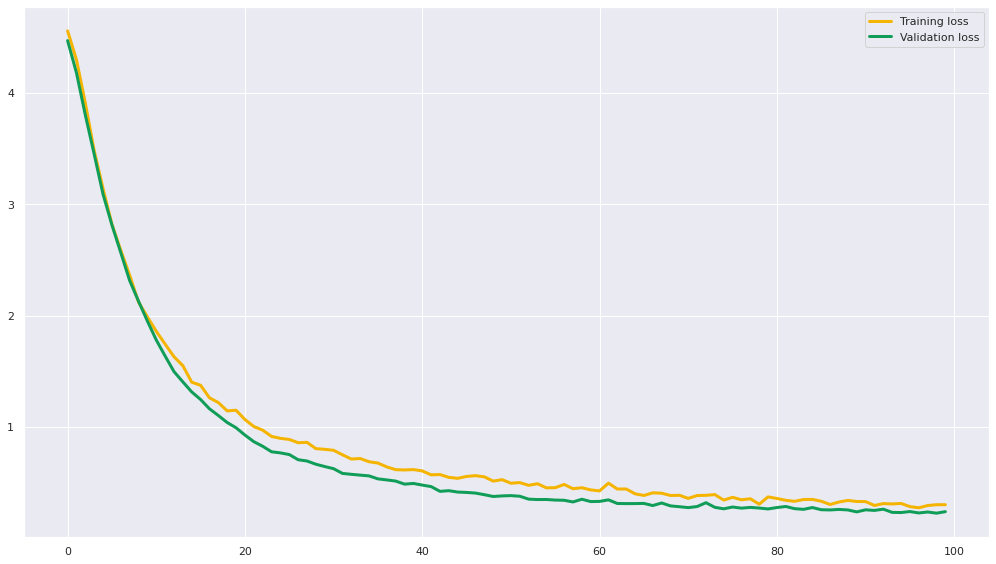

36
                                                                                                                            
The batch_size is: 32, The hidden_size is: 128, The dropout_rate is: 0.2, The optimizer_name is : SGD
Epoch 1/100
22/22 [==============================] - 1s 21ms/step - loss: 4.6034 - accuracy: 0.0089 - val_loss: 4.6155 - val_accuracy: 0.0252
Epoch 2/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5842 - accuracy: 0.0104 - val_loss: 4.6254 - val_accuracy: 0.0252
Epoch 3/100
22/22 [==============================] - 0s 10ms/step - loss: 4.5627 - accuracy: 0.0134 - val_loss: 4.6264 - val_accuracy: 0.0000e+00
Epoch 4/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5334 - accuracy: 0.0119 - val_loss: 4.5900 - val_accuracy: 0.0000e+00
Epoch 5/100
22/22 [==============================] - 0s 10ms/step - loss: 4.4911 - accuracy: 0.0163 - val_loss: 4.5456 - val_accuracy: 0.0336
Epoch 6/100
22/22 [==============================] - 0

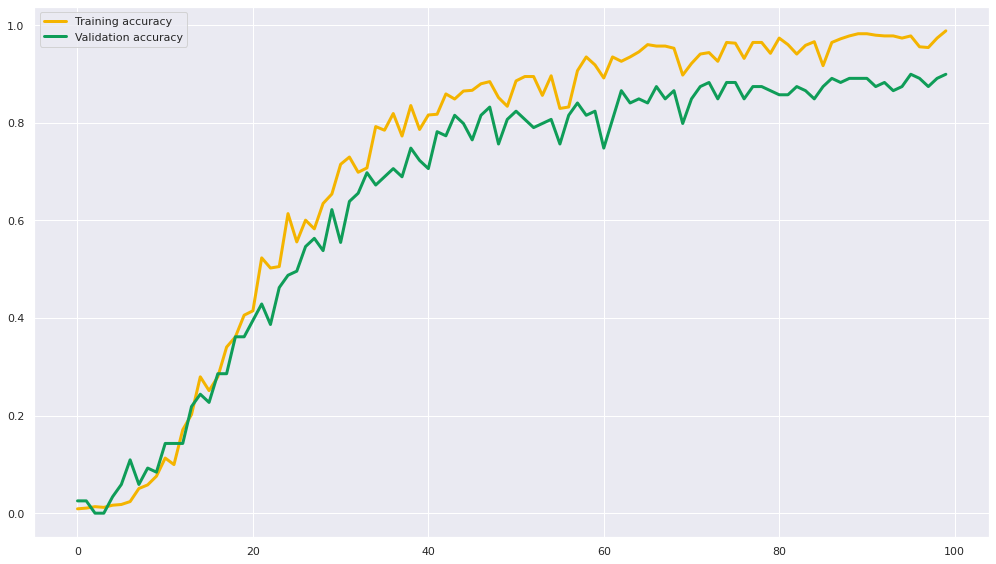

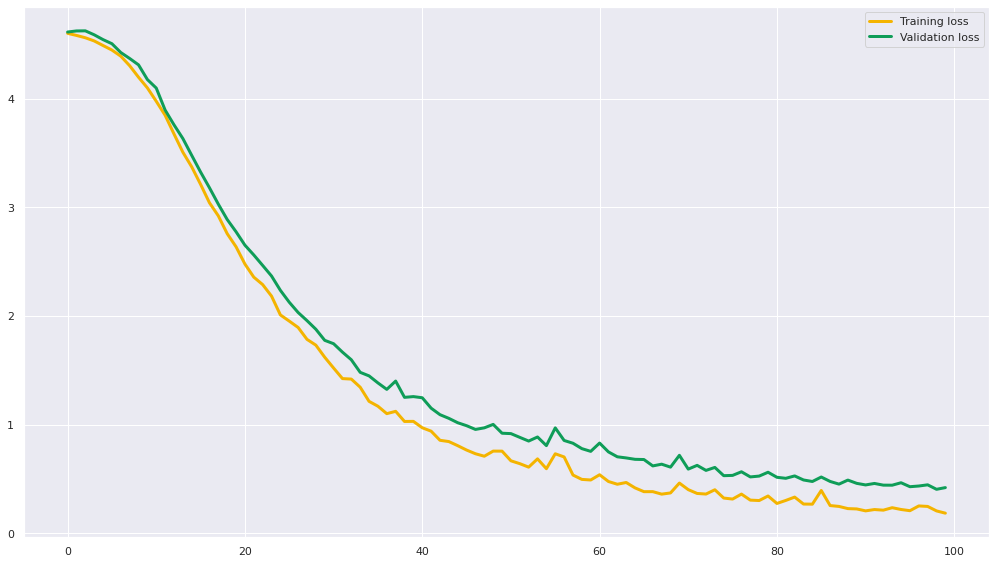

37
                                                                                                                            
The batch_size is: 32, The hidden_size is: 128, The dropout_rate is: 0.2, The optimizer_name is : Adam
Epoch 1/100
22/22 [==============================] - 2s 24ms/step - loss: 4.5839 - accuracy: 0.0327 - val_loss: 4.5645 - val_accuracy: 0.0336
Epoch 2/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5421 - accuracy: 0.1189 - val_loss: 4.5326 - val_accuracy: 0.1429
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 4.4988 - accuracy: 0.2021 - val_loss: 4.4970 - val_accuracy: 0.1765
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 4.4498 - accuracy: 0.2689 - val_loss: 4.4508 - val_accuracy: 0.2017
Epoch 5/100
22/22 [==============================] - 0s 6ms/step - loss: 4.3872 - accuracy: 0.3165 - val_loss: 4.3919 - val_accuracy: 0.2269
Epoch 6/100
22/22 [==============================] - 0s 6ms/ste

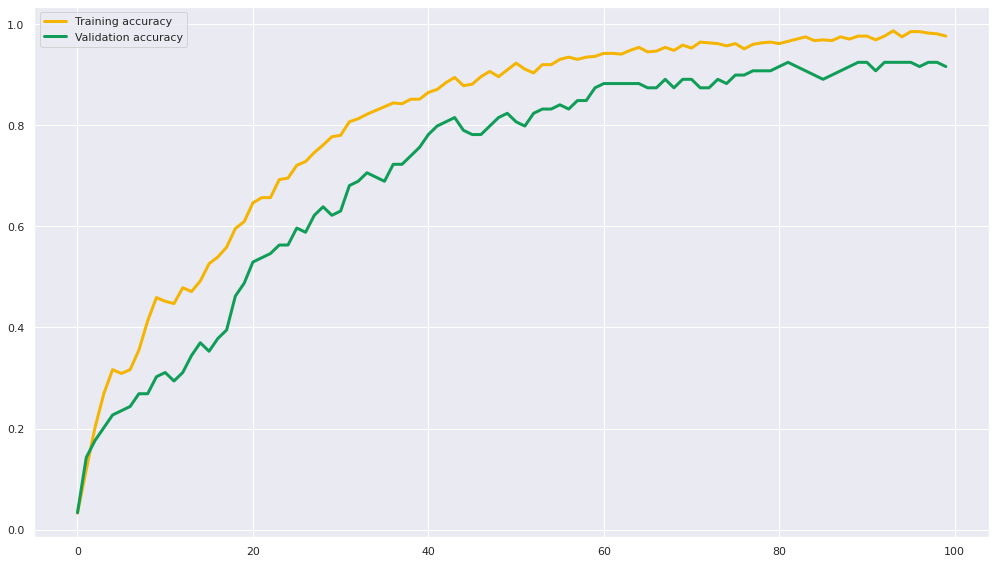

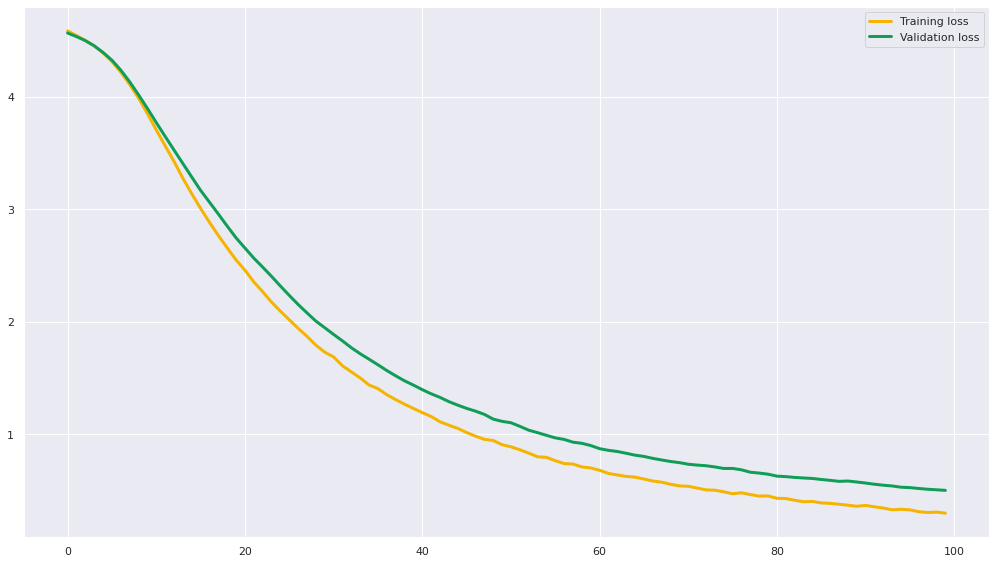

38
                                                                                                                            
The batch_size is: 32, The hidden_size is: 128, The dropout_rate is: 0.2, The optimizer_name is : RMSprop
Epoch 1/100
22/22 [==============================] - 1s 23ms/step - loss: 4.4303 - accuracy: 0.0862 - val_loss: 4.0919 - val_accuracy: 0.2101
Epoch 2/100
22/22 [==============================] - 0s 9ms/step - loss: 3.6090 - accuracy: 0.2883 - val_loss: 3.2750 - val_accuracy: 0.2689
Epoch 3/100
22/22 [==============================] - 0s 9ms/step - loss: 2.7450 - accuracy: 0.4398 - val_loss: 2.5268 - val_accuracy: 0.4202
Epoch 4/100
22/22 [==============================] - 0s 11ms/step - loss: 2.0942 - accuracy: 0.5869 - val_loss: 2.0125 - val_accuracy: 0.5210
Epoch 5/100
22/22 [==============================] - 0s 8ms/step - loss: 1.6014 - accuracy: 0.6805 - val_loss: 1.6364 - val_accuracy: 0.6218
Epoch 6/100
22/22 [==============================] - 0s 8ms

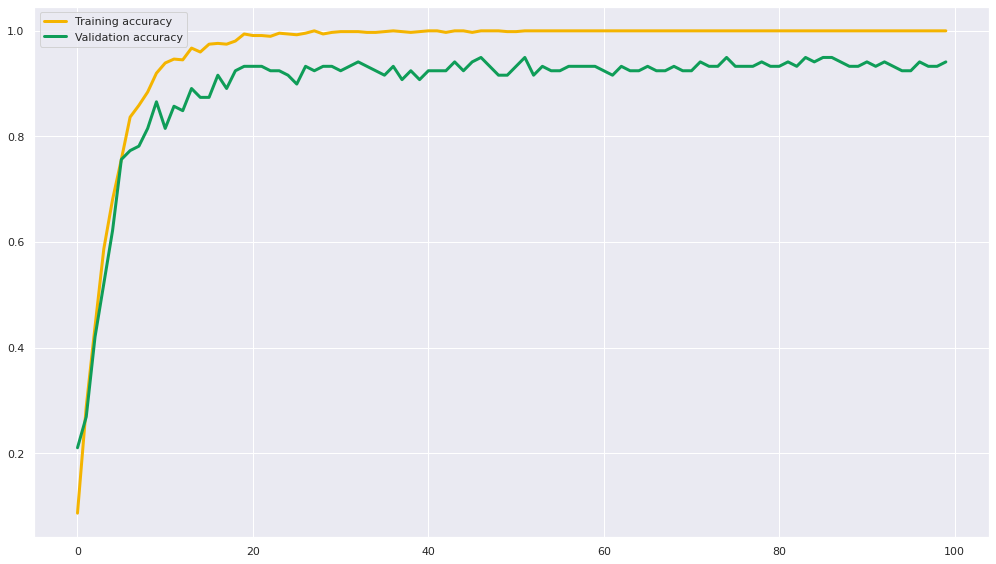

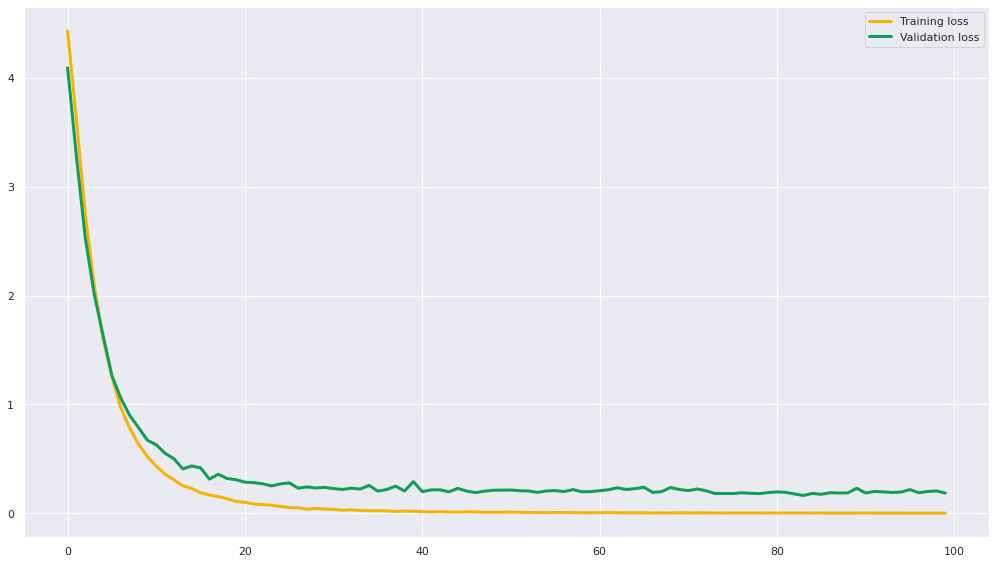

39
                                                                                                                            
The batch_size is: 32, The hidden_size is: 128, The dropout_rate is: 0.4, The optimizer_name is : SGD
Epoch 1/100
22/22 [==============================] - 1s 26ms/step - loss: 4.6001 - accuracy: 0.0089 - val_loss: 4.6060 - val_accuracy: 0.0000e+00
Epoch 2/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5922 - accuracy: 0.0104 - val_loss: 4.6212 - val_accuracy: 0.0252
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5766 - accuracy: 0.0104 - val_loss: 4.6198 - val_accuracy: 0.0000e+00
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5412 - accuracy: 0.0163 - val_loss: 4.5854 - val_accuracy: 0.0168
Epoch 5/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5067 - accuracy: 0.0223 - val_loss: 4.5495 - val_accuracy: 0.0420
Epoch 6/100
22/22 [==============================] - 0s 

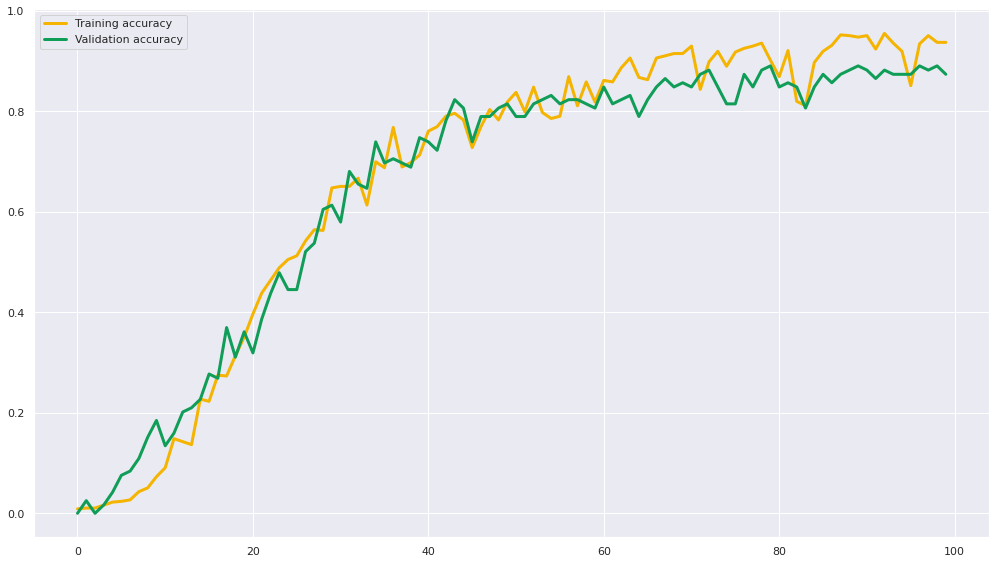

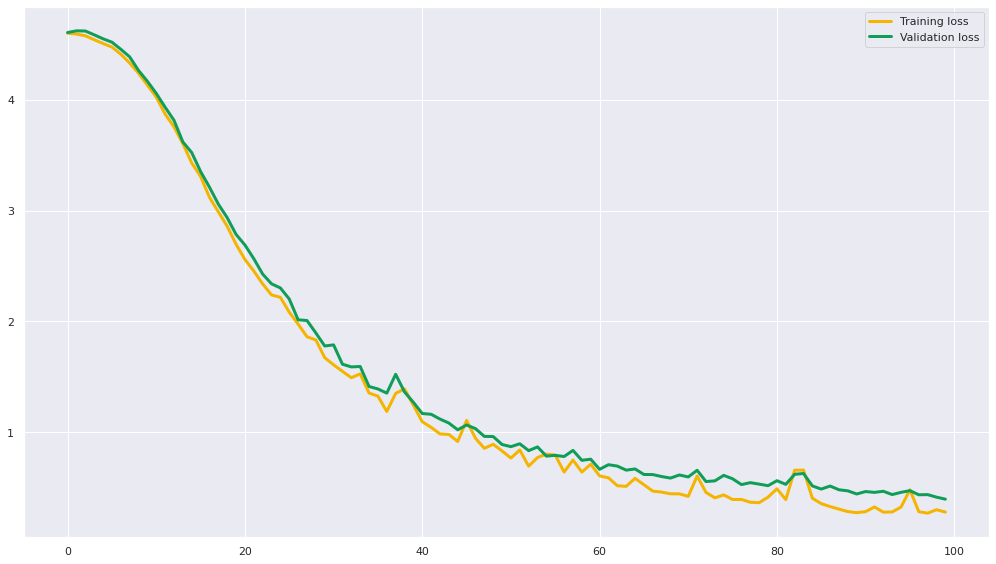

40
                                                                                                                            
The batch_size is: 32, The hidden_size is: 128, The dropout_rate is: 0.4, The optimizer_name is : Adam
Epoch 1/100
22/22 [==============================] - 1s 20ms/step - loss: 4.5871 - accuracy: 0.0282 - val_loss: 4.5743 - val_accuracy: 0.1092
Epoch 2/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5505 - accuracy: 0.0966 - val_loss: 4.5490 - val_accuracy: 0.1345
Epoch 3/100
22/22 [==============================] - 0s 10ms/step - loss: 4.5159 - accuracy: 0.1412 - val_loss: 4.5205 - val_accuracy: 0.1513
Epoch 4/100
22/22 [==============================] - 0s 8ms/step - loss: 4.4744 - accuracy: 0.2288 - val_loss: 4.4855 - val_accuracy: 0.1681
Epoch 5/100
22/22 [==============================] - 0s 8ms/step - loss: 4.4241 - accuracy: 0.2452 - val_loss: 4.4414 - val_accuracy: 0.1933
Epoch 6/100
22/22 [==============================] - 0s 9ms/st

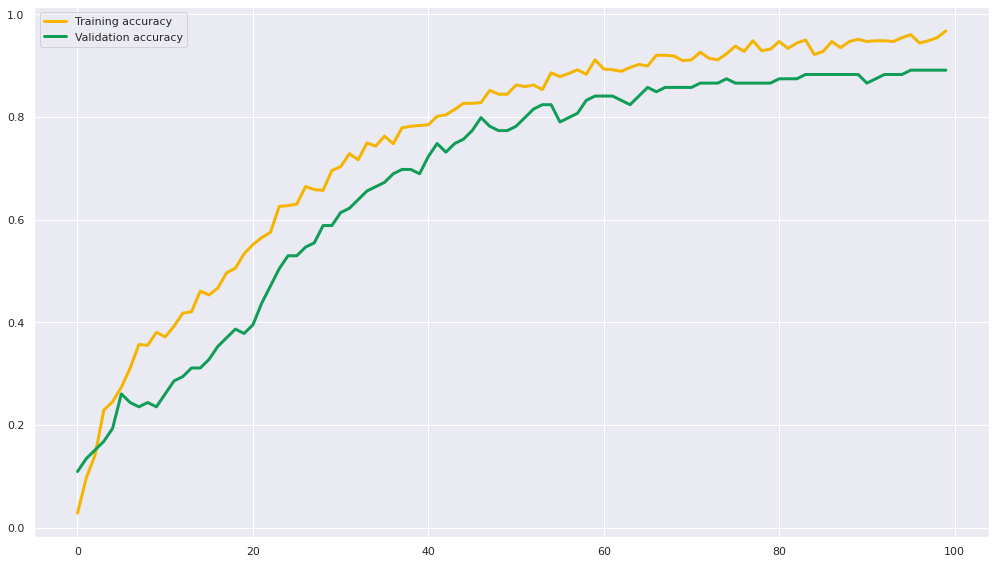

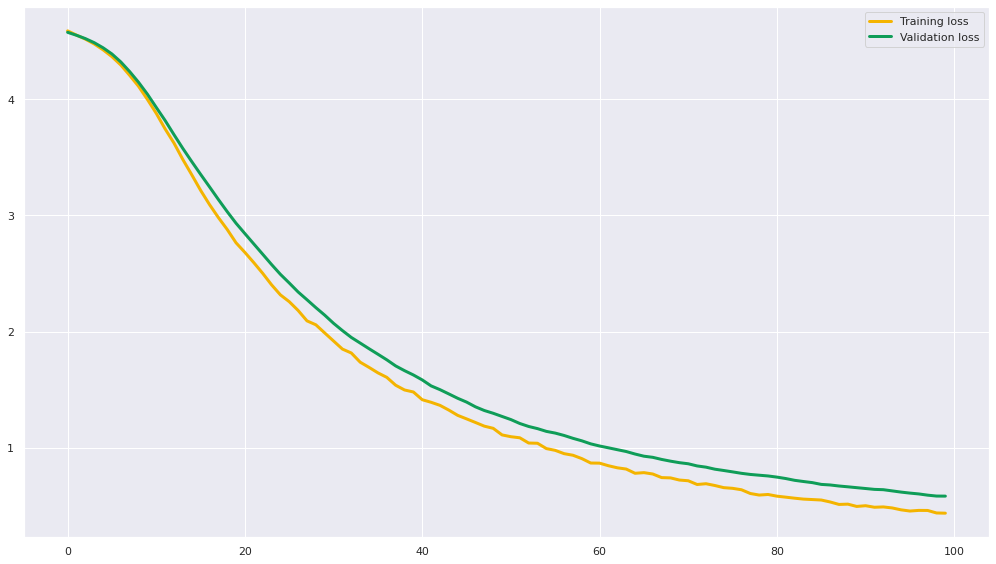

41
                                                                                                                            
The batch_size is: 32, The hidden_size is: 128, The dropout_rate is: 0.4, The optimizer_name is : RMSprop
Epoch 1/100
22/22 [==============================] - 2s 31ms/step - loss: 4.4772 - accuracy: 0.0654 - val_loss: 4.2033 - val_accuracy: 0.1933
Epoch 2/100
22/22 [==============================] - 0s 8ms/step - loss: 3.8131 - accuracy: 0.2214 - val_loss: 3.5485 - val_accuracy: 0.2857
Epoch 3/100
22/22 [==============================] - 0s 11ms/step - loss: 3.0591 - accuracy: 0.3655 - val_loss: 2.8980 - val_accuracy: 0.3529
Epoch 4/100
22/22 [==============================] - 0s 10ms/step - loss: 2.4685 - accuracy: 0.4651 - val_loss: 2.3681 - val_accuracy: 0.4706
Epoch 5/100
22/22 [==============================] - 0s 10ms/step - loss: 2.0003 - accuracy: 0.6033 - val_loss: 1.9671 - val_accuracy: 0.5882
Epoch 6/100
22/22 [==============================] - 0s 9

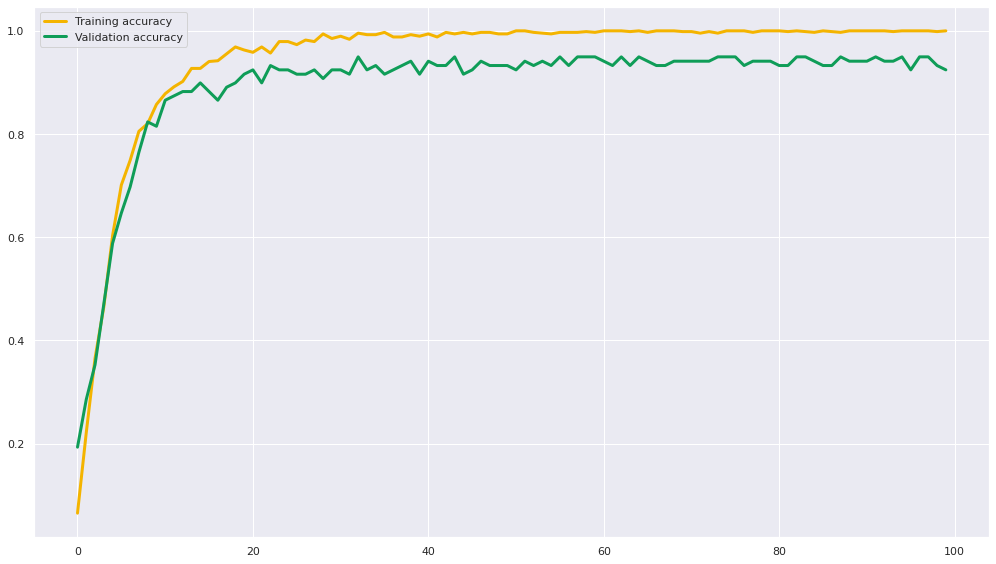

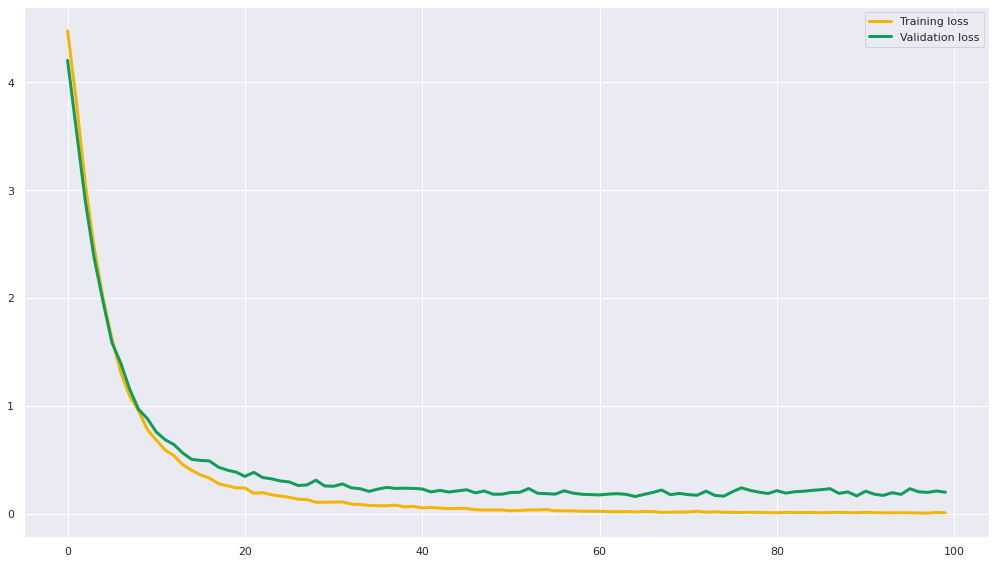

42
                                                                                                                            
The batch_size is: 32, The hidden_size is: 128, The dropout_rate is: 0.6, The optimizer_name is : SGD
Epoch 1/100
22/22 [==============================] - 1s 23ms/step - loss: 4.6046 - accuracy: 0.0015 - val_loss: 4.6090 - val_accuracy: 0.0084
Epoch 2/100
22/22 [==============================] - 0s 8ms/step - loss: 4.6048 - accuracy: 0.0119 - val_loss: 4.6386 - val_accuracy: 0.0084
Epoch 3/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5887 - accuracy: 0.0149 - val_loss: 4.6264 - val_accuracy: 0.0084
Epoch 4/100
22/22 [==============================] - 0s 8ms/step - loss: 4.5560 - accuracy: 0.0208 - val_loss: 4.6055 - val_accuracy: 0.0168
Epoch 5/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5432 - accuracy: 0.0223 - val_loss: 4.5573 - val_accuracy: 0.0420
Epoch 6/100
22/22 [==============================] - 0s 7ms/step

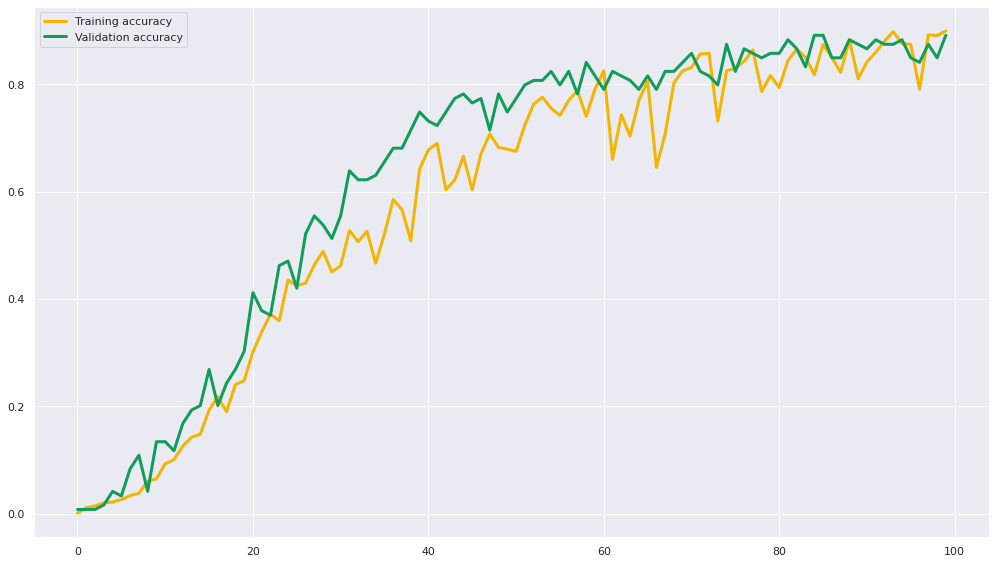

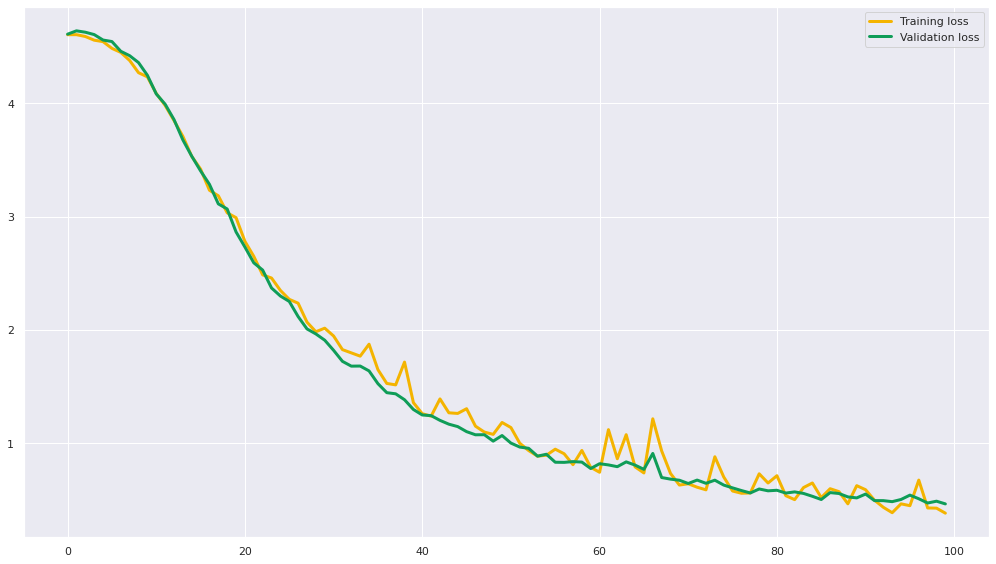

43
                                                                                                                            
The batch_size is: 32, The hidden_size is: 128, The dropout_rate is: 0.6, The optimizer_name is : Adam
Epoch 1/100
22/22 [==============================] - 1s 23ms/step - loss: 4.5917 - accuracy: 0.0134 - val_loss: 4.5771 - val_accuracy: 0.0504
Epoch 2/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5613 - accuracy: 0.0461 - val_loss: 4.5554 - val_accuracy: 0.0168
Epoch 3/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5322 - accuracy: 0.0773 - val_loss: 4.5297 - val_accuracy: 0.0924
Epoch 4/100
22/22 [==============================] - 0s 8ms/step - loss: 4.5004 - accuracy: 0.1456 - val_loss: 4.4984 - val_accuracy: 0.1681
Epoch 5/100
22/22 [==============================] - 0s 6ms/step - loss: 4.4622 - accuracy: 0.1887 - val_loss: 4.4625 - val_accuracy: 0.2437
Epoch 6/100
22/22 [==============================] - 0s 7ms/ste

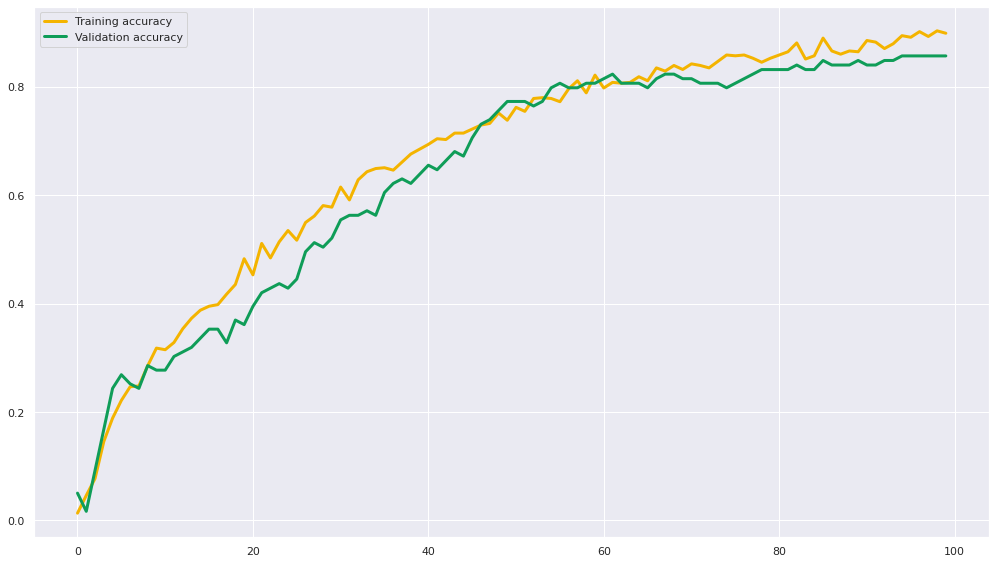

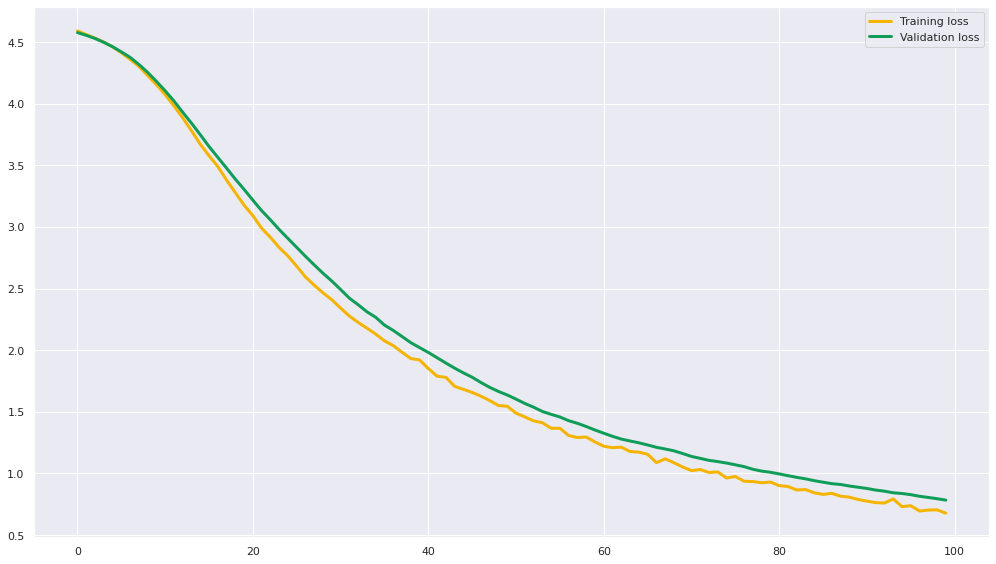

44
                                                                                                                            
The batch_size is: 32, The hidden_size is: 128, The dropout_rate is: 0.6, The optimizer_name is : RMSprop
Epoch 1/100
22/22 [==============================] - 1s 27ms/step - loss: 4.5206 - accuracy: 0.0461 - val_loss: 4.3439 - val_accuracy: 0.1176
Epoch 2/100
22/22 [==============================] - 0s 9ms/step - loss: 4.0653 - accuracy: 0.1902 - val_loss: 3.8474 - val_accuracy: 0.2353
Epoch 3/100
22/22 [==============================] - 0s 9ms/step - loss: 3.4738 - accuracy: 0.2912 - val_loss: 3.2924 - val_accuracy: 0.2857
Epoch 4/100
22/22 [==============================] - 0s 9ms/step - loss: 2.9053 - accuracy: 0.3952 - val_loss: 2.8163 - val_accuracy: 0.3782
Epoch 5/100
22/22 [==============================] - 0s 11ms/step - loss: 2.5024 - accuracy: 0.4651 - val_loss: 2.4344 - val_accuracy: 0.5294
Epoch 6/100
22/22 [==============================] - 0s 9ms

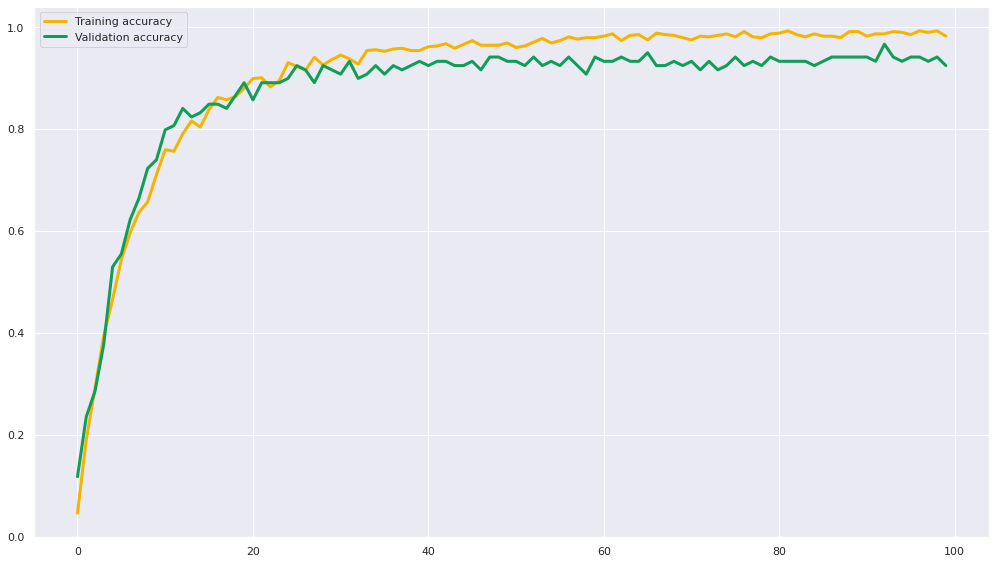

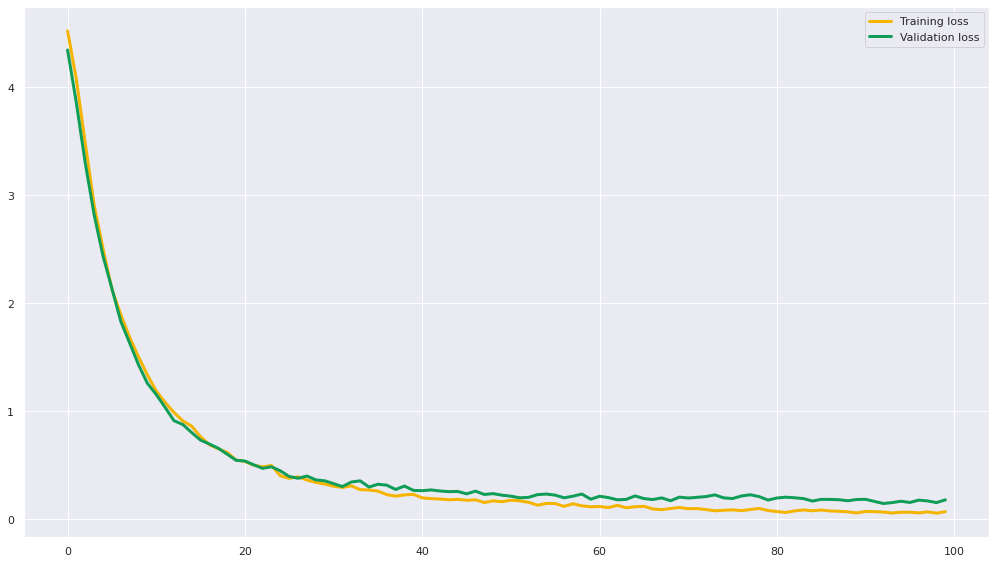

45
                                                                                                                            
The batch_size is: 32, The hidden_size is: 256, The dropout_rate is: 0.2, The optimizer_name is : SGD
Epoch 1/100
22/22 [==============================] - 3s 30ms/step - loss: 4.6024 - accuracy: 0.0059 - val_loss: 4.6121 - val_accuracy: 0.0000e+00
Epoch 2/100
22/22 [==============================] - 0s 10ms/step - loss: 4.5798 - accuracy: 0.0134 - val_loss: 4.6327 - val_accuracy: 0.0000e+00
Epoch 3/100
22/22 [==============================] - 0s 11ms/step - loss: 4.5572 - accuracy: 0.0119 - val_loss: 4.5872 - val_accuracy: 0.0168
Epoch 4/100
22/22 [==============================] - 0s 10ms/step - loss: 4.5154 - accuracy: 0.0089 - val_loss: 4.5717 - val_accuracy: 0.0168
Epoch 5/100
22/22 [==============================] - 0s 11ms/step - loss: 4.4652 - accuracy: 0.0193 - val_loss: 4.5266 - val_accuracy: 0.0084
Epoch 6/100
22/22 [==============================] -

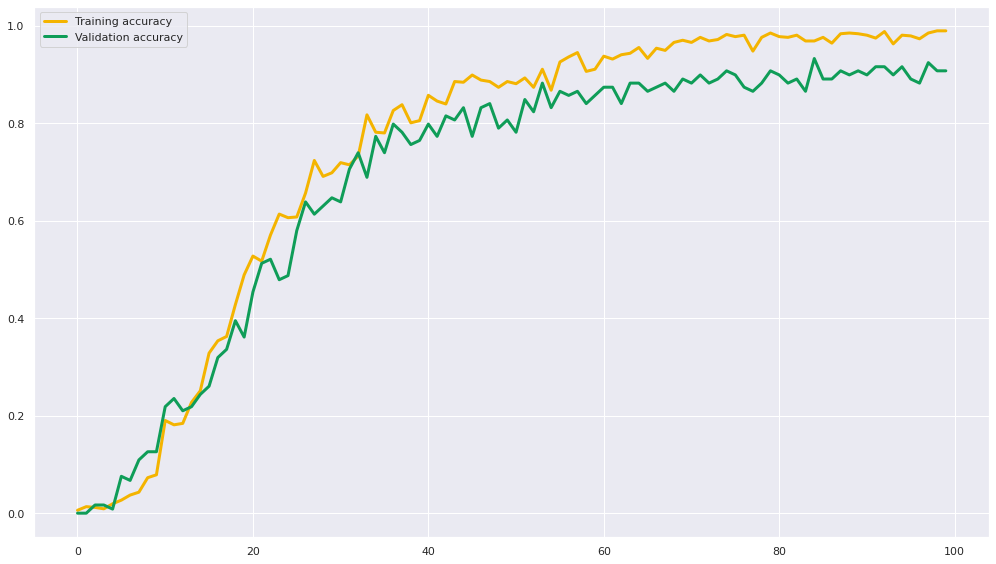

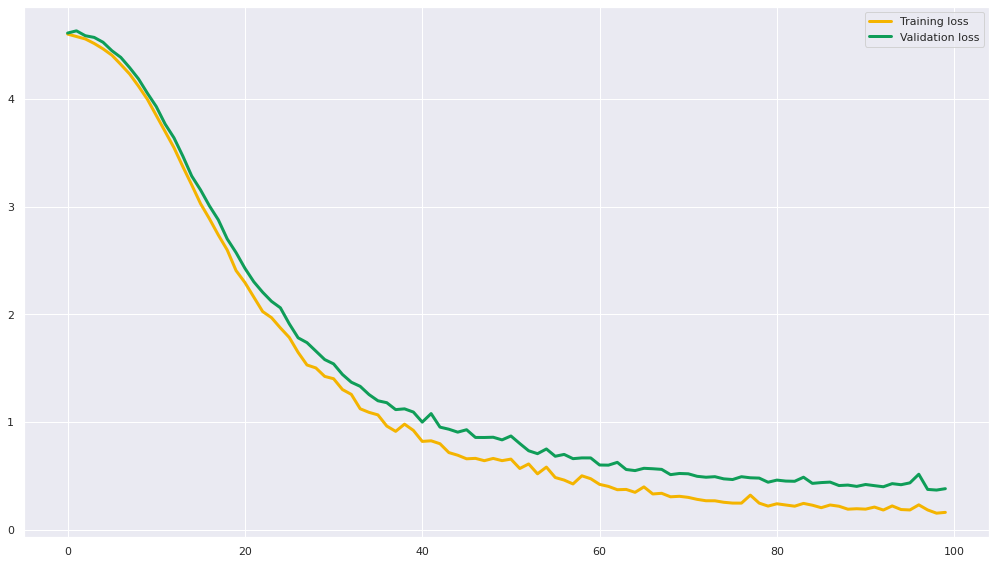

46
                                                                                                                            
The batch_size is: 32, The hidden_size is: 256, The dropout_rate is: 0.2, The optimizer_name is : Adam
Epoch 1/100
22/22 [==============================] - 2s 29ms/step - loss: 4.5794 - accuracy: 0.0461 - val_loss: 4.5488 - val_accuracy: 0.1681
Epoch 2/100
22/22 [==============================] - 0s 11ms/step - loss: 4.5080 - accuracy: 0.2318 - val_loss: 4.4981 - val_accuracy: 0.2101
Epoch 3/100
22/22 [==============================] - 0s 11ms/step - loss: 4.4333 - accuracy: 0.2927 - val_loss: 4.4337 - val_accuracy: 0.2101
Epoch 4/100
22/22 [==============================] - 0s 12ms/step - loss: 4.3408 - accuracy: 0.3120 - val_loss: 4.3470 - val_accuracy: 0.2185
Epoch 5/100
22/22 [==============================] - 0s 12ms/step - loss: 4.2247 - accuracy: 0.3507 - val_loss: 4.2347 - val_accuracy: 0.2857
Epoch 6/100
22/22 [==============================] - 0s 14m

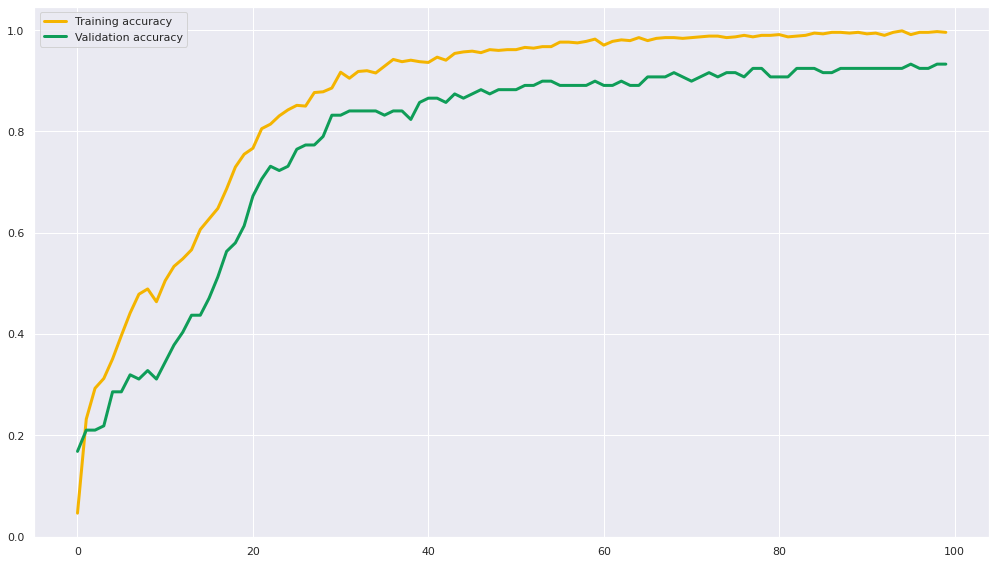

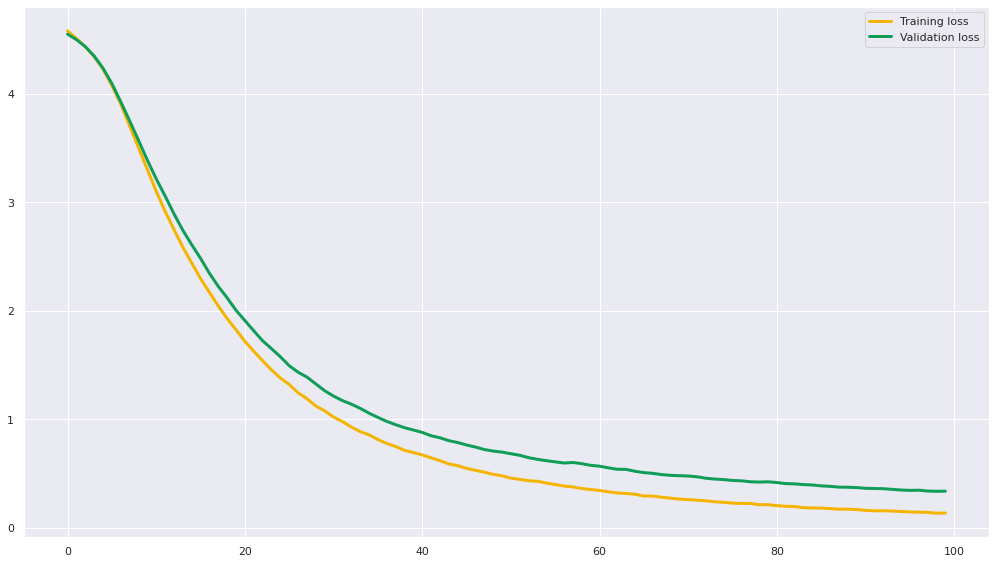

47
                                                                                                                            
The batch_size is: 32, The hidden_size is: 256, The dropout_rate is: 0.2, The optimizer_name is : RMSprop
Epoch 1/100
22/22 [==============================] - 1s 21ms/step - loss: 4.3136 - accuracy: 0.0906 - val_loss: 3.7412 - val_accuracy: 0.2101
Epoch 2/100
22/22 [==============================] - 0s 7ms/step - loss: 3.1600 - accuracy: 0.3239 - val_loss: 2.8736 - val_accuracy: 0.3025
Epoch 3/100
22/22 [==============================] - 0s 8ms/step - loss: 2.2118 - accuracy: 0.5319 - val_loss: 1.9731 - val_accuracy: 0.5210
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 1.5653 - accuracy: 0.6820 - val_loss: 1.4664 - val_accuracy: 0.6050
Epoch 5/100
22/22 [==============================] - 0s 8ms/step - loss: 1.1027 - accuracy: 0.7831 - val_loss: 1.1590 - val_accuracy: 0.6891
Epoch 6/100
22/22 [==============================] - 0s 6ms/

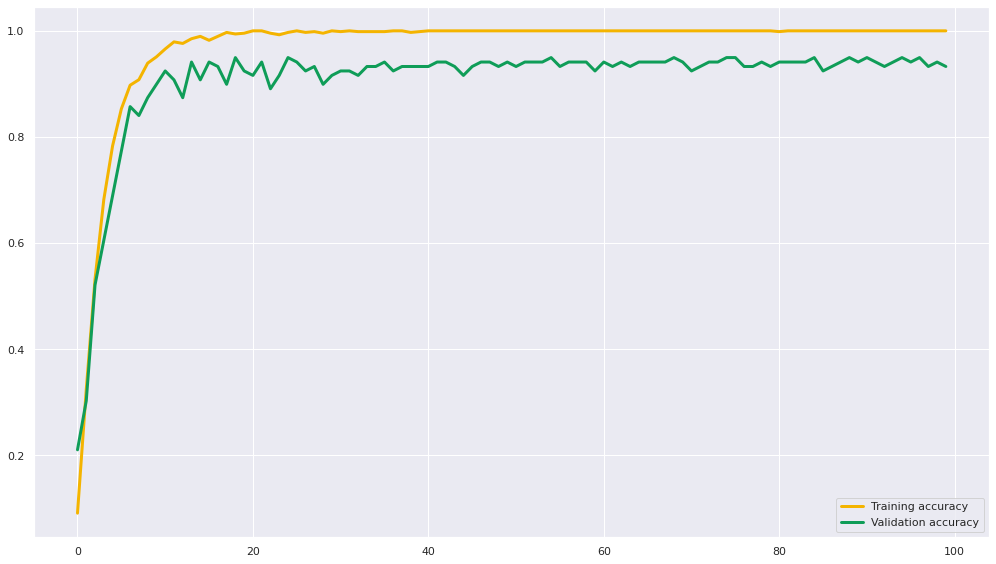

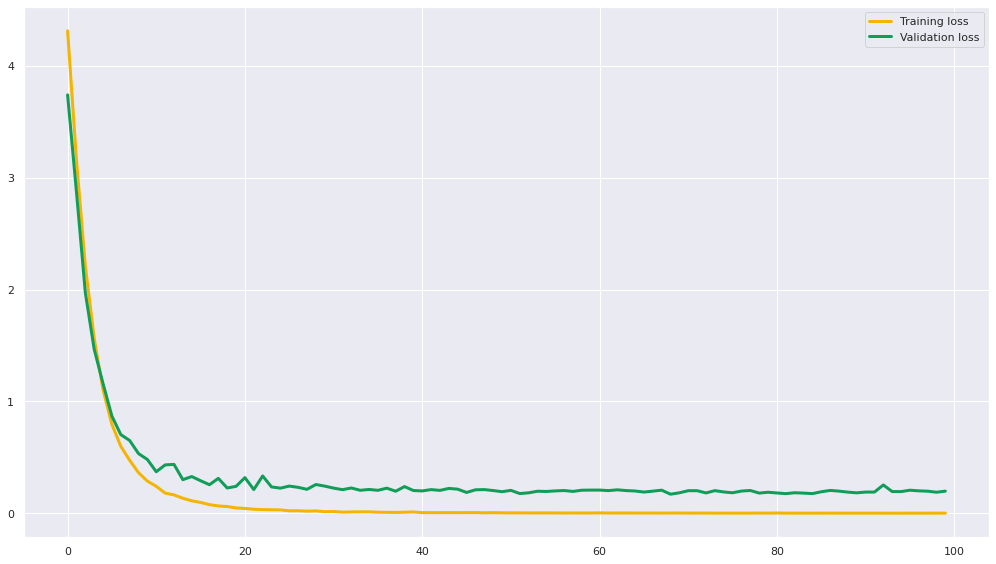

48
                                                                                                                            
The batch_size is: 32, The hidden_size is: 256, The dropout_rate is: 0.4, The optimizer_name is : SGD
Epoch 1/100
22/22 [==============================] - 1s 21ms/step - loss: 4.6027 - accuracy: 0.0119 - val_loss: 4.6158 - val_accuracy: 0.0084
Epoch 2/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5843 - accuracy: 0.0104 - val_loss: 4.6185 - val_accuracy: 0.0084
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5500 - accuracy: 0.0104 - val_loss: 4.5961 - val_accuracy: 0.0252
Epoch 4/100
22/22 [==============================] - 0s 6ms/step - loss: 4.5269 - accuracy: 0.0163 - val_loss: 4.5507 - val_accuracy: 0.0336
Epoch 5/100
22/22 [==============================] - 0s 7ms/step - loss: 4.4651 - accuracy: 0.0297 - val_loss: 4.4956 - val_accuracy: 0.1092
Epoch 6/100
22/22 [==============================] - 0s 8ms/step

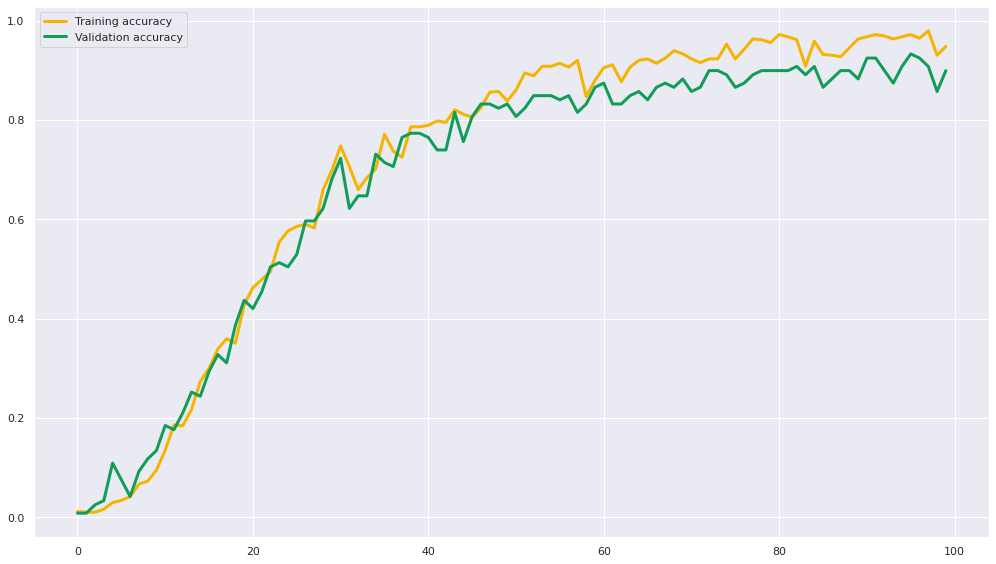

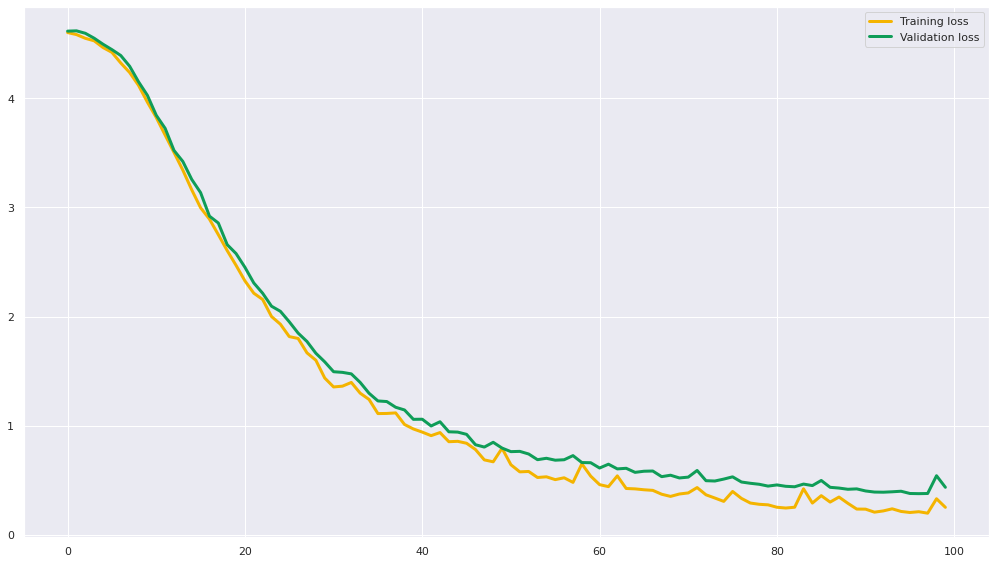

49
                                                                                                                            
The batch_size is: 32, The hidden_size is: 256, The dropout_rate is: 0.4, The optimizer_name is : Adam
Epoch 1/100
22/22 [==============================] - 2s 25ms/step - loss: 4.5797 - accuracy: 0.0327 - val_loss: 4.5577 - val_accuracy: 0.0672
Epoch 2/100
22/22 [==============================] - 0s 10ms/step - loss: 4.5205 - accuracy: 0.1397 - val_loss: 4.5141 - val_accuracy: 0.1681
Epoch 3/100
22/22 [==============================] - 0s 10ms/step - loss: 4.4585 - accuracy: 0.2348 - val_loss: 4.4618 - val_accuracy: 0.1681
Epoch 4/100
22/22 [==============================] - 0s 11ms/step - loss: 4.3819 - accuracy: 0.2704 - val_loss: 4.3991 - val_accuracy: 0.1597
Epoch 5/100
22/22 [==============================] - 0s 11ms/step - loss: 4.2903 - accuracy: 0.3031 - val_loss: 4.3137 - val_accuracy: 0.2185
Epoch 6/100
22/22 [==============================] - 0s 11m

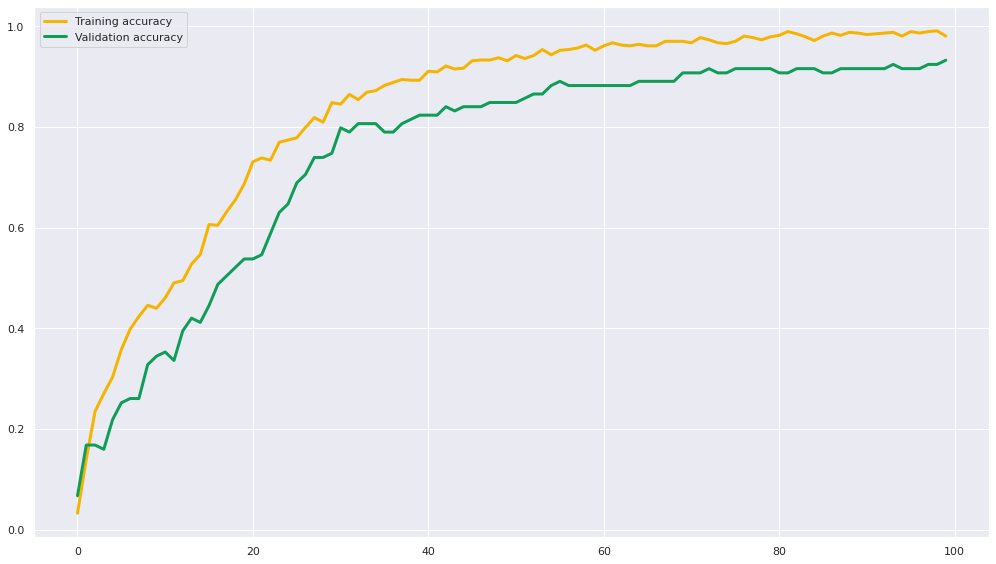

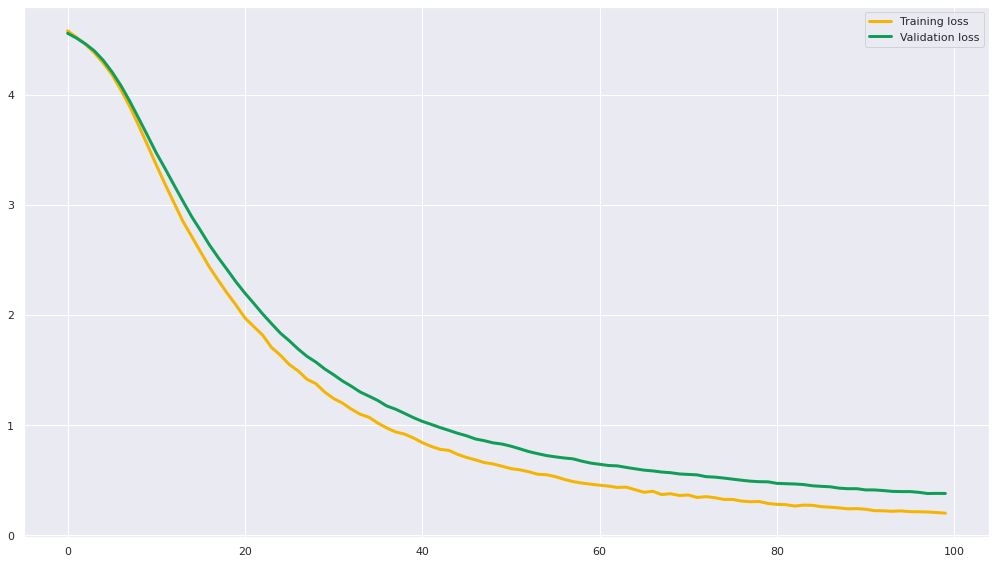

50
                                                                                                                            
The batch_size is: 32, The hidden_size is: 256, The dropout_rate is: 0.4, The optimizer_name is : RMSprop
Epoch 1/100
22/22 [==============================] - 2s 28ms/step - loss: 4.3949 - accuracy: 0.0966 - val_loss: 3.9808 - val_accuracy: 0.0924
Epoch 2/100
22/22 [==============================] - 0s 8ms/step - loss: 3.4307 - accuracy: 0.2749 - val_loss: 3.0641 - val_accuracy: 0.2605
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 2.5261 - accuracy: 0.4487 - val_loss: 2.2550 - val_accuracy: 0.5210
Epoch 4/100
22/22 [==============================] - 0s 8ms/step - loss: 1.8674 - accuracy: 0.6285 - val_loss: 1.7814 - val_accuracy: 0.5882
Epoch 5/100
22/22 [==============================] - 0s 10ms/step - loss: 1.4039 - accuracy: 0.7028 - val_loss: 1.4062 - val_accuracy: 0.7479
Epoch 6/100
22/22 [==============================] - 0s 10m

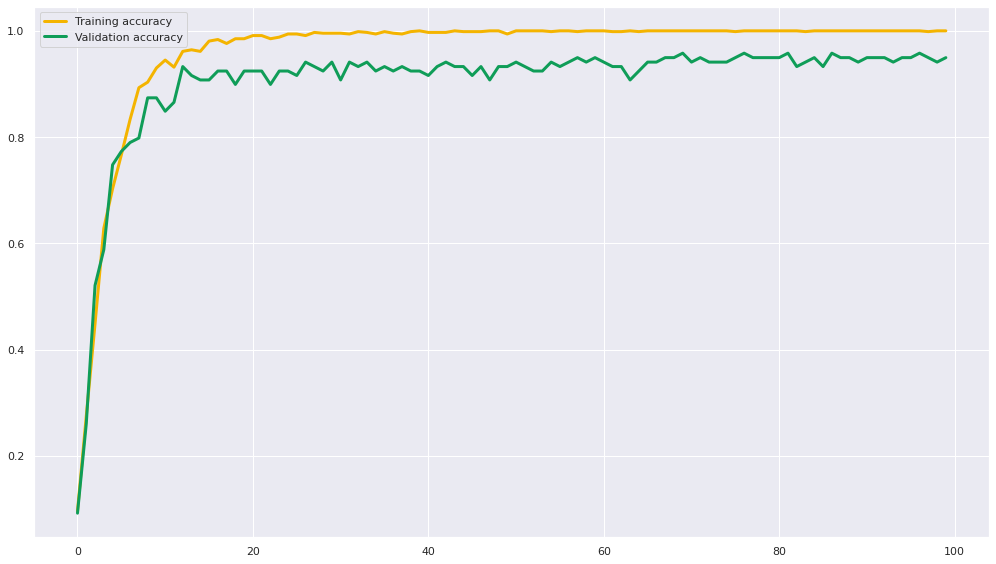

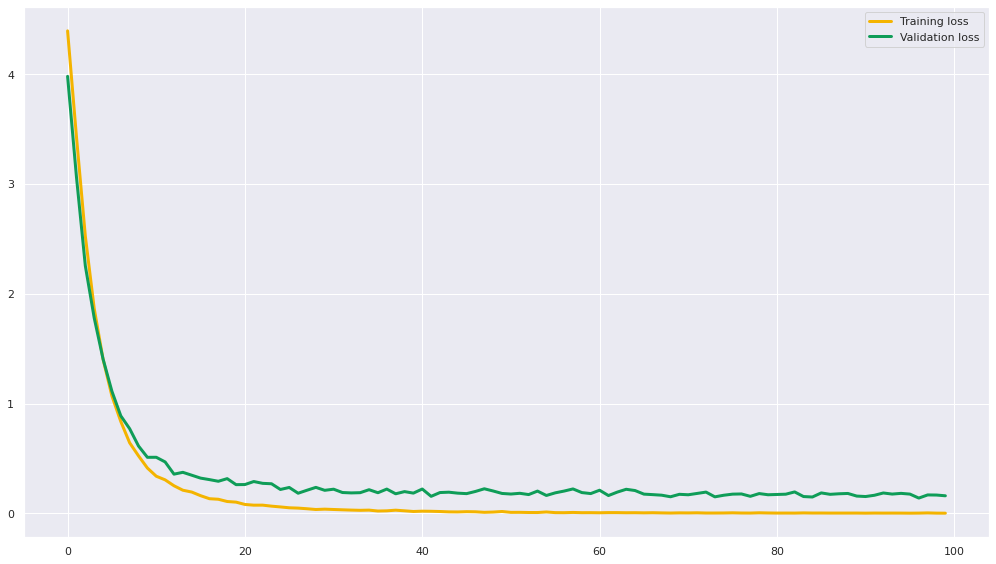

51
                                                                                                                            
The batch_size is: 32, The hidden_size is: 256, The dropout_rate is: 0.6, The optimizer_name is : SGD
Epoch 1/100
22/22 [==============================] - 1s 23ms/step - loss: 4.6050 - accuracy: 0.0045 - val_loss: 4.6138 - val_accuracy: 0.0000e+00
Epoch 2/100
22/22 [==============================] - 0s 9ms/step - loss: 4.6075 - accuracy: 0.0149 - val_loss: 4.6252 - val_accuracy: 0.0252
Epoch 3/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5933 - accuracy: 0.0104 - val_loss: 4.6270 - val_accuracy: 0.0000e+00
Epoch 4/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5726 - accuracy: 0.0223 - val_loss: 4.5906 - val_accuracy: 0.0252
Epoch 5/100
22/22 [==============================] - 0s 9ms/step - loss: 4.5099 - accuracy: 0.0267 - val_loss: 4.5392 - val_accuracy: 0.0420
Epoch 6/100
22/22 [==============================] - 0s 

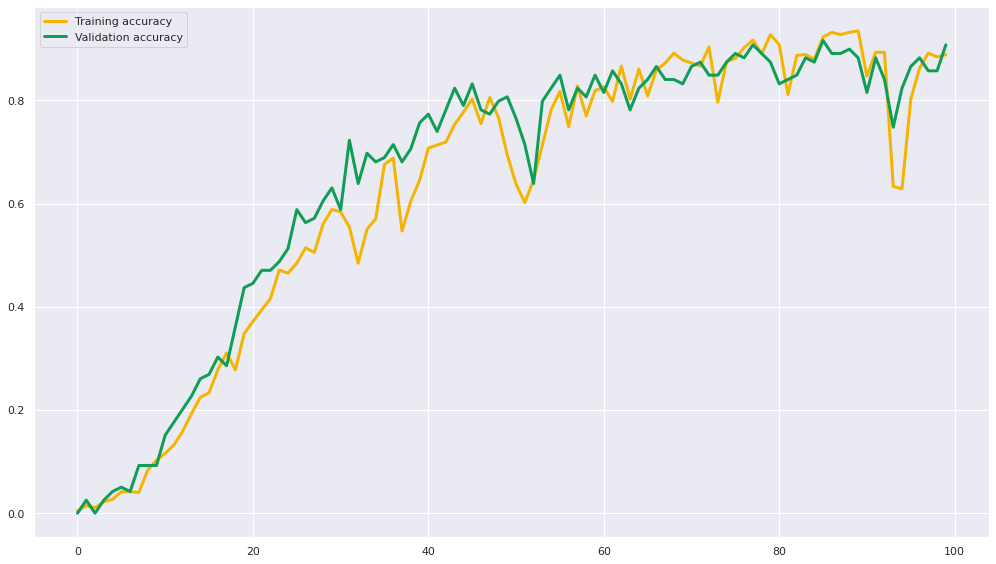

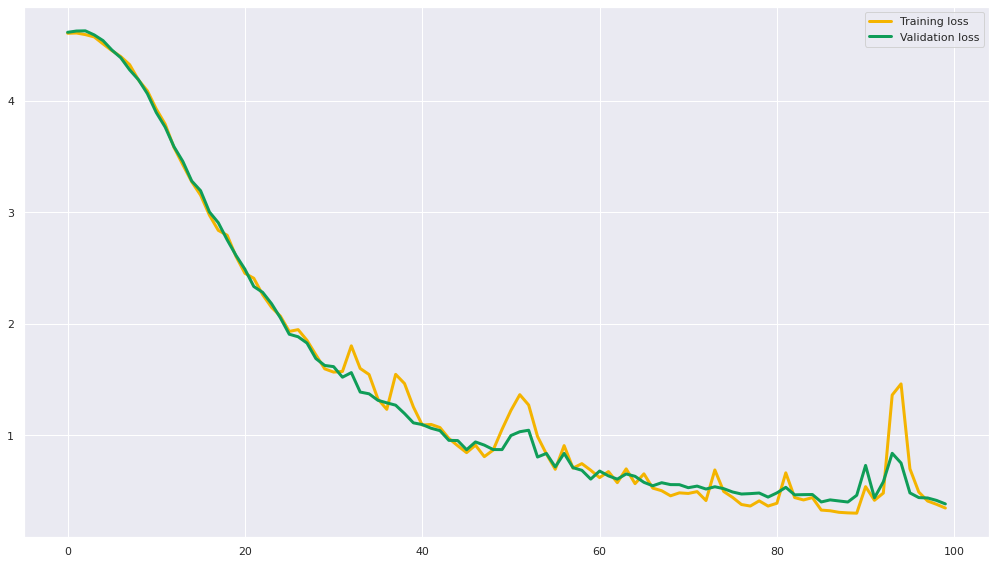

52
                                                                                                                            
The batch_size is: 32, The hidden_size is: 256, The dropout_rate is: 0.6, The optimizer_name is : Adam
Epoch 1/100
22/22 [==============================] - 1s 20ms/step - loss: 4.5842 - accuracy: 0.0238 - val_loss: 4.5655 - val_accuracy: 0.0420
Epoch 2/100
22/22 [==============================] - 0s 7ms/step - loss: 4.5327 - accuracy: 0.0921 - val_loss: 4.5263 - val_accuracy: 0.1176
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 4.4845 - accuracy: 0.1605 - val_loss: 4.4865 - val_accuracy: 0.1849
Epoch 4/100
22/22 [==============================] - 0s 6ms/step - loss: 4.4186 - accuracy: 0.2273 - val_loss: 4.4325 - val_accuracy: 0.2437
Epoch 5/100
22/22 [==============================] - 0s 8ms/step - loss: 4.3568 - accuracy: 0.2600 - val_loss: 4.3698 - val_accuracy: 0.2689
Epoch 6/100
22/22 [==============================] - 0s 10ms/st

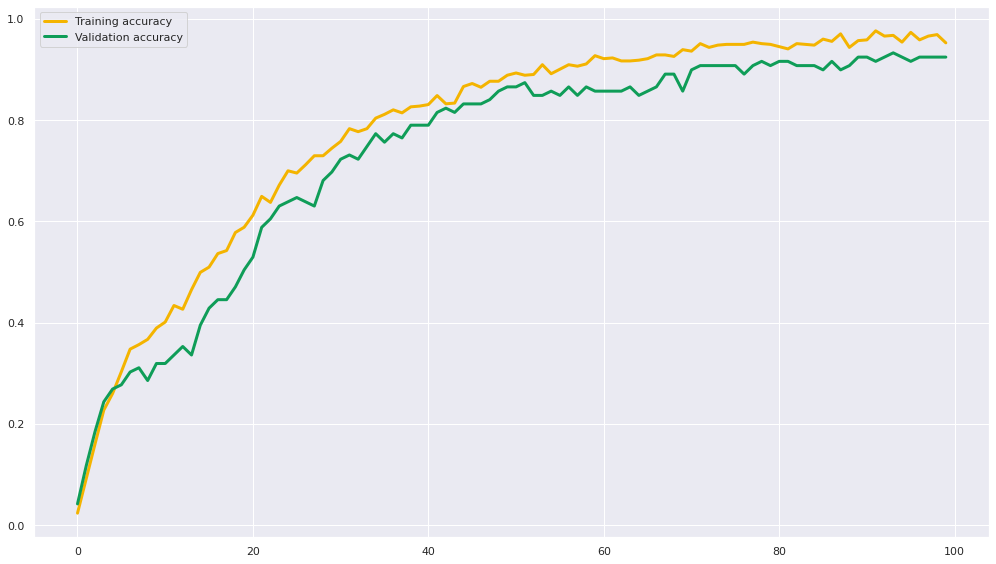

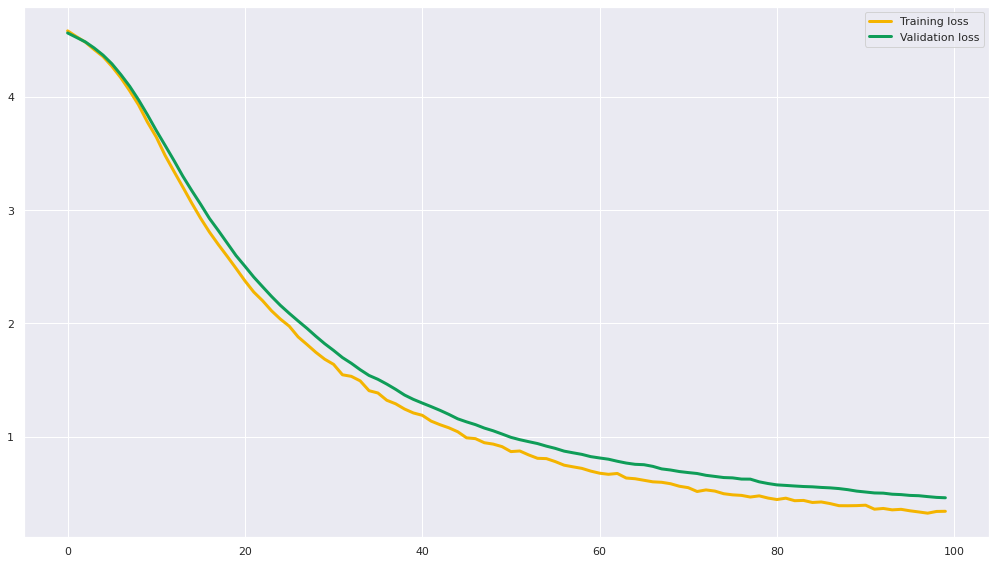

53
                                                                                                                            
The batch_size is: 32, The hidden_size is: 256, The dropout_rate is: 0.6, The optimizer_name is : RMSprop
Epoch 1/100
22/22 [==============================] - 2s 26ms/step - loss: 4.4630 - accuracy: 0.0535 - val_loss: 4.1258 - val_accuracy: 0.2269
Epoch 2/100
22/22 [==============================] - 0s 8ms/step - loss: 3.7414 - accuracy: 0.2244 - val_loss: 3.4367 - val_accuracy: 0.3025
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 2.9737 - accuracy: 0.3492 - val_loss: 2.7436 - val_accuracy: 0.4454
Epoch 4/100
22/22 [==============================] - 0s 8ms/step - loss: 2.3447 - accuracy: 0.4993 - val_loss: 2.2260 - val_accuracy: 0.5294
Epoch 5/100
22/22 [==============================] - 0s 10ms/step - loss: 1.9376 - accuracy: 0.5840 - val_loss: 1.8656 - val_accuracy: 0.5546
Epoch 6/100
22/22 [==============================] - 0s 12m

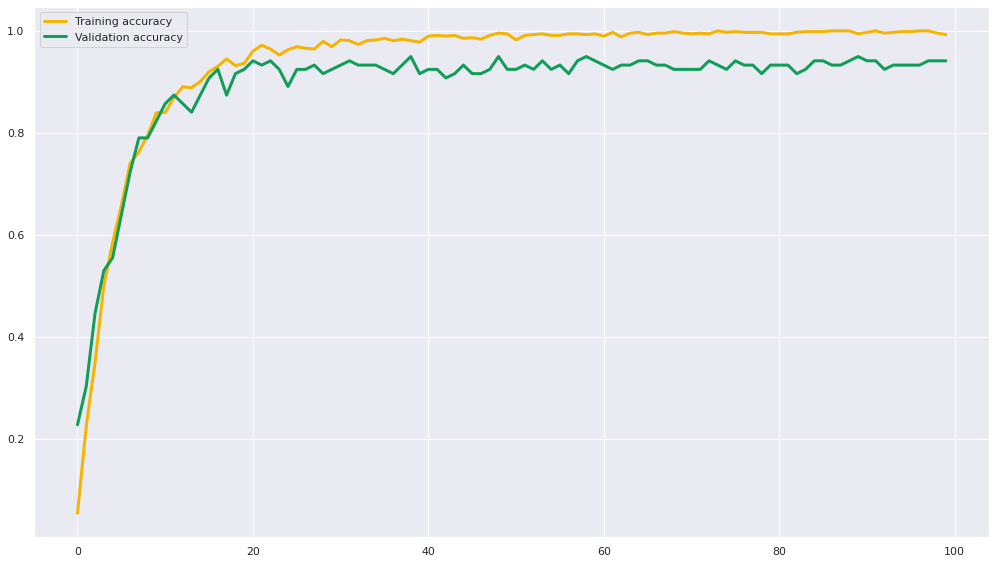

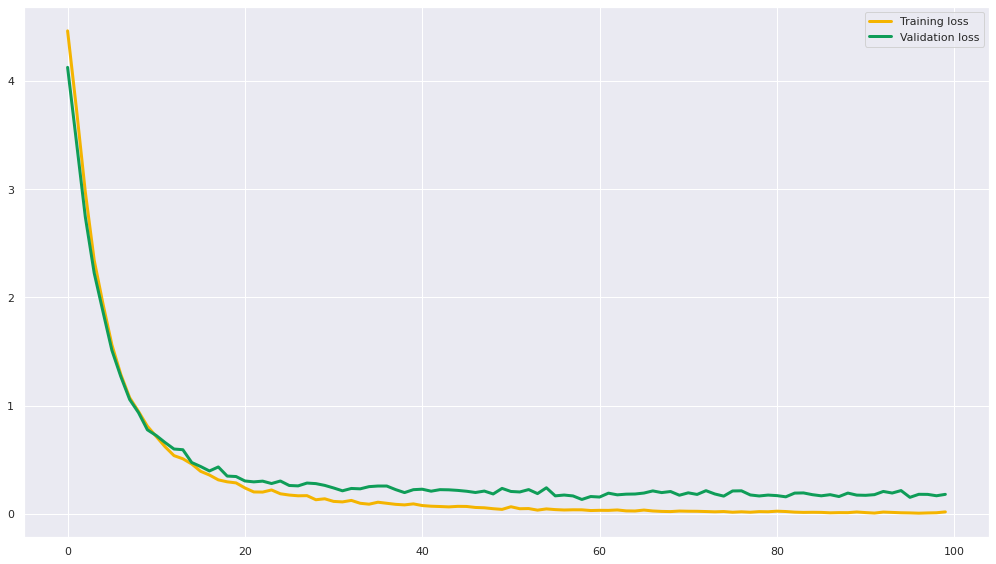

54
                                                                                                                            
The batch_size is: 64, The hidden_size is: 64, The dropout_rate is: 0.2, The optimizer_name is : SGD
Epoch 1/100
11/11 [==============================] - 1s 50ms/step - loss: 4.5986 - accuracy: 0.0059 - val_loss: 4.6023 - val_accuracy: 0.0000e+00
Epoch 2/100
11/11 [==============================] - 0s 15ms/step - loss: 4.5878 - accuracy: 0.0134 - val_loss: 4.6071 - val_accuracy: 0.0084
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5762 - accuracy: 0.0193 - val_loss: 4.6179 - val_accuracy: 0.0084
Epoch 4/100
11/11 [==============================] - 0s 10ms/step - loss: 4.5643 - accuracy: 0.0282 - val_loss: 4.6286 - val_accuracy: 0.0000e+00
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5548 - accuracy: 0.0342 - val_loss: 4.6258 - val_accuracy: 0.0000e+00
Epoch 6/100
11/11 [==============================

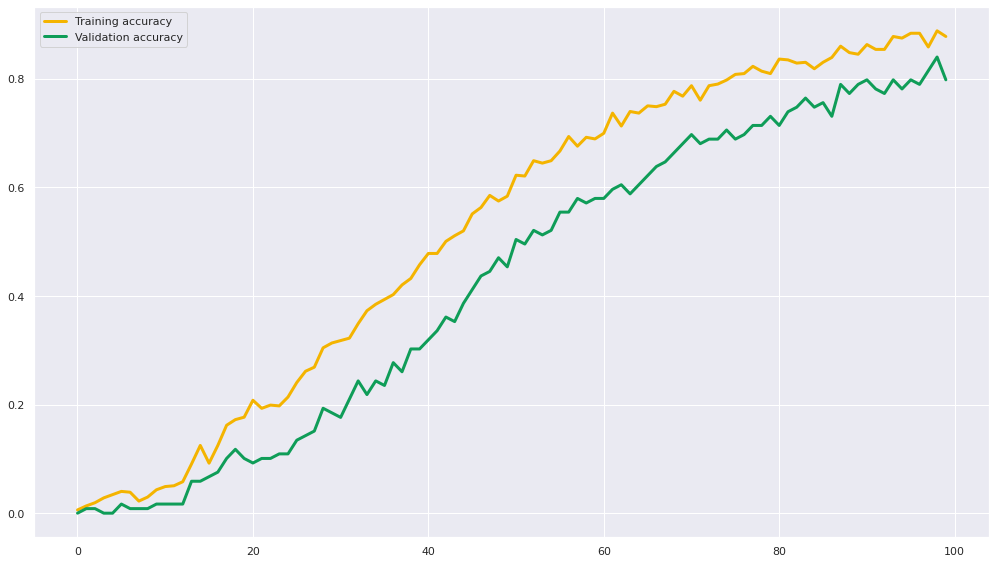

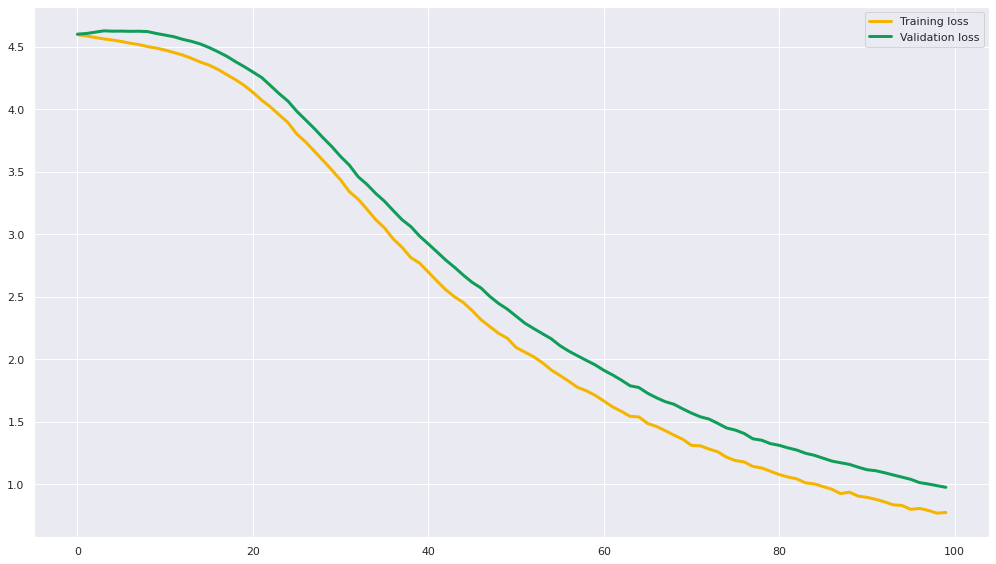

55
                                                                                                                            
The batch_size is: 64, The hidden_size is: 64, The dropout_rate is: 0.2, The optimizer_name is : Adam
Epoch 1/100
11/11 [==============================] - 1s 44ms/step - loss: 4.5925 - accuracy: 0.0134 - val_loss: 4.5835 - val_accuracy: 0.0084
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5755 - accuracy: 0.0446 - val_loss: 4.5738 - val_accuracy: 0.0336
Epoch 3/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5599 - accuracy: 0.0698 - val_loss: 4.5631 - val_accuracy: 0.0672
Epoch 4/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5437 - accuracy: 0.1189 - val_loss: 4.5515 - val_accuracy: 0.1429
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5260 - accuracy: 0.1590 - val_loss: 4.5388 - val_accuracy: 0.1429
Epoch 6/100
11/11 [==============================] - 1s 141m

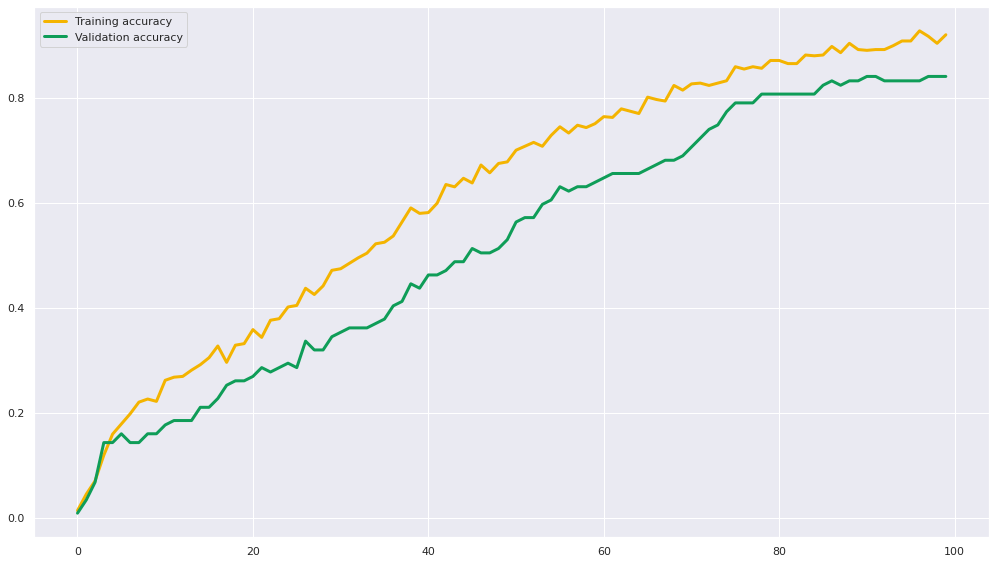

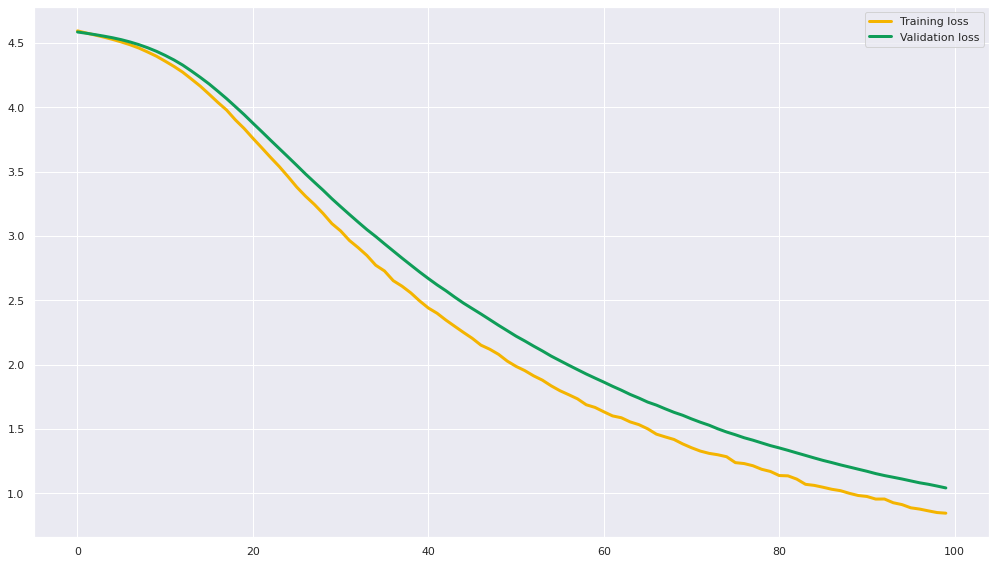

56
                                                                                                                            
The batch_size is: 64, The hidden_size is: 64, The dropout_rate is: 0.2, The optimizer_name is : RMSprop
Epoch 1/100
11/11 [==============================] - 2s 46ms/step - loss: 4.5386 - accuracy: 0.0609 - val_loss: 4.4068 - val_accuracy: 0.1345
Epoch 2/100
11/11 [==============================] - 0s 12ms/step - loss: 4.1978 - accuracy: 0.2125 - val_loss: 4.0047 - val_accuracy: 0.2101
Epoch 3/100
11/11 [==============================] - 0s 13ms/step - loss: 3.6770 - accuracy: 0.2838 - val_loss: 3.5205 - val_accuracy: 0.2857
Epoch 4/100
11/11 [==============================] - 0s 13ms/step - loss: 3.1879 - accuracy: 0.3774 - val_loss: 3.1053 - val_accuracy: 0.3529
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 2.7590 - accuracy: 0.4740 - val_loss: 2.7273 - val_accuracy: 0.4118
Epoch 6/100
11/11 [==============================] - 0s 1

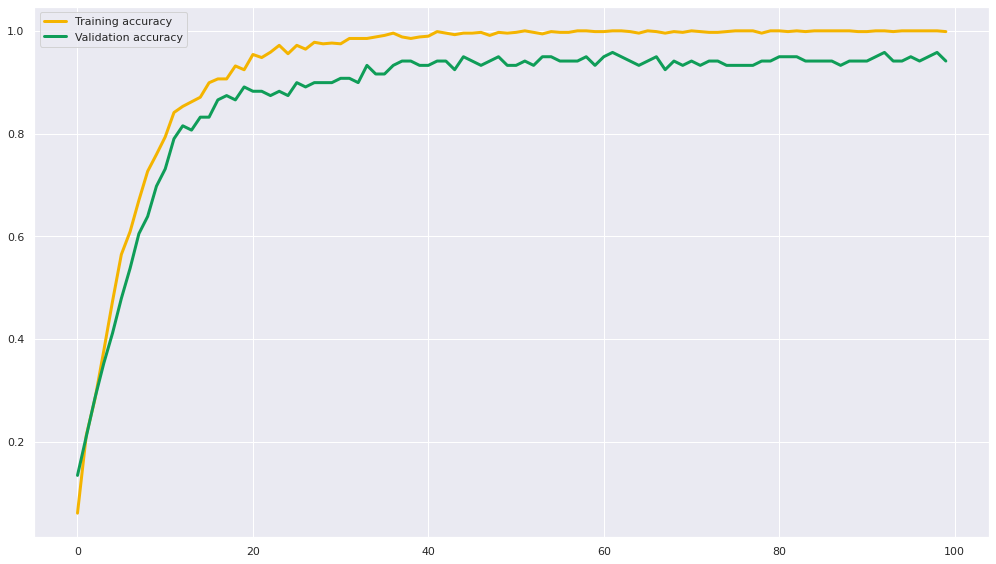

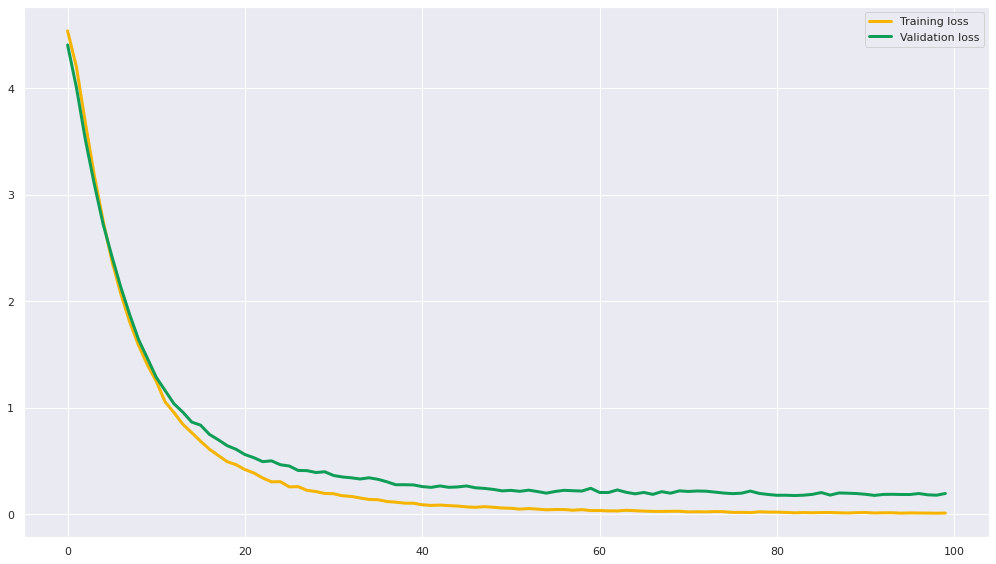

57
                                                                                                                            
The batch_size is: 64, The hidden_size is: 64, The dropout_rate is: 0.4, The optimizer_name is : SGD
Epoch 1/100
11/11 [==============================] - 1s 49ms/step - loss: 4.5968 - accuracy: 0.0163 - val_loss: 4.5984 - val_accuracy: 0.0084
Epoch 2/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5872 - accuracy: 0.0238 - val_loss: 4.6074 - val_accuracy: 0.0168
Epoch 3/100
11/11 [==============================] - 0s 15ms/step - loss: 4.5752 - accuracy: 0.0238 - val_loss: 4.6166 - val_accuracy: 0.0000e+00
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5647 - accuracy: 0.0297 - val_loss: 4.6209 - val_accuracy: 0.0000e+00
Epoch 5/100
11/11 [==============================] - 0s 15ms/step - loss: 4.5496 - accuracy: 0.0253 - val_loss: 4.6215 - val_accuracy: 0.0000e+00
Epoch 6/100
11/11 [==============================

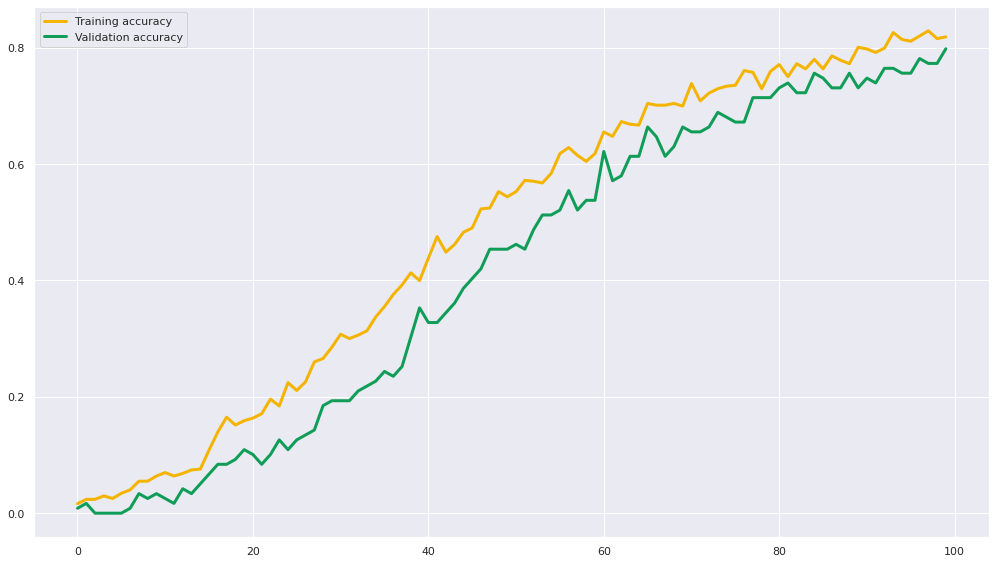

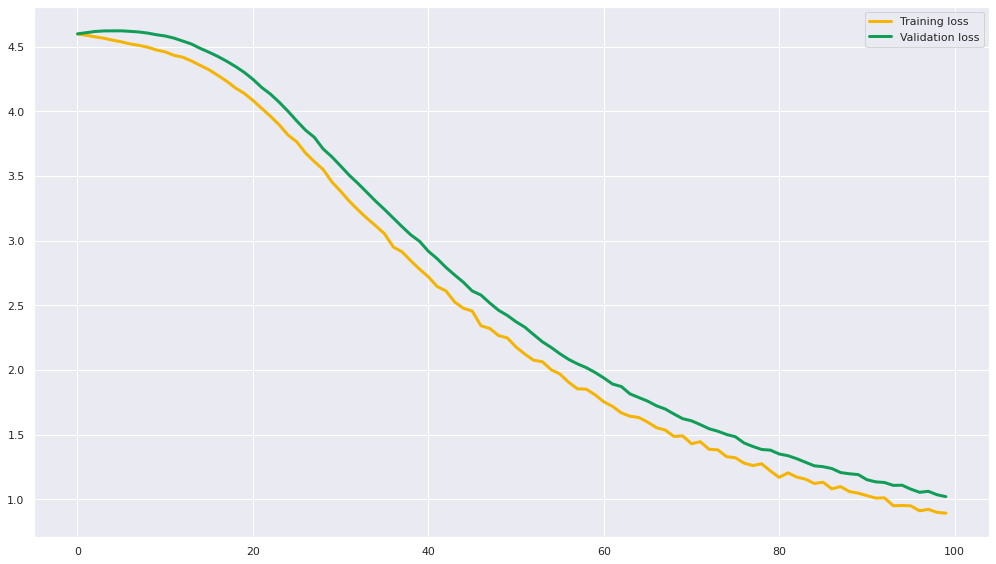

58
                                                                                                                            
The batch_size is: 64, The hidden_size is: 64, The dropout_rate is: 0.4, The optimizer_name is : Adam
Epoch 1/100
11/11 [==============================] - 2s 52ms/step - loss: 4.5936 - accuracy: 0.0045 - val_loss: 4.5903 - val_accuracy: 0.0000e+00
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5766 - accuracy: 0.0223 - val_loss: 4.5817 - val_accuracy: 0.0084
Epoch 3/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5662 - accuracy: 0.0342 - val_loss: 4.5719 - val_accuracy: 0.0504
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5509 - accuracy: 0.0817 - val_loss: 4.5614 - val_accuracy: 0.0588
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5353 - accuracy: 0.1471 - val_loss: 4.5499 - val_accuracy: 0.0756
Epoch 6/100
11/11 [==============================] - 0s 

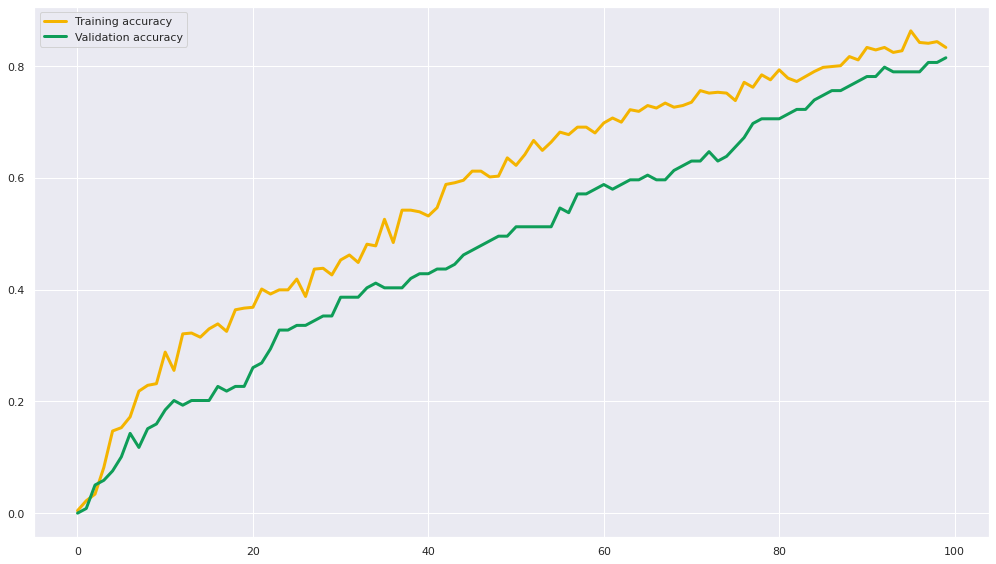

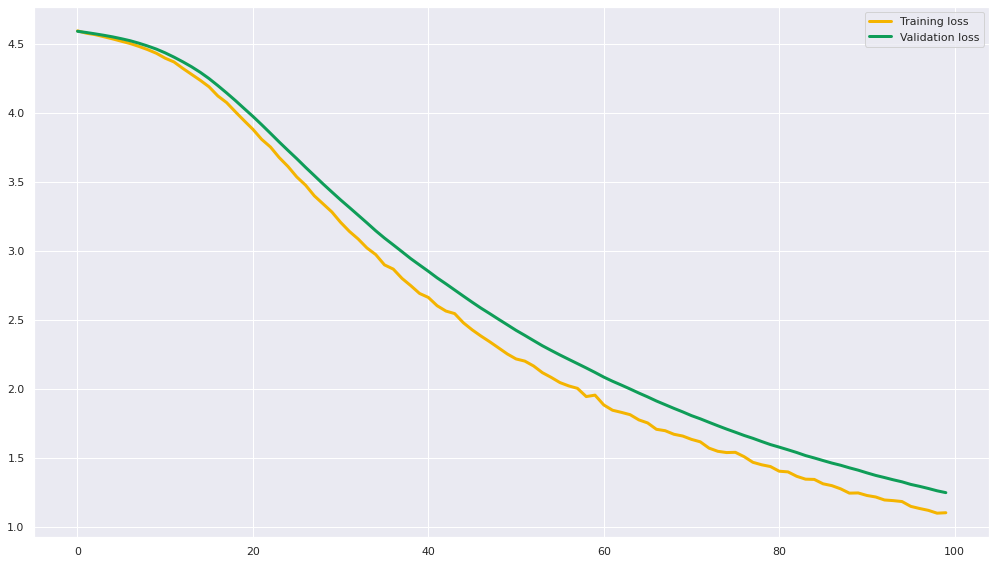

59
                                                                                                                            
The batch_size is: 64, The hidden_size is: 64, The dropout_rate is: 0.4, The optimizer_name is : RMSprop
Epoch 1/100
11/11 [==============================] - 1s 36ms/step - loss: 4.5579 - accuracy: 0.0416 - val_loss: 4.4468 - val_accuracy: 0.1681
Epoch 2/100
11/11 [==============================] - 0s 10ms/step - loss: 4.3013 - accuracy: 0.2006 - val_loss: 4.1459 - val_accuracy: 0.2521
Epoch 3/100
11/11 [==============================] - 0s 10ms/step - loss: 3.8843 - accuracy: 0.2585 - val_loss: 3.7377 - val_accuracy: 0.2689
Epoch 4/100
11/11 [==============================] - 0s 9ms/step - loss: 3.4370 - accuracy: 0.3299 - val_loss: 3.3556 - val_accuracy: 0.3613
Epoch 5/100
11/11 [==============================] - 0s 8ms/step - loss: 3.0440 - accuracy: 0.3893 - val_loss: 3.0176 - val_accuracy: 0.3361
Epoch 6/100
11/11 [==============================] - 0s 8ms

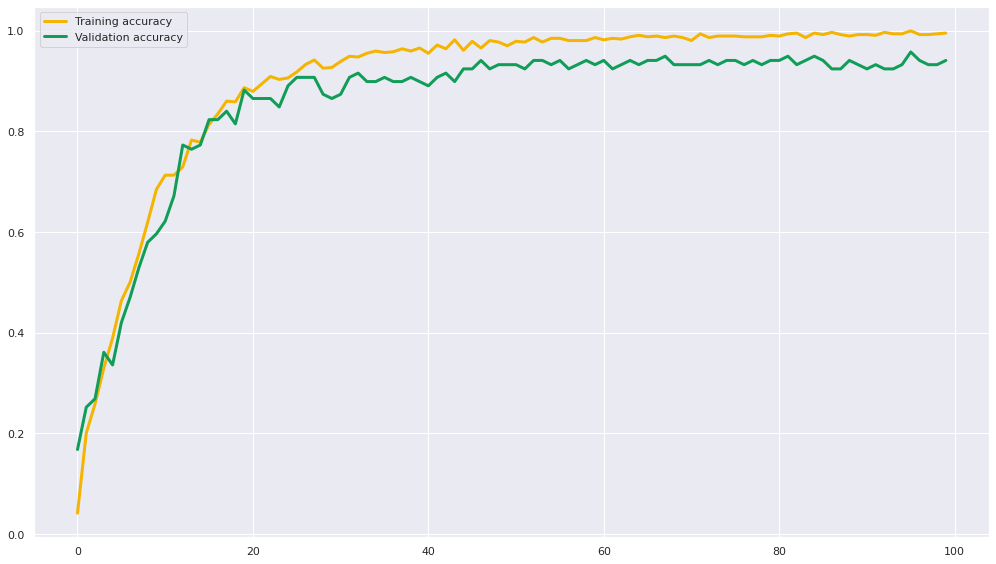

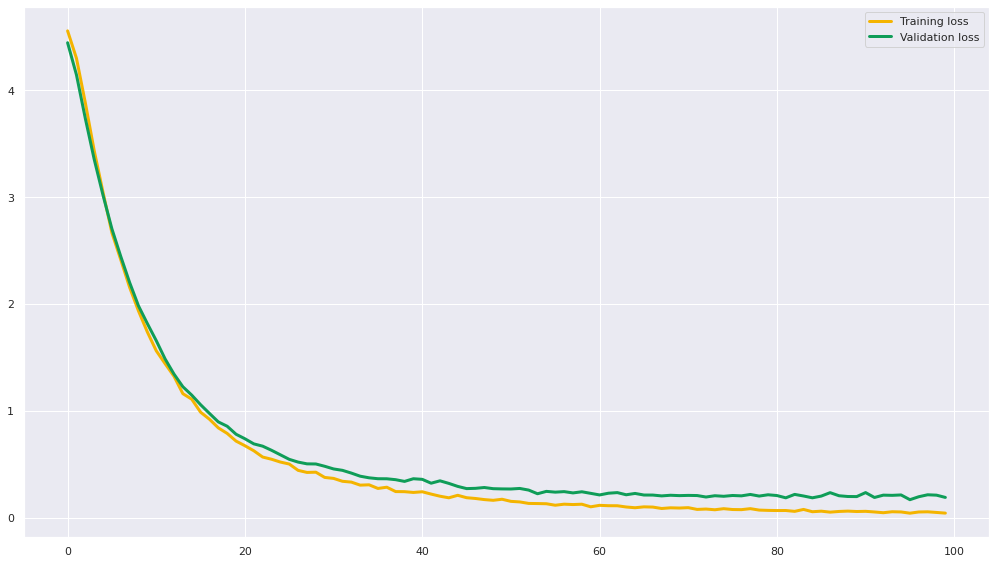

60
                                                                                                                            
The batch_size is: 64, The hidden_size is: 64, The dropout_rate is: 0.6, The optimizer_name is : SGD
Epoch 1/100
11/11 [==============================] - 1s 44ms/step - loss: 4.5982 - accuracy: 0.0059 - val_loss: 4.5962 - val_accuracy: 0.0168
Epoch 2/100
11/11 [==============================] - 0s 10ms/step - loss: 4.5898 - accuracy: 0.0134 - val_loss: 4.6053 - val_accuracy: 0.0252
Epoch 3/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5718 - accuracy: 0.0089 - val_loss: 4.6171 - val_accuracy: 0.0000e+00
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5728 - accuracy: 0.0178 - val_loss: 4.6197 - val_accuracy: 0.0000e+00
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5578 - accuracy: 0.0208 - val_loss: 4.6201 - val_accuracy: 0.0168
Epoch 6/100
11/11 [==============================] - 

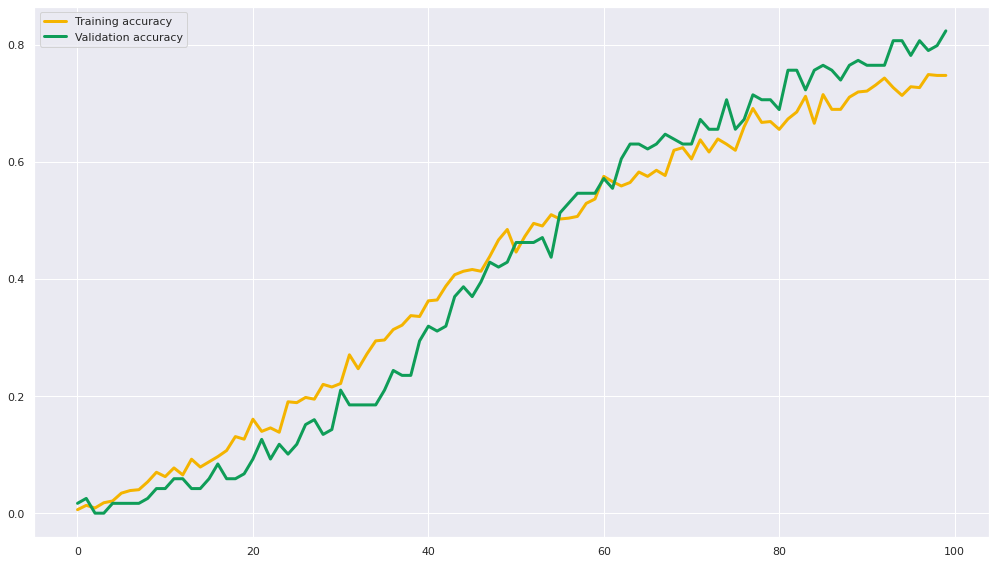

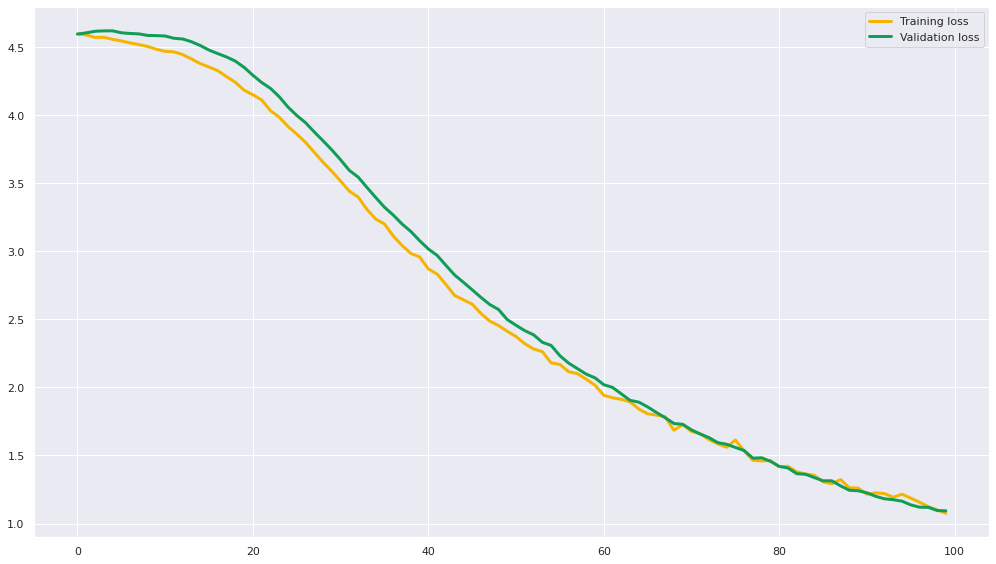

61
                                                                                                                            
The batch_size is: 64, The hidden_size is: 64, The dropout_rate is: 0.6, The optimizer_name is : Adam
Epoch 1/100
11/11 [==============================] - 2s 43ms/step - loss: 4.5911 - accuracy: 0.0223 - val_loss: 4.5850 - val_accuracy: 0.0168
Epoch 2/100
11/11 [==============================] - 0s 15ms/step - loss: 4.5769 - accuracy: 0.0357 - val_loss: 4.5755 - val_accuracy: 0.0420
Epoch 3/100
11/11 [==============================] - 0s 15ms/step - loss: 4.5654 - accuracy: 0.0401 - val_loss: 4.5664 - val_accuracy: 0.0924
Epoch 4/100
11/11 [==============================] - 0s 16ms/step - loss: 4.5525 - accuracy: 0.0862 - val_loss: 4.5573 - val_accuracy: 0.1345
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5413 - accuracy: 0.0936 - val_loss: 4.5475 - val_accuracy: 0.1261
Epoch 6/100
11/11 [==============================] - 0s 13ms

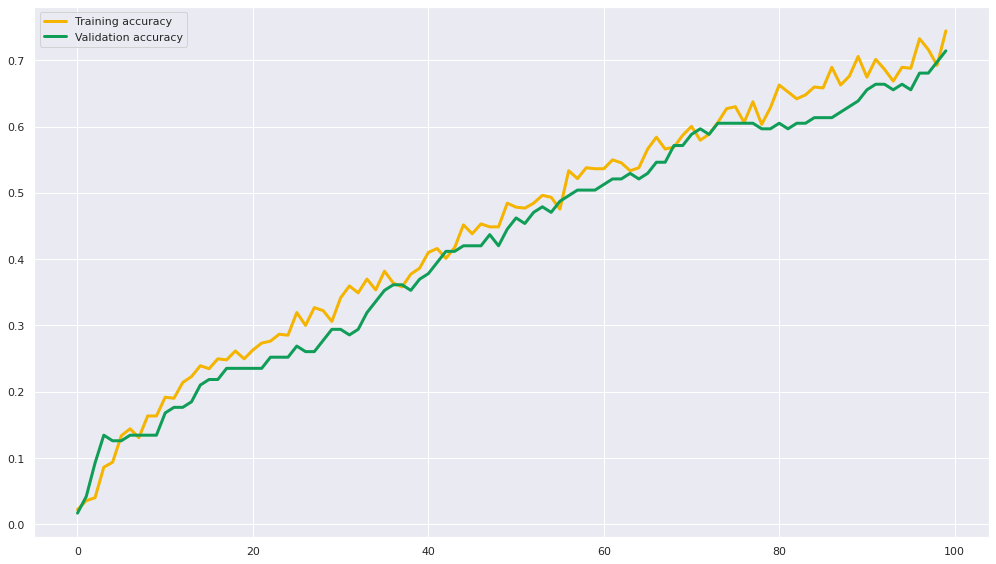

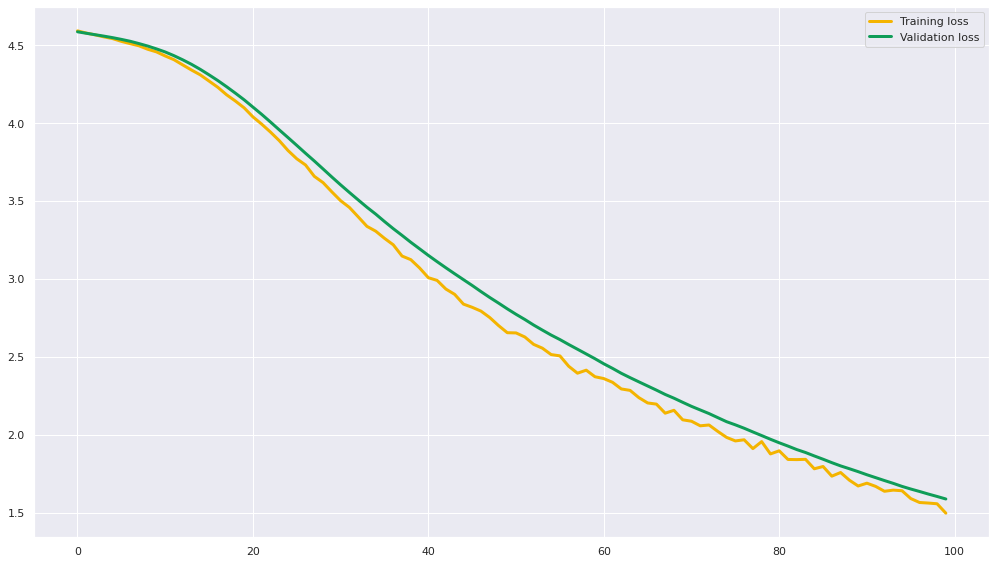

62
                                                                                                                            
The batch_size is: 64, The hidden_size is: 64, The dropout_rate is: 0.6, The optimizer_name is : RMSprop
Epoch 1/100
11/11 [==============================] - 1s 48ms/step - loss: 4.5638 - accuracy: 0.0267 - val_loss: 4.4921 - val_accuracy: 0.1681
Epoch 2/100
11/11 [==============================] - 0s 11ms/step - loss: 4.3618 - accuracy: 0.1308 - val_loss: 4.2722 - val_accuracy: 0.1513
Epoch 3/100
11/11 [==============================] - 0s 10ms/step - loss: 4.0596 - accuracy: 0.1768 - val_loss: 3.9770 - val_accuracy: 0.1597
Epoch 4/100
11/11 [==============================] - 0s 13ms/step - loss: 3.7151 - accuracy: 0.2214 - val_loss: 3.6593 - val_accuracy: 0.2353
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 3.3829 - accuracy: 0.2823 - val_loss: 3.3813 - val_accuracy: 0.2689
Epoch 6/100
11/11 [==============================] - 0s 1

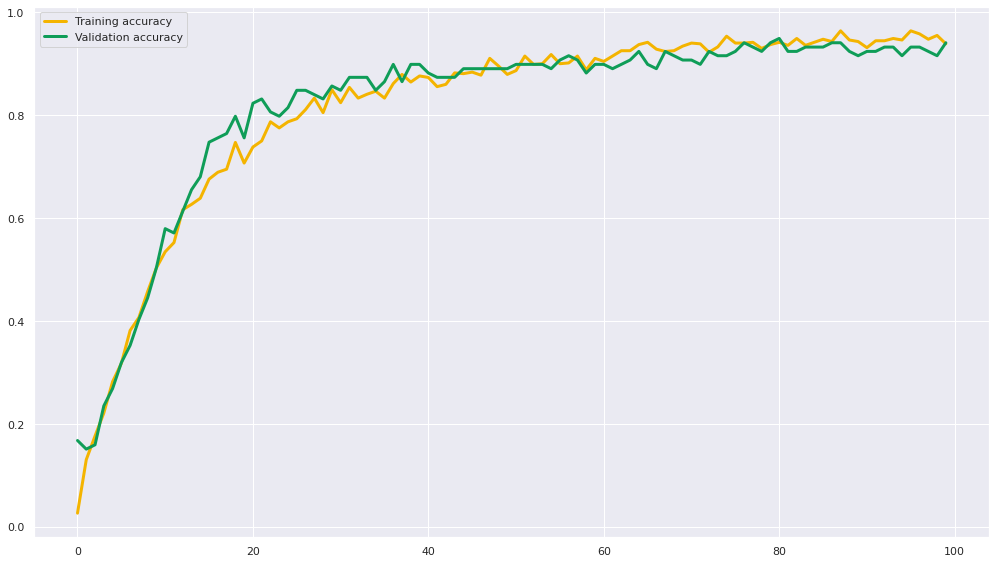

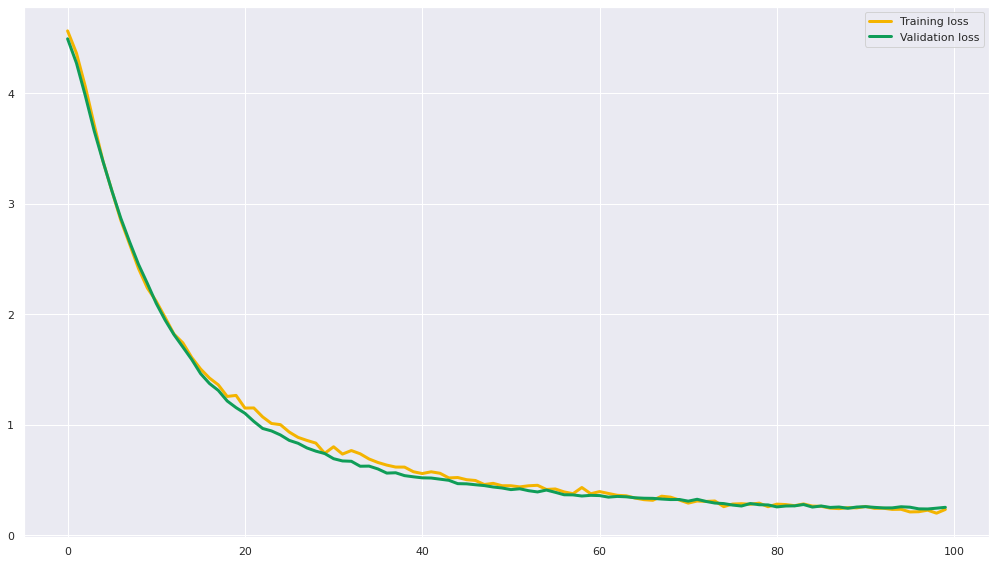

63
                                                                                                                            
The batch_size is: 64, The hidden_size is: 128, The dropout_rate is: 0.2, The optimizer_name is : SGD
Epoch 1/100
11/11 [==============================] - 1s 42ms/step - loss: 4.5989 - accuracy: 0.0015 - val_loss: 4.5993 - val_accuracy: 0.0084
Epoch 2/100
11/11 [==============================] - 0s 11ms/step - loss: 4.5842 - accuracy: 0.0178 - val_loss: 4.6085 - val_accuracy: 0.0000e+00
Epoch 3/100
11/11 [==============================] - 0s 11ms/step - loss: 4.5654 - accuracy: 0.0297 - val_loss: 4.6243 - val_accuracy: 0.0084
Epoch 4/100
11/11 [==============================] - 0s 9ms/step - loss: 4.5504 - accuracy: 0.0401 - val_loss: 4.6343 - val_accuracy: 0.0168
Epoch 5/100
11/11 [==============================] - 0s 11ms/step - loss: 4.5349 - accuracy: 0.0475 - val_loss: 4.6325 - val_accuracy: 0.0168
Epoch 6/100
11/11 [==============================] - 0s 1

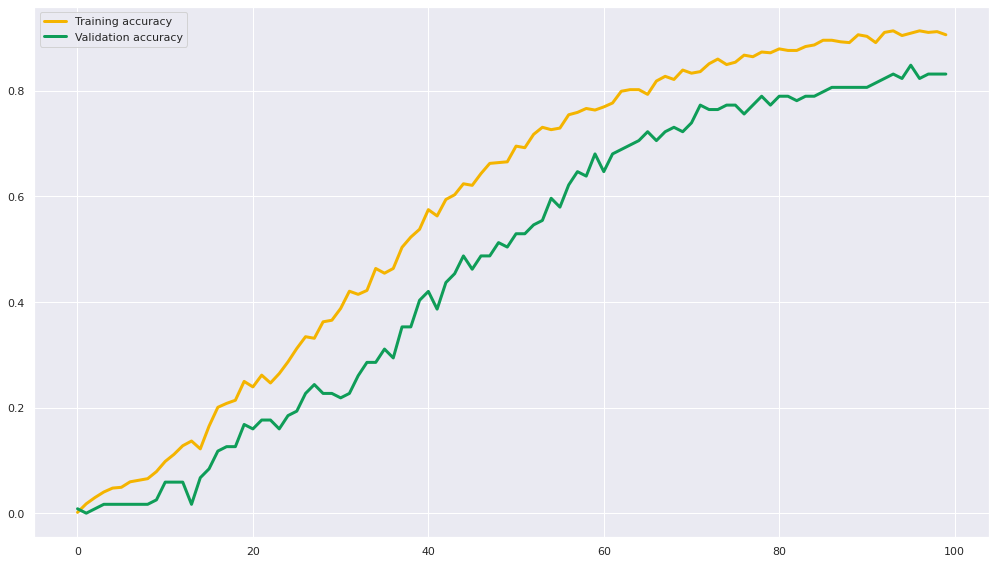

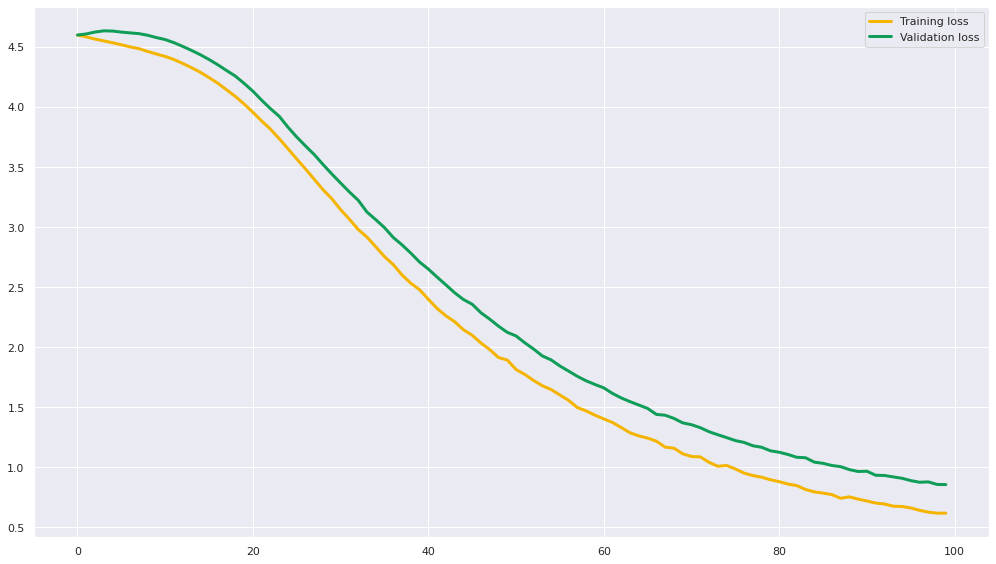

64
                                                                                                                            
The batch_size is: 64, The hidden_size is: 128, The dropout_rate is: 0.2, The optimizer_name is : Adam
Epoch 1/100
11/11 [==============================] - 1s 46ms/step - loss: 4.5899 - accuracy: 0.0178 - val_loss: 4.5816 - val_accuracy: 0.0336
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5608 - accuracy: 0.0951 - val_loss: 4.5609 - val_accuracy: 0.0588
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5330 - accuracy: 0.1605 - val_loss: 4.5396 - val_accuracy: 0.1008
Epoch 4/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5031 - accuracy: 0.2392 - val_loss: 4.5155 - val_accuracy: 0.1765
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 4.4709 - accuracy: 0.2808 - val_loss: 4.4881 - val_accuracy: 0.1933
Epoch 6/100
11/11 [==============================] - 0s 13m

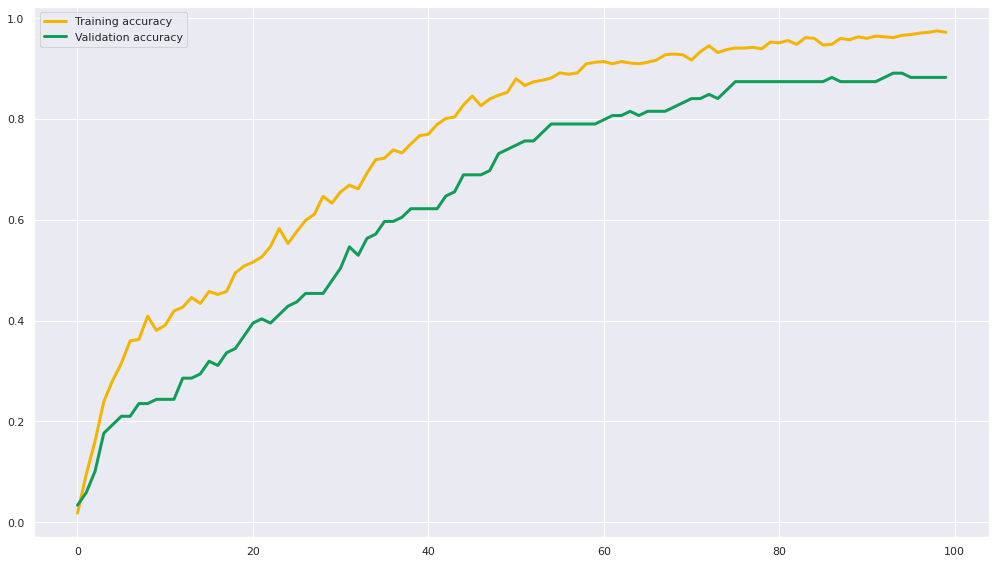

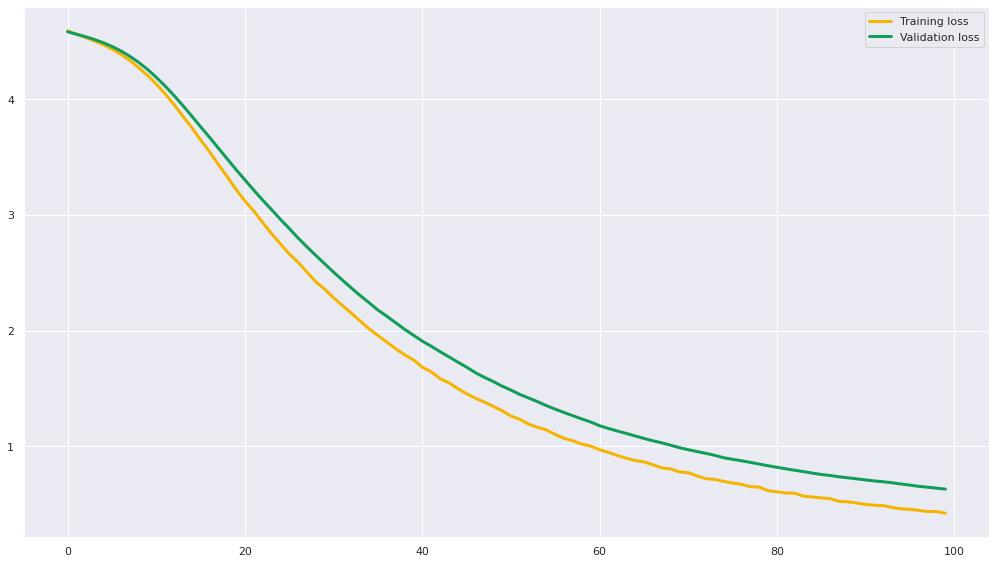

65
                                                                                                                            
The batch_size is: 64, The hidden_size is: 128, The dropout_rate is: 0.2, The optimizer_name is : RMSprop
Epoch 1/100
11/11 [==============================] - 1s 53ms/step - loss: 4.5026 - accuracy: 0.0892 - val_loss: 4.2869 - val_accuracy: 0.1513
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 3.9618 - accuracy: 0.2065 - val_loss: 3.6788 - val_accuracy: 0.2101
Epoch 3/100
11/11 [==============================] - 0s 13ms/step - loss: 3.2546 - accuracy: 0.3626 - val_loss: 3.0759 - val_accuracy: 0.3109
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 2.6493 - accuracy: 0.4666 - val_loss: 2.5953 - val_accuracy: 0.4118
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 2.1783 - accuracy: 0.5632 - val_loss: 2.1871 - val_accuracy: 0.5294
Epoch 6/100
11/11 [==============================] - 0s 

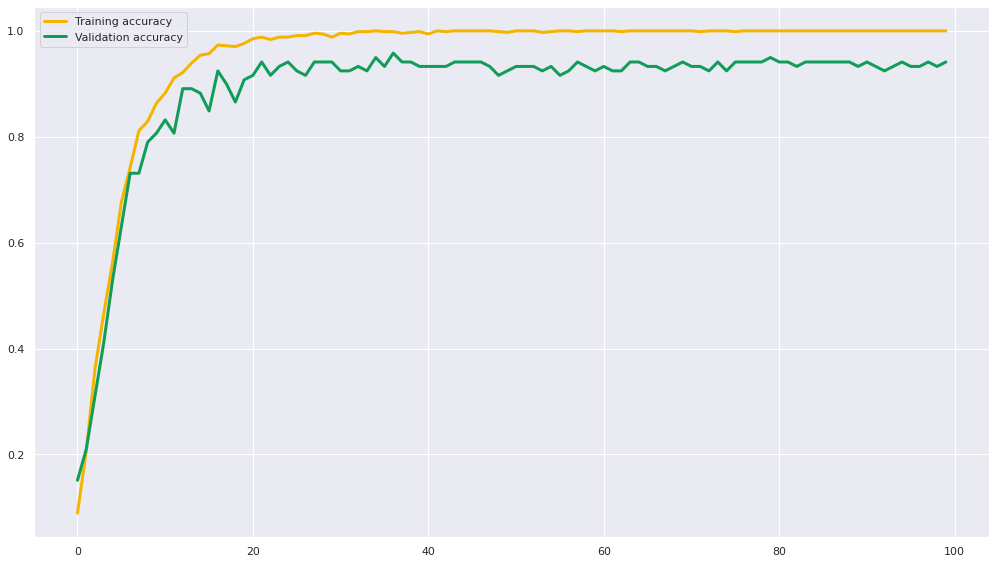

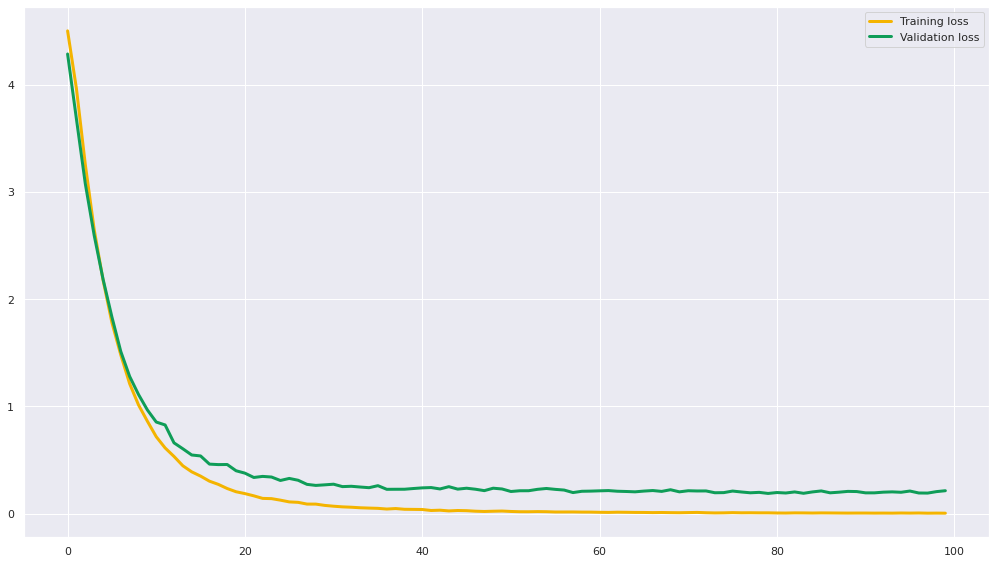

66
                                                                                                                            
The batch_size is: 64, The hidden_size is: 128, The dropout_rate is: 0.4, The optimizer_name is : SGD
Epoch 1/100
11/11 [==============================] - 2s 68ms/step - loss: 4.5991 - accuracy: 0.0119 - val_loss: 4.6001 - val_accuracy: 0.0084
Epoch 2/100
11/11 [==============================] - 0s 21ms/step - loss: 4.5836 - accuracy: 0.0163 - val_loss: 4.6115 - val_accuracy: 0.0084
Epoch 3/100
11/11 [==============================] - 0s 18ms/step - loss: 4.5624 - accuracy: 0.0238 - val_loss: 4.6161 - val_accuracy: 0.0336
Epoch 4/100
11/11 [==============================] - 0s 23ms/step - loss: 4.5465 - accuracy: 0.0282 - val_loss: 4.6272 - val_accuracy: 0.0000e+00
Epoch 5/100
11/11 [==============================] - 0s 23ms/step - loss: 4.5260 - accuracy: 0.0342 - val_loss: 4.6285 - val_accuracy: 0.0000e+00
Epoch 6/100
11/11 [==============================] -

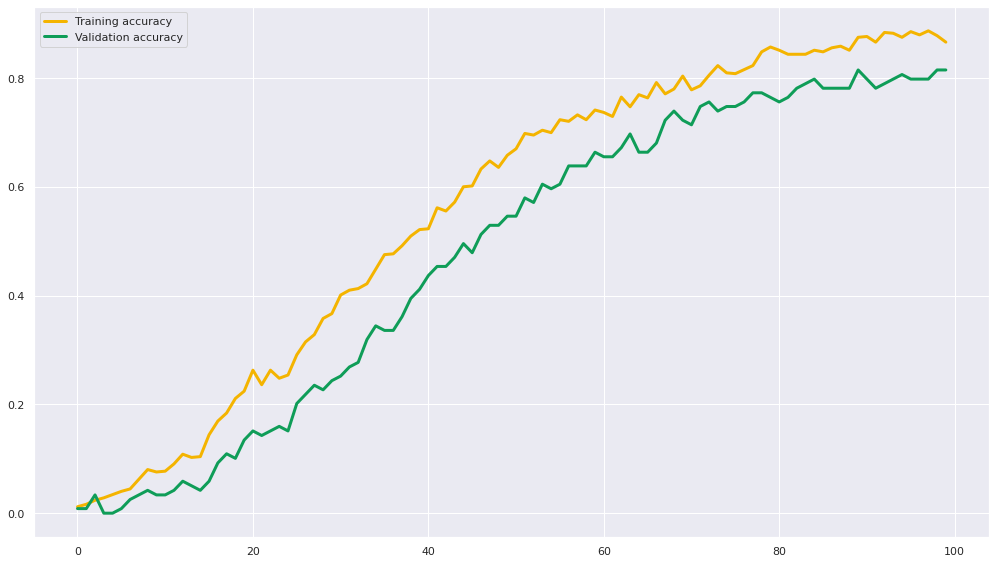

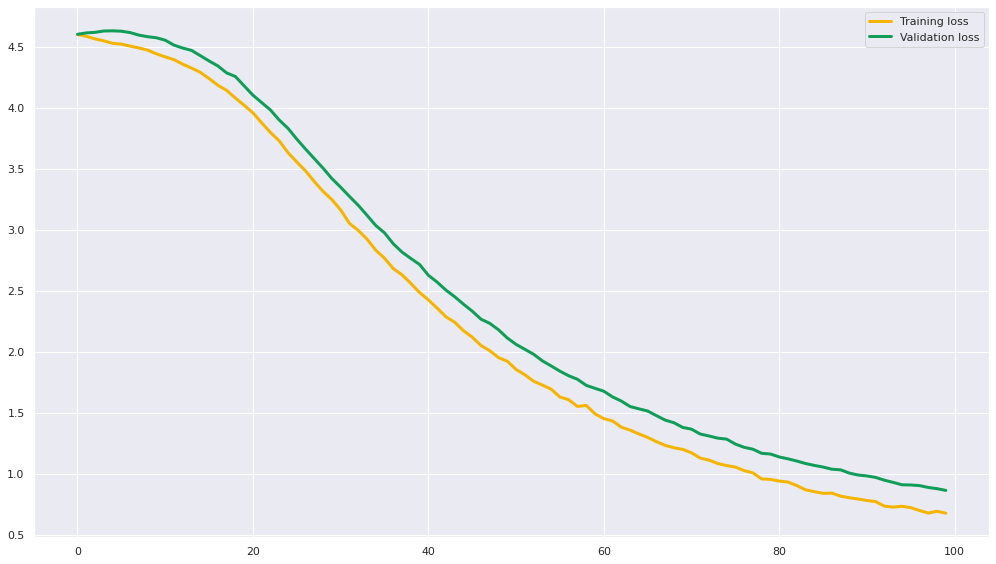

67
                                                                                                                            
The batch_size is: 64, The hidden_size is: 128, The dropout_rate is: 0.4, The optimizer_name is : Adam
Epoch 1/100
11/11 [==============================] - 2s 61ms/step - loss: 4.5904 - accuracy: 0.0104 - val_loss: 4.5818 - val_accuracy: 0.0252
Epoch 2/100
11/11 [==============================] - 0s 19ms/step - loss: 4.5641 - accuracy: 0.0505 - val_loss: 4.5639 - val_accuracy: 0.1008
Epoch 3/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5401 - accuracy: 0.1070 - val_loss: 4.5459 - val_accuracy: 0.1261
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5142 - accuracy: 0.1724 - val_loss: 4.5271 - val_accuracy: 0.1261
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 4.4879 - accuracy: 0.2051 - val_loss: 4.5045 - val_accuracy: 0.1261
Epoch 6/100
11/11 [==============================] - 0s 13m

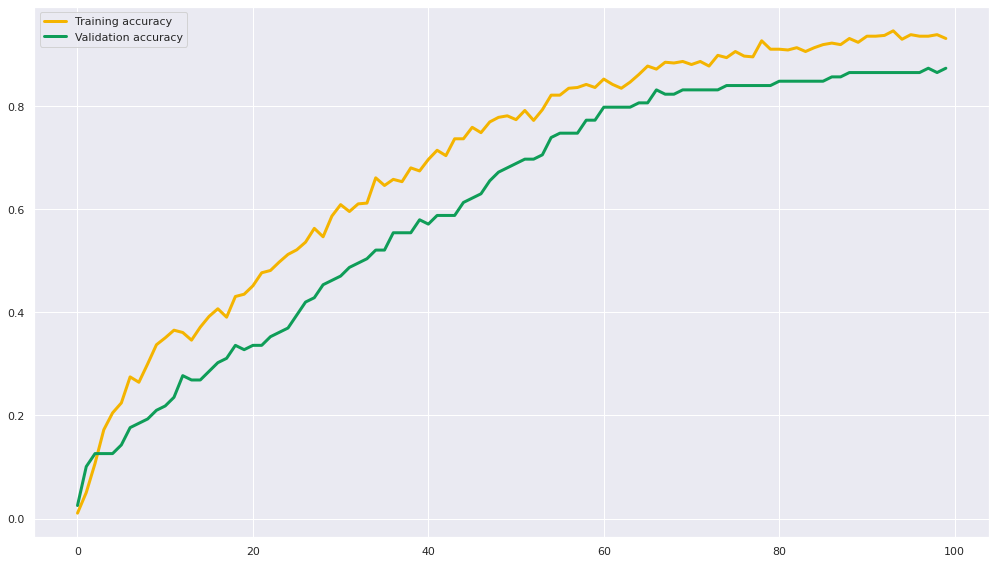

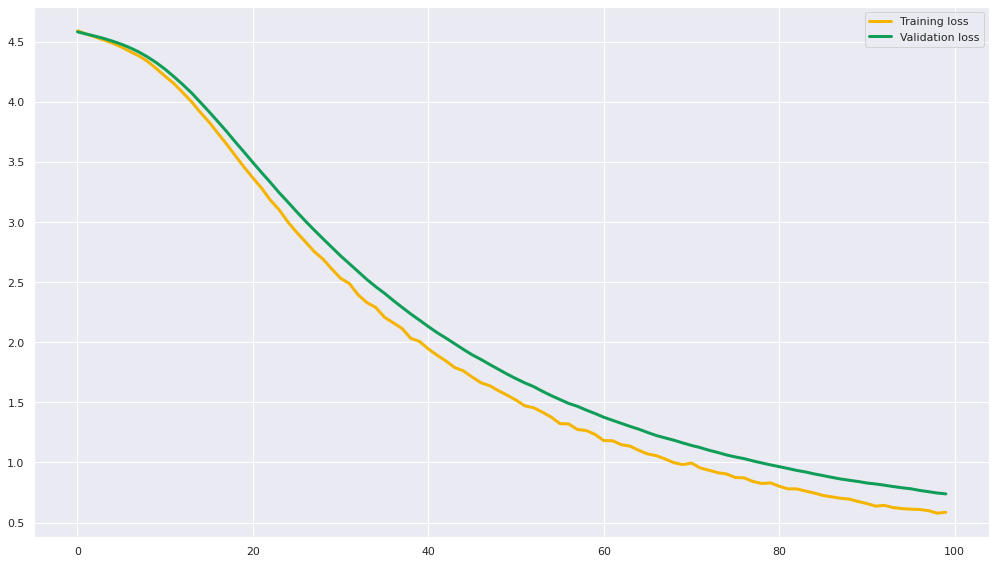

68
                                                                                                                            
The batch_size is: 64, The hidden_size is: 128, The dropout_rate is: 0.4, The optimizer_name is : RMSprop
Epoch 1/100
11/11 [==============================] - 1s 56ms/step - loss: 4.5180 - accuracy: 0.0728 - val_loss: 4.3602 - val_accuracy: 0.1765
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 4.0658 - accuracy: 0.2288 - val_loss: 3.8566 - val_accuracy: 0.1765
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 3.4407 - accuracy: 0.3135 - val_loss: 3.2959 - val_accuracy: 0.3025
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 2.8589 - accuracy: 0.4190 - val_loss: 2.8022 - val_accuracy: 0.4286
Epoch 5/100
11/11 [==============================] - 0s 18ms/step - loss: 2.4003 - accuracy: 0.5171 - val_loss: 2.4227 - val_accuracy: 0.4538
Epoch 6/100
11/11 [==============================] - 0s 

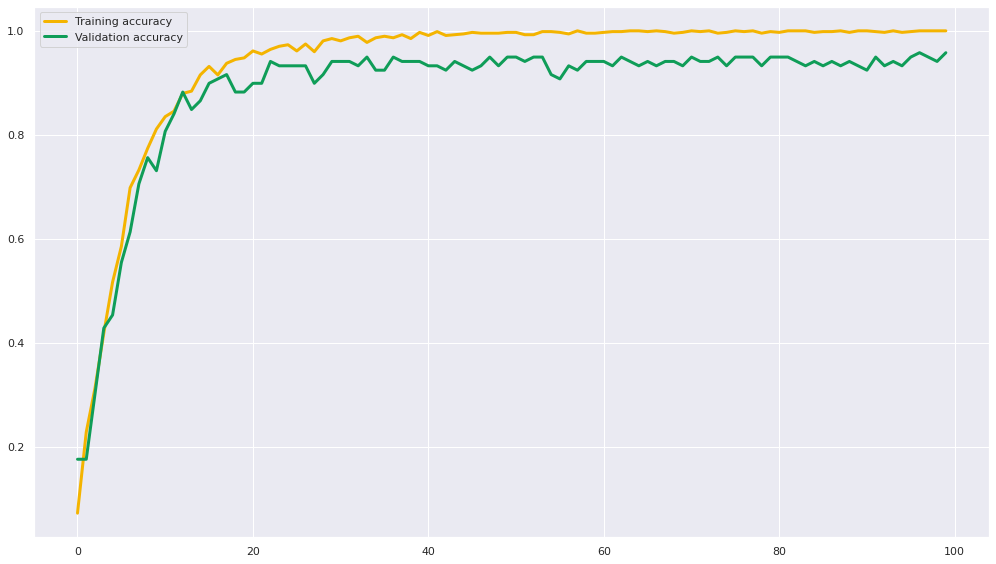

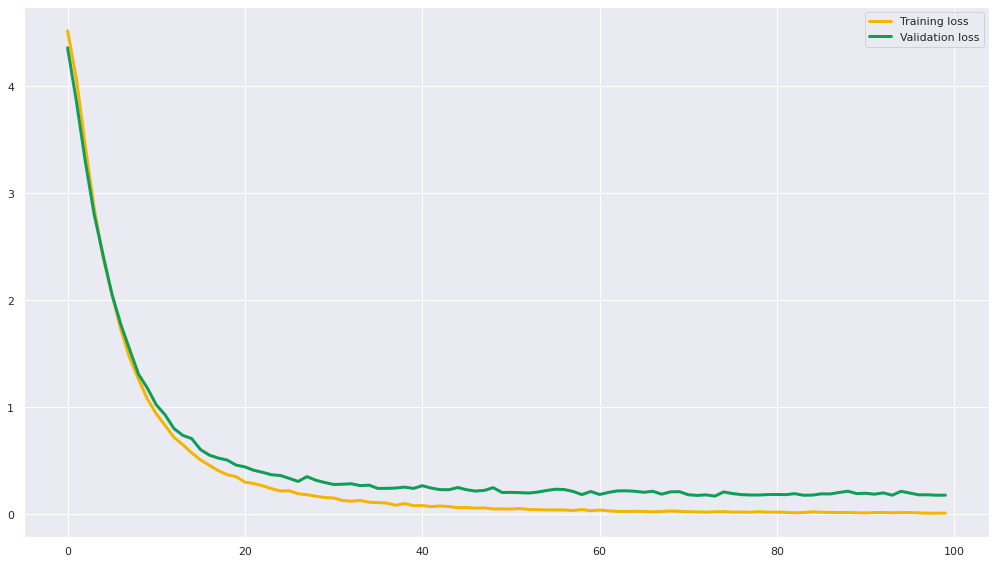

69
                                                                                                                            
The batch_size is: 64, The hidden_size is: 128, The dropout_rate is: 0.6, The optimizer_name is : SGD
Epoch 1/100
11/11 [==============================] - 1s 51ms/step - loss: 4.6020 - accuracy: 0.0045 - val_loss: 4.6062 - val_accuracy: 0.0084
Epoch 2/100
11/11 [==============================] - 0s 20ms/step - loss: 4.5900 - accuracy: 0.0134 - val_loss: 4.6147 - val_accuracy: 0.0084
Epoch 3/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5742 - accuracy: 0.0223 - val_loss: 4.6211 - val_accuracy: 0.0000e+00
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5552 - accuracy: 0.0178 - val_loss: 4.6217 - val_accuracy: 0.0084
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5454 - accuracy: 0.0208 - val_loss: 4.6202 - val_accuracy: 0.0084
Epoch 6/100
11/11 [==============================] - 0s 

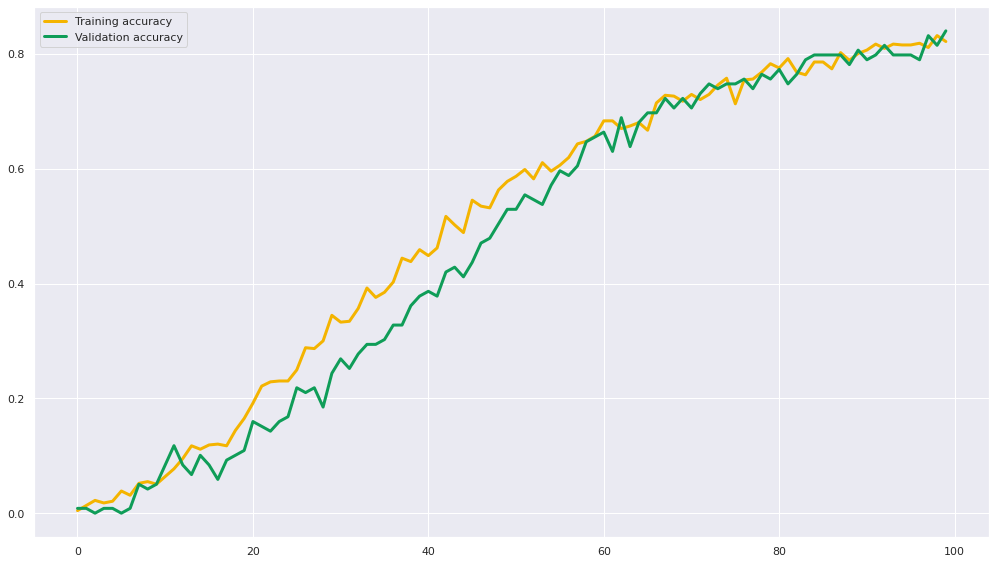

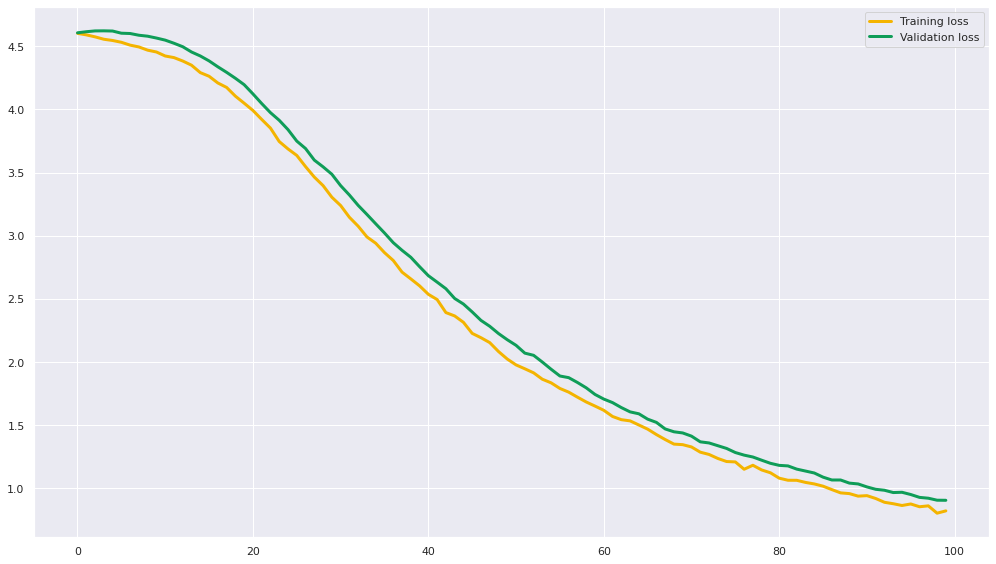

70
                                                                                                                            
The batch_size is: 64, The hidden_size is: 128, The dropout_rate is: 0.6, The optimizer_name is : Adam
Epoch 1/100
11/11 [==============================] - 1s 47ms/step - loss: 4.5953 - accuracy: 0.0104 - val_loss: 4.5876 - val_accuracy: 0.0168
Epoch 2/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5722 - accuracy: 0.0282 - val_loss: 4.5763 - val_accuracy: 0.0336
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5532 - accuracy: 0.0490 - val_loss: 4.5620 - val_accuracy: 0.0588
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5273 - accuracy: 0.0951 - val_loss: 4.5482 - val_accuracy: 0.0588
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5070 - accuracy: 0.1204 - val_loss: 4.5330 - val_accuracy: 0.0924
Epoch 6/100
11/11 [==============================] - 0s 13m

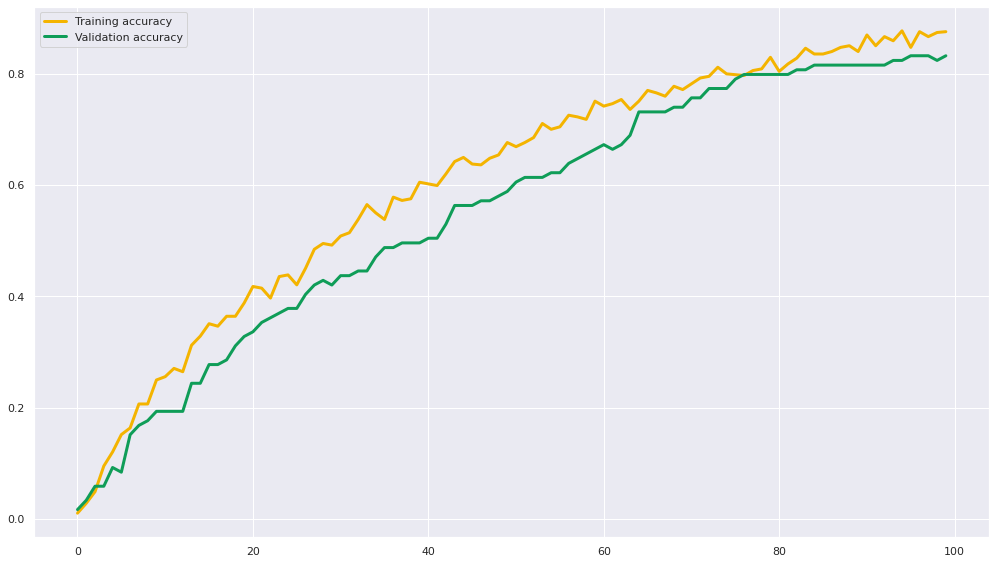

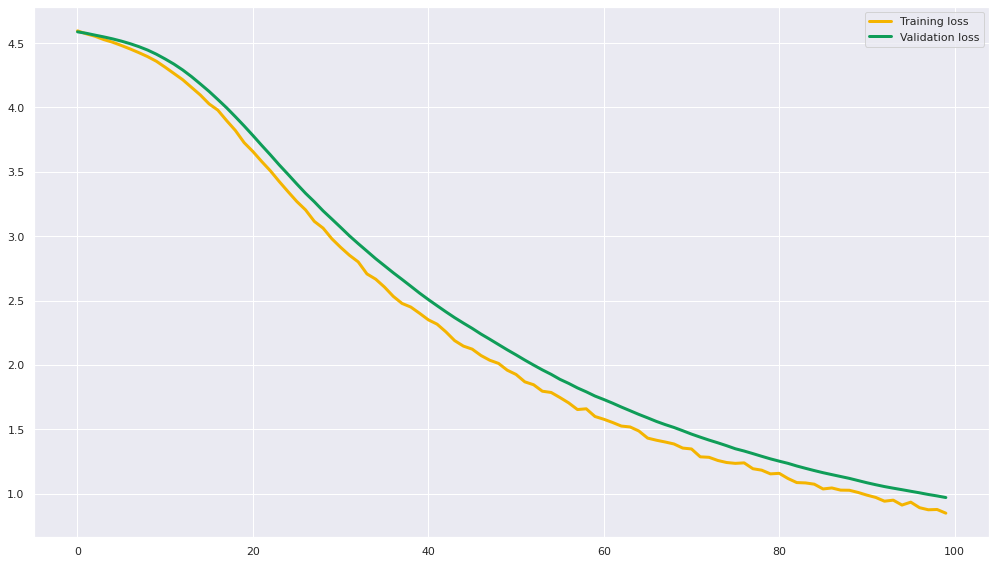

71
                                                                                                                            
The batch_size is: 64, The hidden_size is: 128, The dropout_rate is: 0.6, The optimizer_name is : RMSprop
Epoch 1/100
11/11 [==============================] - 1s 47ms/step - loss: 4.5348 - accuracy: 0.0416 - val_loss: 4.3863 - val_accuracy: 0.0840
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 4.2050 - accuracy: 0.1560 - val_loss: 4.0174 - val_accuracy: 0.1849
Epoch 3/100
11/11 [==============================] - 0s 13ms/step - loss: 3.7362 - accuracy: 0.2422 - val_loss: 3.5850 - val_accuracy: 0.2773
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 3.2556 - accuracy: 0.3432 - val_loss: 3.2096 - val_accuracy: 0.3445
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 2.8556 - accuracy: 0.3893 - val_loss: 2.8133 - val_accuracy: 0.3866
Epoch 6/100
11/11 [==============================] - 0s 

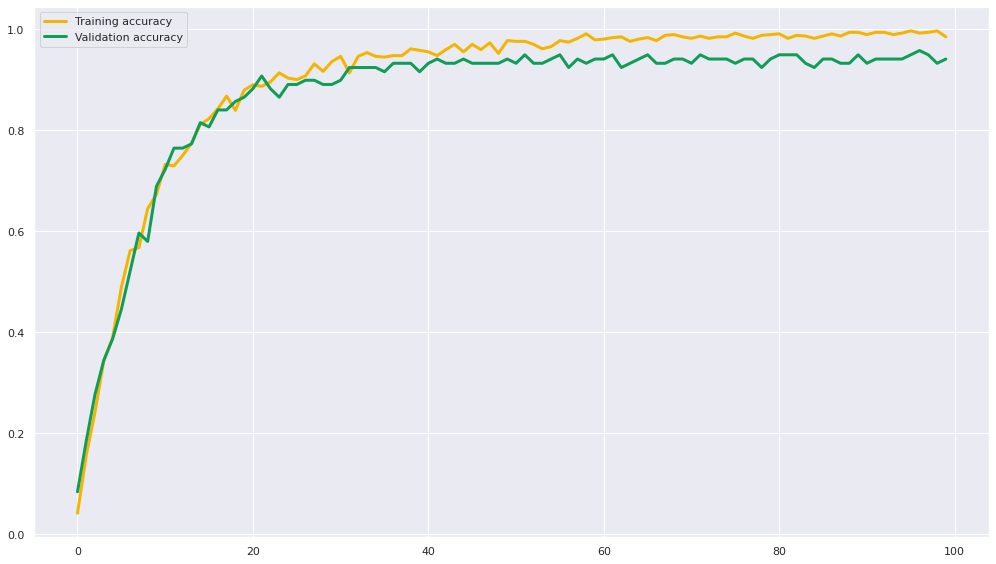

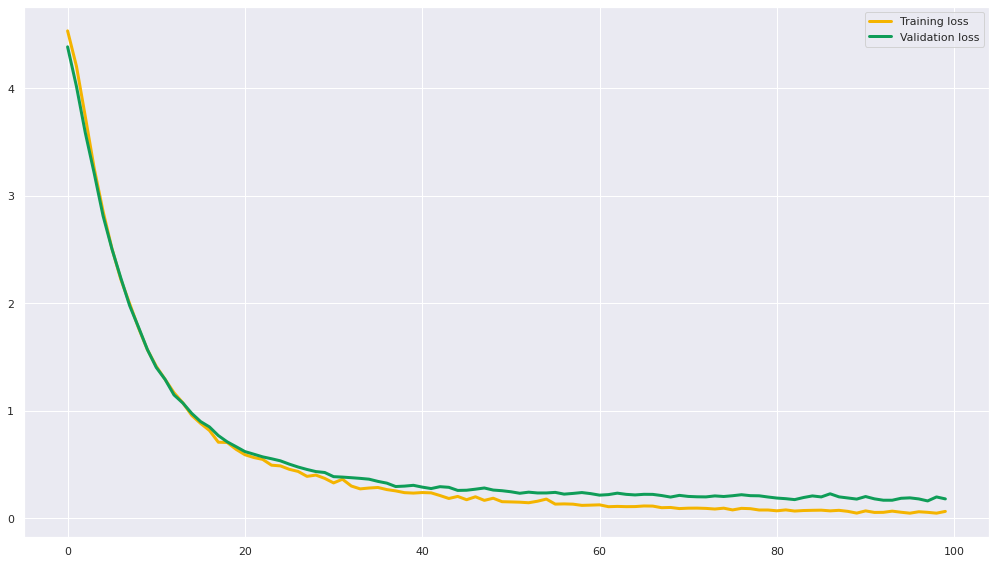

72
                                                                                                                            
The batch_size is: 64, The hidden_size is: 256, The dropout_rate is: 0.2, The optimizer_name is : SGD
Epoch 1/100
11/11 [==============================] - 1s 38ms/step - loss: 4.5949 - accuracy: 0.0149 - val_loss: 4.5913 - val_accuracy: 0.0168
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5764 - accuracy: 0.0342 - val_loss: 4.6003 - val_accuracy: 0.0252
Epoch 3/100
11/11 [==============================] - 0s 11ms/step - loss: 4.5541 - accuracy: 0.0520 - val_loss: 4.6105 - val_accuracy: 0.0168
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5319 - accuracy: 0.0446 - val_loss: 4.6113 - val_accuracy: 0.0084
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 4.5118 - accuracy: 0.0461 - val_loss: 4.6144 - val_accuracy: 0.0252
Epoch 6/100
11/11 [==============================] - 0s 13ms

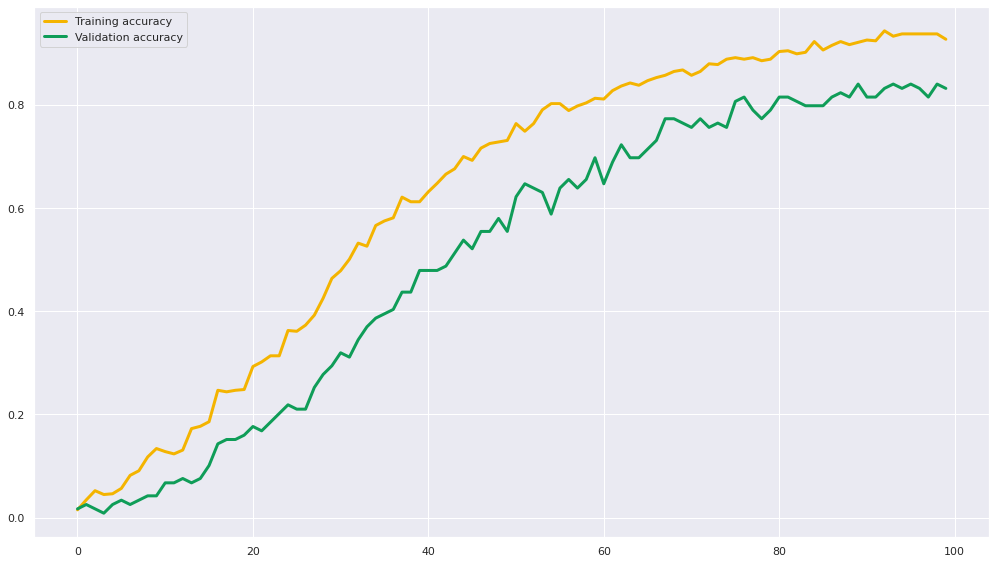

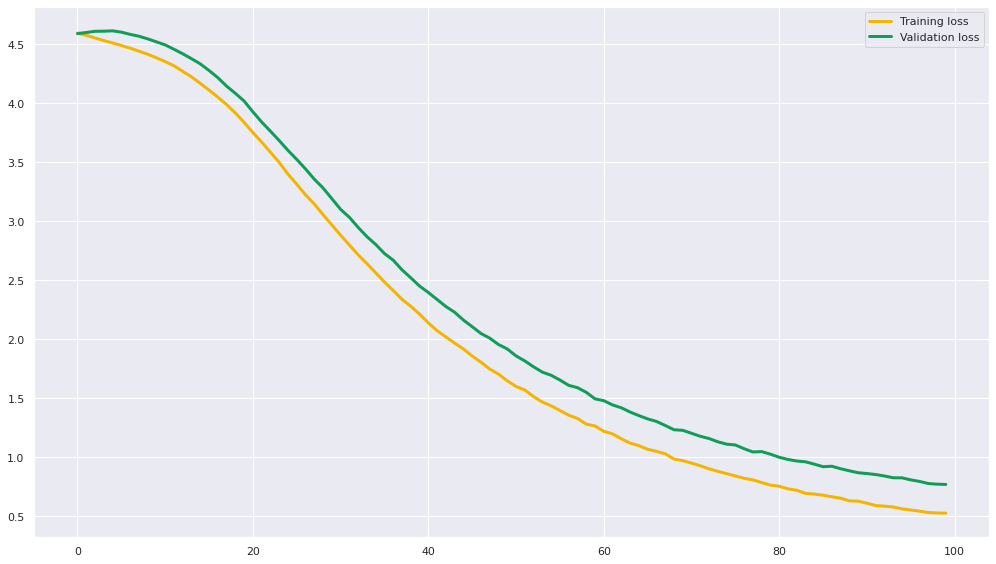

73
                                                                                                                            
The batch_size is: 64, The hidden_size is: 256, The dropout_rate is: 0.2, The optimizer_name is : Adam
Epoch 1/100
11/11 [==============================] - 2s 55ms/step - loss: 4.5836 - accuracy: 0.0238 - val_loss: 4.5631 - val_accuracy: 0.0924
Epoch 2/100
11/11 [==============================] - 0s 26ms/step - loss: 4.5379 - accuracy: 0.1902 - val_loss: 4.5317 - val_accuracy: 0.1765
Epoch 3/100
11/11 [==============================] - 0s 22ms/step - loss: 4.4936 - accuracy: 0.2957 - val_loss: 4.4968 - val_accuracy: 0.2101
Epoch 4/100
11/11 [==============================] - 0s 18ms/step - loss: 4.4424 - accuracy: 0.3700 - val_loss: 4.4557 - val_accuracy: 0.2269
Epoch 5/100
11/11 [==============================] - 0s 18ms/step - loss: 4.3875 - accuracy: 0.3670 - val_loss: 4.4059 - val_accuracy: 0.2605
Epoch 6/100
11/11 [==============================] - 0s 18m

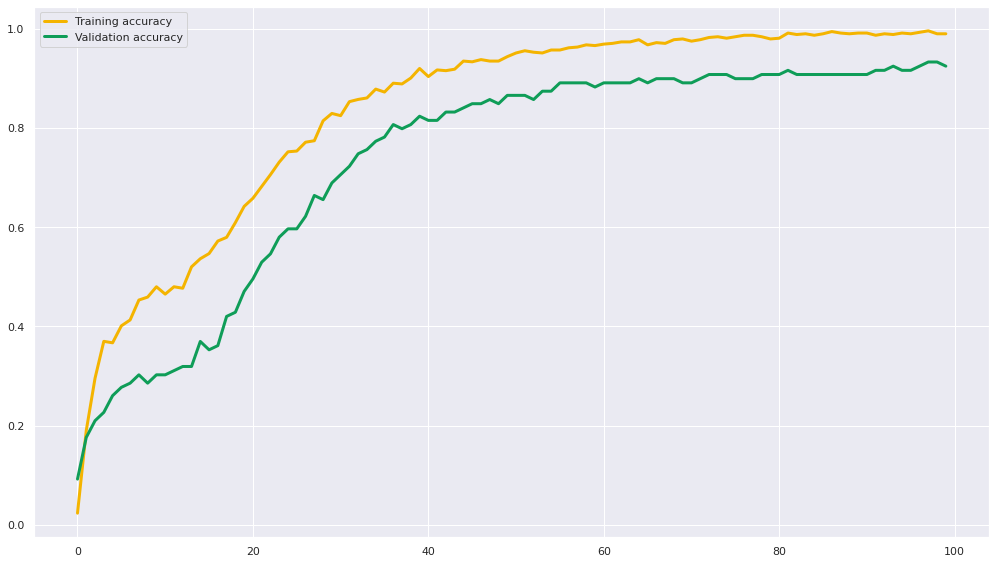

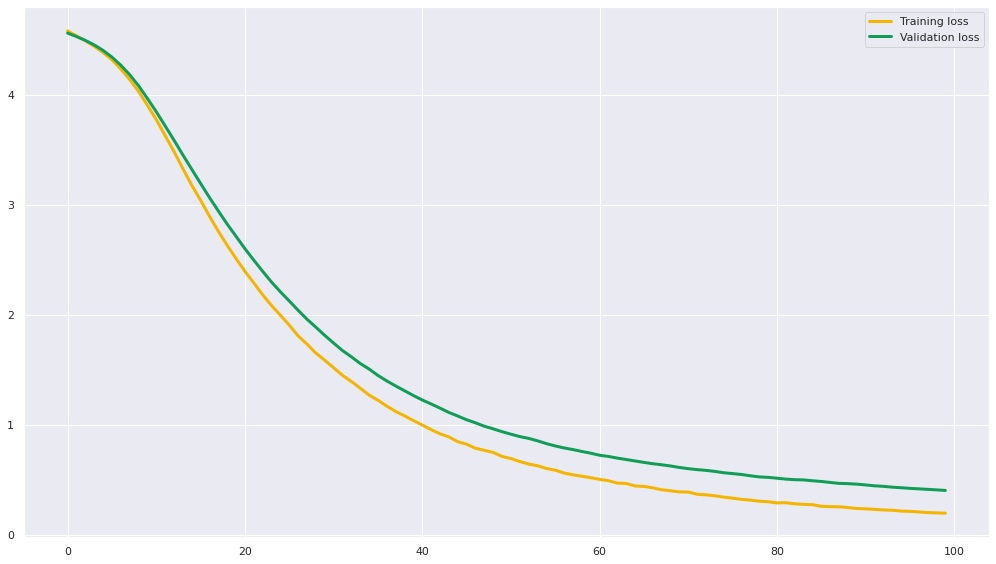

74
                                                                                                                            
The batch_size is: 64, The hidden_size is: 256, The dropout_rate is: 0.2, The optimizer_name is : RMSprop
Epoch 1/100
11/11 [==============================] - 1s 57ms/step - loss: 4.4480 - accuracy: 0.0892 - val_loss: 4.1329 - val_accuracy: 0.0924
Epoch 2/100
11/11 [==============================] - 0s 17ms/step - loss: 3.6570 - accuracy: 0.2660 - val_loss: 3.2715 - val_accuracy: 0.2941
Epoch 3/100
11/11 [==============================] - 0s 23ms/step - loss: 2.7801 - accuracy: 0.4339 - val_loss: 2.5409 - val_accuracy: 0.4454
Epoch 4/100
11/11 [==============================] - 0s 21ms/step - loss: 2.1046 - accuracy: 0.5721 - val_loss: 2.0352 - val_accuracy: 0.5378
Epoch 5/100
11/11 [==============================] - 0s 22ms/step - loss: 1.6041 - accuracy: 0.7058 - val_loss: 1.5620 - val_accuracy: 0.6723
Epoch 6/100
11/11 [==============================] - 0s 

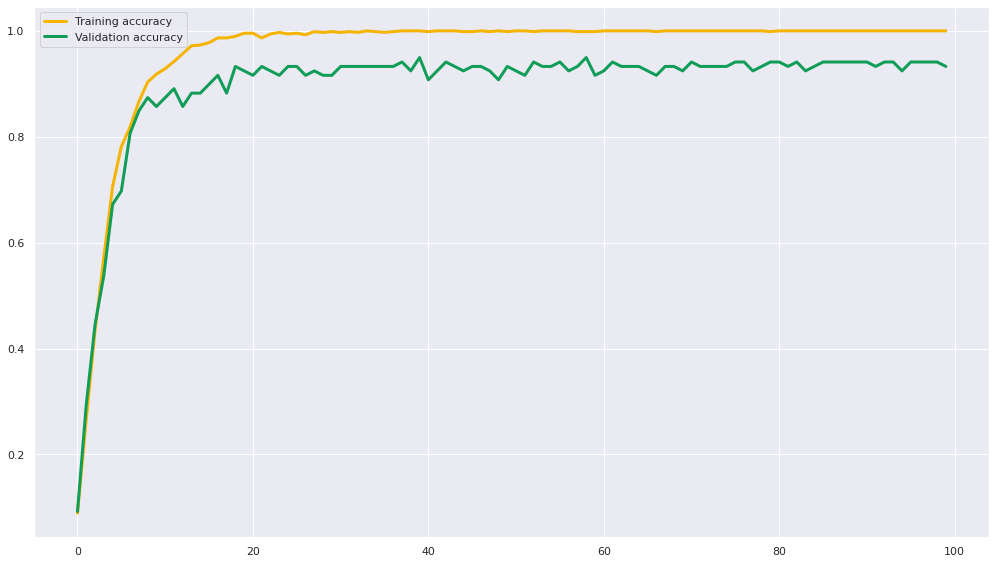

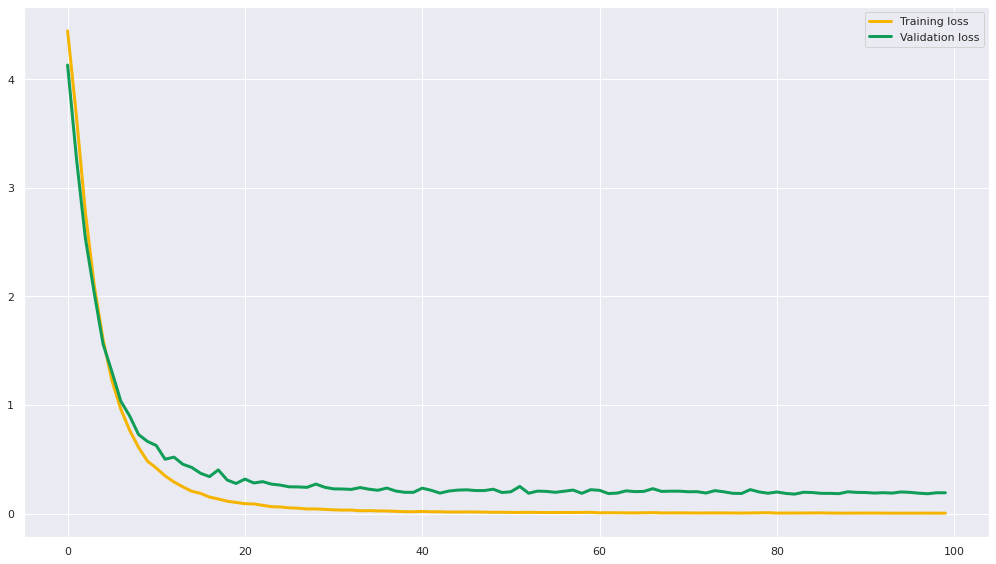

75
                                                                                                                            
The batch_size is: 64, The hidden_size is: 256, The dropout_rate is: 0.4, The optimizer_name is : SGD
Epoch 1/100
11/11 [==============================] - 2s 150ms/step - loss: 4.5977 - accuracy: 0.0089 - val_loss: 4.5979 - val_accuracy: 0.0084
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5769 - accuracy: 0.0208 - val_loss: 4.6095 - val_accuracy: 0.0000e+00
Epoch 3/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5558 - accuracy: 0.0312 - val_loss: 4.6190 - val_accuracy: 0.0000e+00
Epoch 4/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5340 - accuracy: 0.0253 - val_loss: 4.6244 - val_accuracy: 0.0084
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5152 - accuracy: 0.0416 - val_loss: 4.6201 - val_accuracy: 0.0168
Epoch 6/100
11/11 [==============================] 

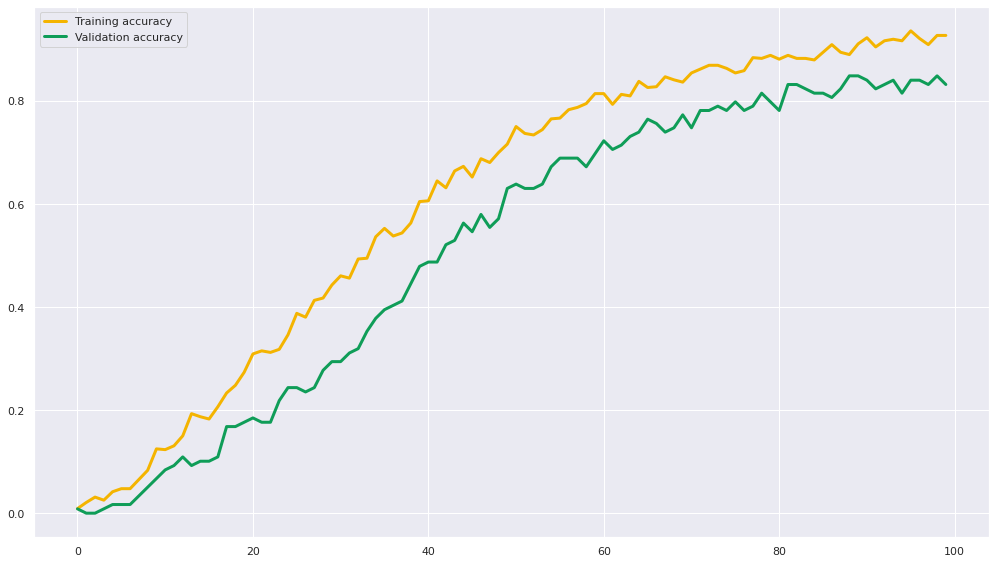

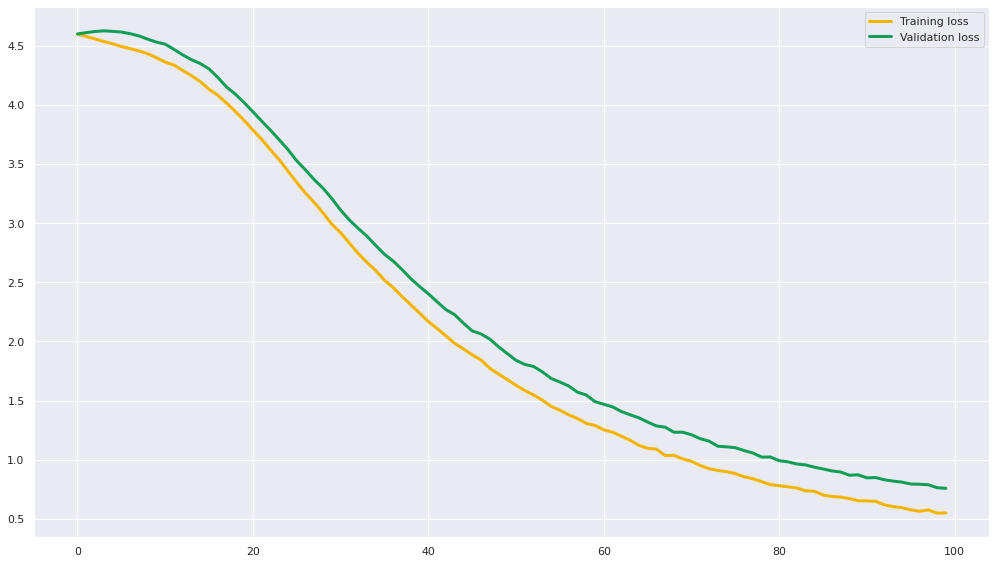

76
                                                                                                                            
The batch_size is: 64, The hidden_size is: 256, The dropout_rate is: 0.4, The optimizer_name is : Adam
Epoch 1/100
11/11 [==============================] - 2s 48ms/step - loss: 4.5888 - accuracy: 0.0134 - val_loss: 4.5705 - val_accuracy: 0.0504
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 4.5469 - accuracy: 0.1278 - val_loss: 4.5418 - val_accuracy: 0.1513
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5087 - accuracy: 0.2155 - val_loss: 4.5112 - val_accuracy: 0.2437
Epoch 4/100
11/11 [==============================] - 0s 18ms/step - loss: 4.4653 - accuracy: 0.3195 - val_loss: 4.4737 - val_accuracy: 0.2269
Epoch 5/100
11/11 [==============================] - 0s 15ms/step - loss: 4.4166 - accuracy: 0.3403 - val_loss: 4.4334 - val_accuracy: 0.2689
Epoch 6/100
11/11 [==============================] - 0s 14m

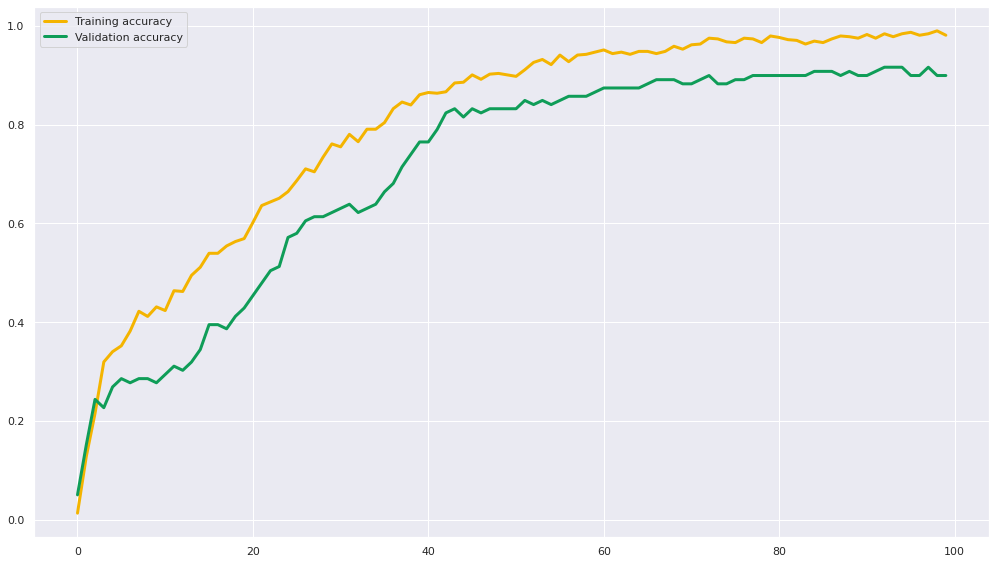

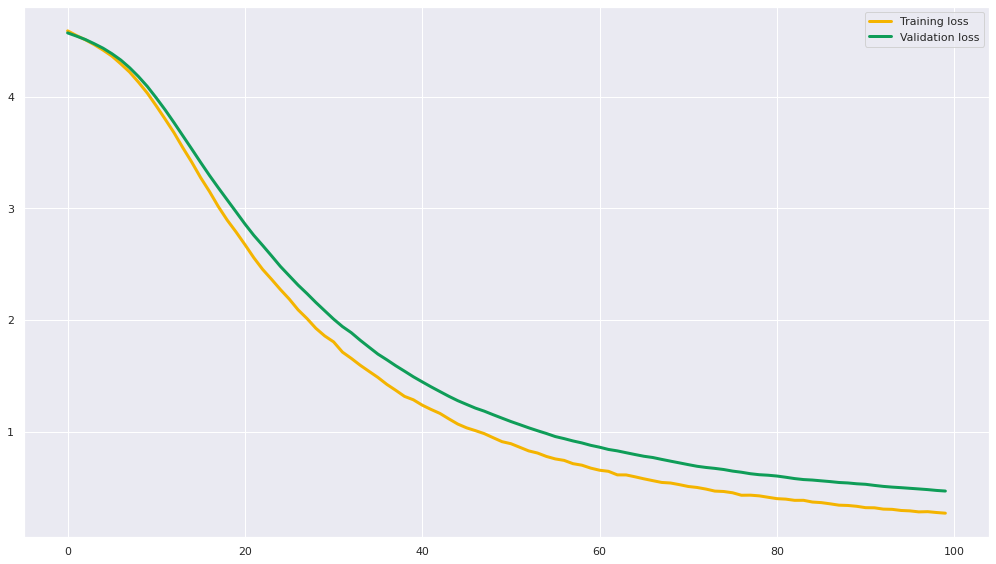

77
                                                                                                                            
The batch_size is: 64, The hidden_size is: 256, The dropout_rate is: 0.4, The optimizer_name is : RMSprop
Epoch 1/100
11/11 [==============================] - 2s 72ms/step - loss: 4.4906 - accuracy: 0.0565 - val_loss: 4.2058 - val_accuracy: 0.1681
Epoch 2/100
11/11 [==============================] - 0s 18ms/step - loss: 3.8187 - accuracy: 0.2303 - val_loss: 3.4845 - val_accuracy: 0.2437
Epoch 3/100
11/11 [==============================] - 0s 20ms/step - loss: 3.0066 - accuracy: 0.3863 - val_loss: 2.7961 - val_accuracy: 0.3529
Epoch 4/100
11/11 [==============================] - 0s 22ms/step - loss: 2.3411 - accuracy: 0.5453 - val_loss: 2.2533 - val_accuracy: 0.4706
Epoch 5/100
11/11 [==============================] - 0s 25ms/step - loss: 1.8299 - accuracy: 0.6285 - val_loss: 1.8124 - val_accuracy: 0.5714
Epoch 6/100
11/11 [==============================] - 0s 

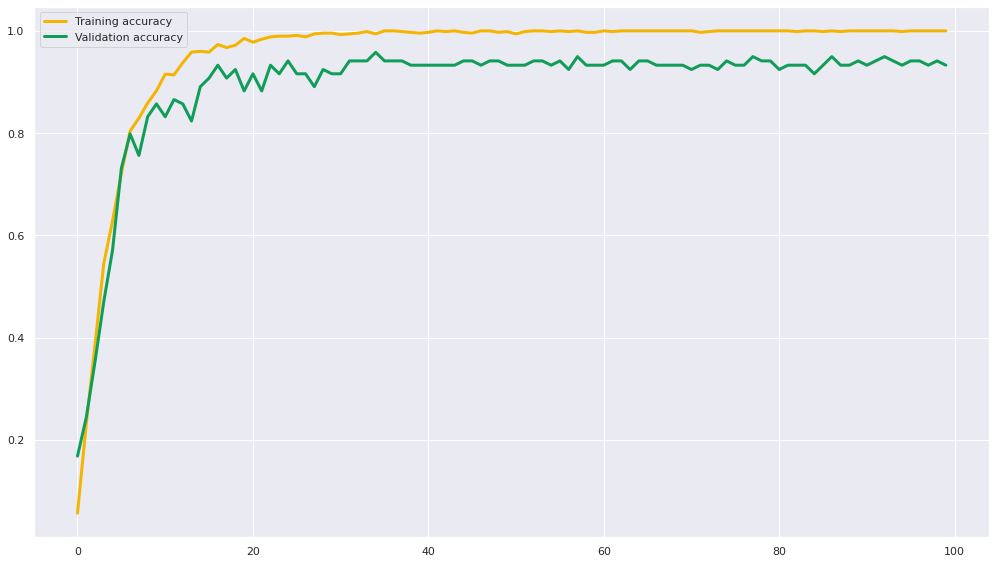

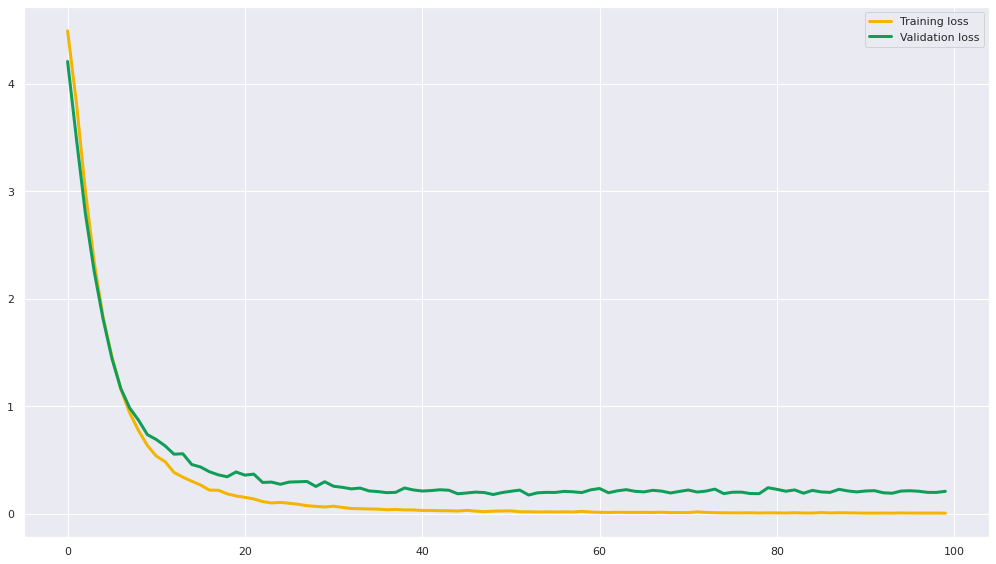

78
                                                                                                                            
The batch_size is: 64, The hidden_size is: 256, The dropout_rate is: 0.6, The optimizer_name is : SGD
Epoch 1/100
11/11 [==============================] - 1s 52ms/step - loss: 4.6002 - accuracy: 0.0119 - val_loss: 4.5981 - val_accuracy: 0.0084
Epoch 2/100
11/11 [==============================] - 0s 22ms/step - loss: 4.5834 - accuracy: 0.0267 - val_loss: 4.6085 - val_accuracy: 0.0168
Epoch 3/100
11/11 [==============================] - 0s 15ms/step - loss: 4.5616 - accuracy: 0.0297 - val_loss: 4.6091 - val_accuracy: 0.0168
Epoch 4/100
11/11 [==============================] - 0s 17ms/step - loss: 4.5408 - accuracy: 0.0431 - val_loss: 4.6071 - val_accuracy: 0.0252
Epoch 5/100
11/11 [==============================] - 0s 16ms/step - loss: 4.5253 - accuracy: 0.0342 - val_loss: 4.6041 - val_accuracy: 0.0336
Epoch 6/100
11/11 [==============================] - 0s 20ms

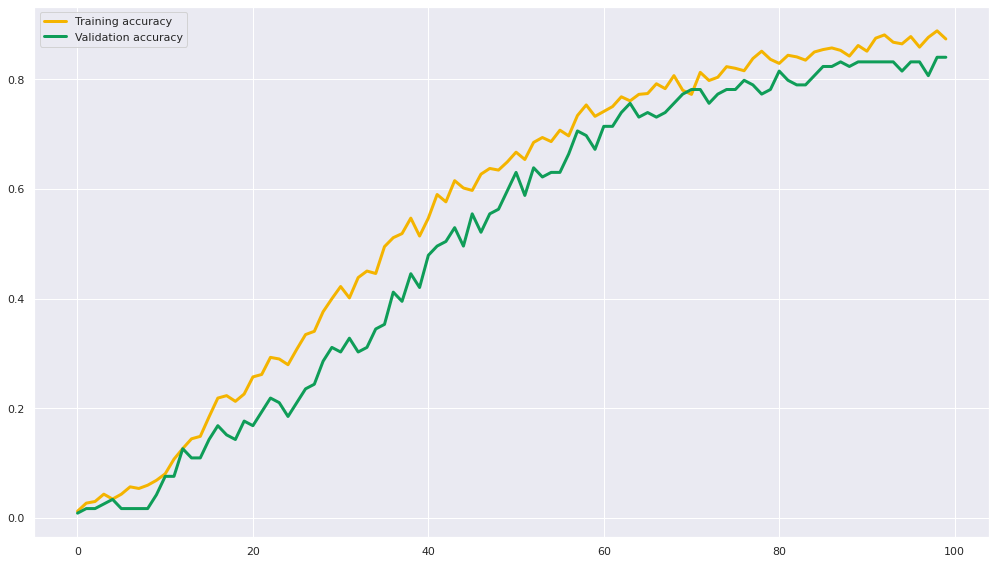

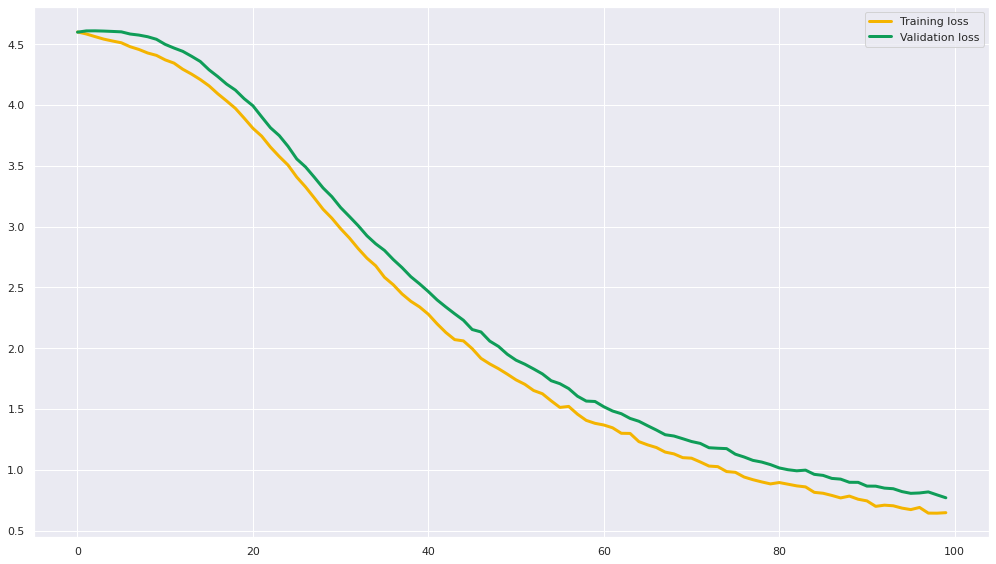

79
                                                                                                                            
The batch_size is: 64, The hidden_size is: 256, The dropout_rate is: 0.6, The optimizer_name is : Adam
Epoch 1/100
11/11 [==============================] - 2s 54ms/step - loss: 4.5835 - accuracy: 0.0312 - val_loss: 4.5724 - val_accuracy: 0.0504
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 4.5522 - accuracy: 0.0594 - val_loss: 4.5490 - val_accuracy: 0.1681
Epoch 3/100
11/11 [==============================] - 0s 17ms/step - loss: 4.5162 - accuracy: 0.1530 - val_loss: 4.5232 - val_accuracy: 0.2521
Epoch 4/100
11/11 [==============================] - 0s 18ms/step - loss: 4.4834 - accuracy: 0.2229 - val_loss: 4.4956 - val_accuracy: 0.2605
Epoch 5/100
11/11 [==============================] - 0s 16ms/step - loss: 4.4419 - accuracy: 0.2615 - val_loss: 4.4630 - val_accuracy: 0.2773
Epoch 6/100
11/11 [==============================] - 0s 16m

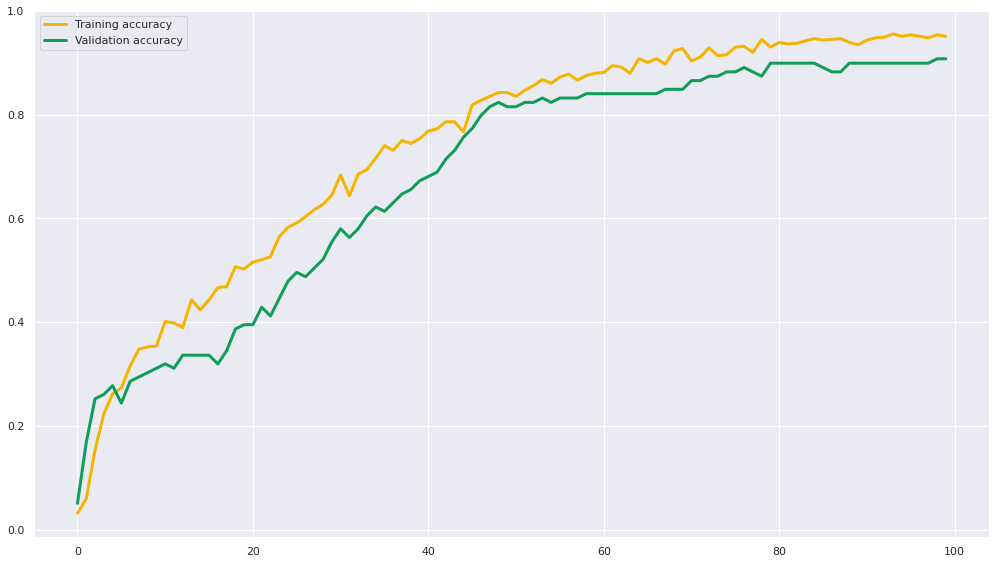

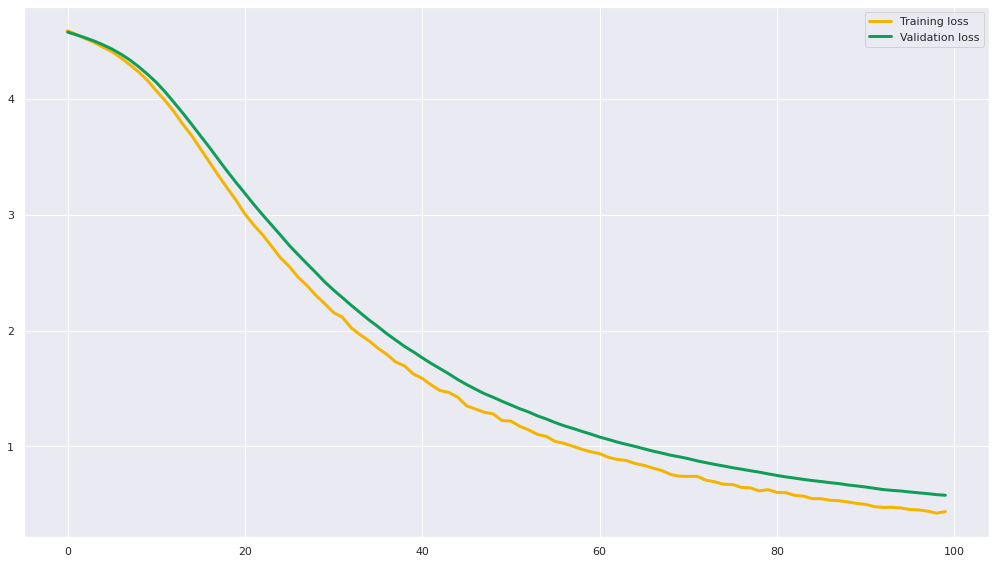

80
                                                                                                                            
The batch_size is: 64, The hidden_size is: 256, The dropout_rate is: 0.6, The optimizer_name is : RMSprop
Epoch 1/100
11/11 [==============================] - 1s 50ms/step - loss: 4.5070 - accuracy: 0.0505 - val_loss: 4.2951 - val_accuracy: 0.1429
Epoch 2/100
11/11 [==============================] - 0s 17ms/step - loss: 4.0133 - accuracy: 0.1828 - val_loss: 3.7369 - val_accuracy: 0.1933
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 3.3356 - accuracy: 0.3105 - val_loss: 3.1868 - val_accuracy: 0.3025
Epoch 4/100
11/11 [==============================] - 0s 17ms/step - loss: 2.7483 - accuracy: 0.4383 - val_loss: 2.6708 - val_accuracy: 0.4286
Epoch 5/100
11/11 [==============================] - 0s 16ms/step - loss: 2.2961 - accuracy: 0.5082 - val_loss: 2.2231 - val_accuracy: 0.5042
Epoch 6/100
11/11 [==============================] - 0s 

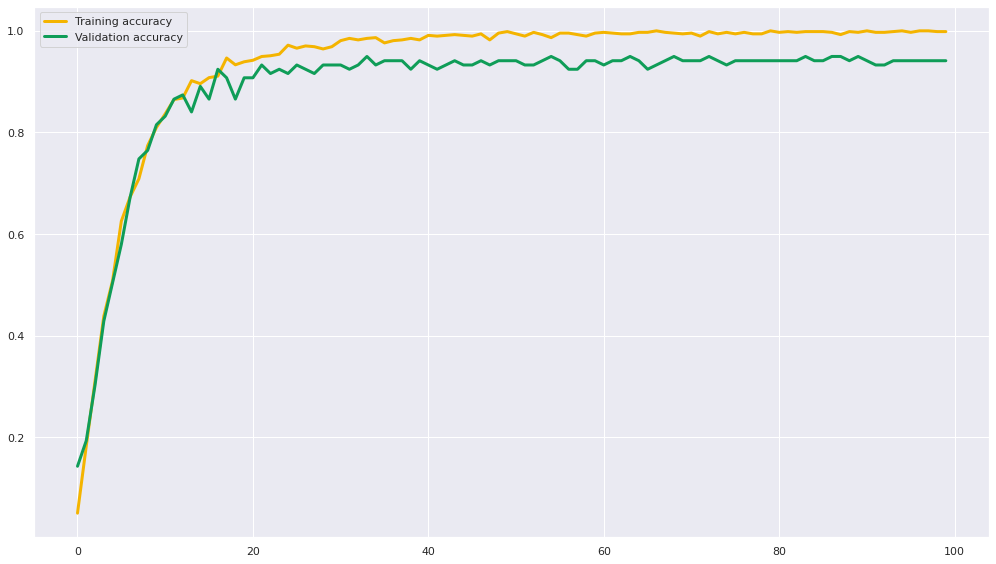

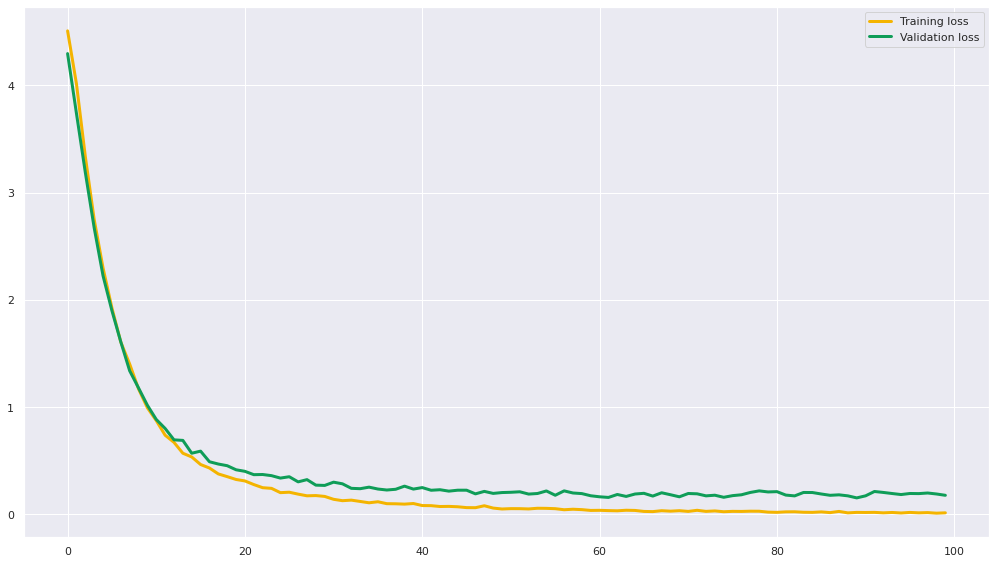

81
                                                                                                                            


In [21]:
# Build and train the model with different hyperparameters
iter = 0
for batch_size in [16, 32, 64]:
    for hidden_size in [64,128, 256]:
        for dropout_rate in [0.2, 0.4, 0.6]:
            for optimizer_name in ['SGD', 'Adam', 'RMSprop']:
                print(blue(f'The batch_size is: {batch_size}, The hidden_size is: {hidden_size}, The dropout_rate is: {dropout_rate}, The optimizer_name is : {optimizer_name}',['bold', 'underlined']) )
                model_1, history_1 = MLP_Model(Optimizer= optimizer_name , Batch_size = batch_size,  Hidden_size = hidden_size, Dropout_rate = dropout_rate)
                model_1.summary()
                model_1.evaluate(xTest, yTest)
                #virtualization for the training accuracy and validation accuracy throw the epochs number
                Virtualization_Acc(model_1,history_1)
                #virtualization for the training loss and validation loss throw the epochs number
                Virtualization_Loss(model_1,history_1)
                print(blue('============================================================================================================',['bold']))
                iter = iter+1
                print(red(iter,['bold']))
                print('                                                                                                                            ')

# Thank You